In [2]:
!pip install gym[classic_control]
!pip install pyglet
!pip install gym --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 73.3 MB/s eta 0:00:00
  Attempting uninstall: pygame
    Found existing installation: pygame 2.6.1
    Uninstalling pygame-2.6.1:
      Successfully uninstalled pygame-2.6.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 945.1/945.1 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.7/721.7 kB 9.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827625 sha256=dfeffaf087c16e447ea0ab852b7abd7b861706adfceee100bb40e843ae3f9137
  Stored in directory: /root/.cache/pip/wheels/b9/22/6d/3e7b32d98451b4cd9d12417052affbeeeea012955d437da1da
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.25.2
    Uninstalling gym-0.25.2:
      Successfully uninstalled gym-0.25.2
ERROR: pip's dependency resolver does not currently 

In [3]:
%%bash
# Install additional packages for visualization
sudo apt-get install -y python-opengl > /dev/null 2>&1
pip install git+https://github.com/tensorflow/docs > /dev/null 2>&1

Gym version: 0.26.2


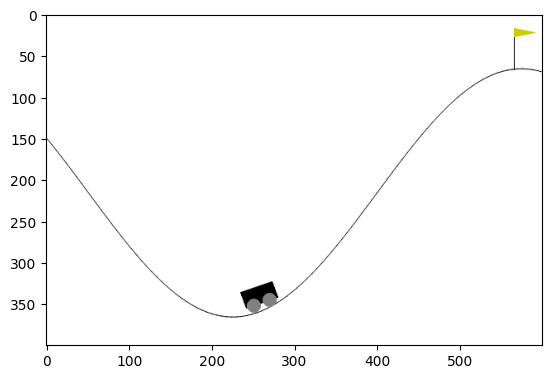

In [4]:
import gym
import math
import random
import numpy as np
import collections
import statistics
import tensorflow as tf
import tqdm
import matplotlib.pyplot as plt
from typing import Any, List, Sequence, Tuple

# Set seed for experiment reproducibility
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

eps = np.finfo(np.float32).eps.item()

print("Gym version:", gym.__version__)

env_cartpole = gym.make('MountainCar-v0',render_mode="rgb_array")
env_cartpole.reset()

plt.imshow(env_cartpole.render());

In [5]:
def average_episodic_return(env, agent, episodes=10, max_steps_per_episode=1000):
    epoch_rewards = []
    for episode in range(episodes):
        total_rewards = 0
        initial_obs, info = env.reset()  # 解包返回值
        obs = initial_obs  # 使用观察值作为初始状态
        for t in range(max_steps_per_episode):
            out = agent(obs)
            assert ("Action" in out), "The key 'Action' was missing from the agents output."
            obs, rew, done, _, _ = env.step(out["Action"])
            total_rewards += rew
            if done:
                break
        epoch_rewards.append(total_rewards)
    return {
        "AverageEpisodicReturn": np.mean(epoch_rewards),
        "StandardDeviation": np.sqrt(np.var(epoch_rewards))
    }


from IPython.display import HTML
import matplotlib.animation

def animate_frames(frames):
    new_height = 2.2
    original_height = frames[0].shape[0]
    original_width = frames[0].shape[1]
    new_width = (new_height / original_height) * original_width
    fig = plt.figure(figsize=(new_width, new_height), dpi = 120)

    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.set_axis_off()
    fig.add_axes(ax)
    patch = ax.imshow(frames[0], aspect='auto', animated=True, interpolation='bilinear')
    animate = lambda i: patch.set_data(frames[i])

    ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(frames), interval = 50)
    plt.close()
    return HTML(ani.to_jshtml())

def animate_agent(env, agent, max_steps=500):
    initial_obs, info = env.reset()  # 解包返回值
    obs = initial_obs  # 使用观察值作为初始状态
    frames = collections.deque()
    frames.append(env.render())
    for _ in range(max_steps):
        out = agent(obs)
        assert ("Action" in out), "The key 'Action' was missing from the agents output."
        action = out["Action"]
        obs, rew, done, _, _ = env.step(action)
        frames.append(env.render())
        if done:
            break
    return animate_frames(frames)


def agent_left(observation):
    return {"Action":0}
def agent_right(observation):
    return {"Action":1}
def agent_random(observation):
    return {"Action":np.random.choice([0, 1])}

print(average_episodic_return(env_cartpole, agent_random))

animate_agent(env_cartpole, agent_random)

/usr/local/lib/python3.10/dist-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


{'AverageEpisodicReturn': -1000.0, 'StandardDeviation': 0.0}


In [6]:
from tensorflow.keras import layers
class ActorCritic(tf.keras.Model):
  """Combined actor-critic network."""

  def __init__(
      self,
      num_actions: int,
      num_hidden_units: int):
    """Initialize."""
    super().__init__()

    self.common = layers.Dense(num_hidden_units, activation="relu")
    self.dense = layers.Dense(num_hidden_units, activation="relu")
    self.actor = layers.Dense(num_actions)
    self.critic = layers.Dense(1)

  def call(self, inputs: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
    x = self.common(inputs)
    x = self.dense(x)
    return self.actor(x), self.critic(x)

In [7]:
# Wrap Gym's `env.step` call as an operation in a TensorFlow function.
# This would allow it to be included in a callable TensorFlow graph.

def env_step(action: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
  """Returns state, reward and done flag given an action."""

  state, reward, done, truncated, info = env.step(action)
  return (state.astype(np.float32),
          np.array(reward, np.int32),
          np.array(done, np.int32))


def tf_env_step(action: tf.Tensor) -> List[tf.Tensor]:
  return tf.numpy_function(env_step, [action],
                           [tf.float32, tf.int32, tf.int32])

In [8]:
def run_episode(
    initial_state: tf.Tensor,
    model: tf.keras.Model,
    max_steps: int) -> Tuple[tf.Tensor, tf.Tensor, tf.Tensor]:
  """Runs a single episode to collect training data."""

  action_probs = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
  values = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)
  rewards = tf.TensorArray(dtype=tf.int32, size=0, dynamic_size=True)

  initial_state_shape = initial_state.shape
  state = initial_state

  for t in tf.range(max_steps):
    # Convert state into a batched tensor (batch size = 1)
    state = tf.expand_dims(state, 0)

    # Run the model and to get action probabilities and critic value
    action_logits_t, value = model(state)

    # Sample next action from the action probability distribution
    action = tf.random.categorical(action_logits_t, 1)[0, 0]
    action_probs_t = tf.nn.softmax(action_logits_t)

    # Store critic values
    values = values.write(t, tf.squeeze(value))

    # Store log probability of the action chosen
    action_probs = action_probs.write(t, action_probs_t[0, action])

    # Apply action to the environment to get next state and reward
    state, reward, done = tf_env_step(action)
    state.set_shape(initial_state_shape)

    # Store reward
    rewards = rewards.write(t, reward)

    if tf.cast(done, tf.bool):
      break

  action_probs = action_probs.stack()
  values = values.stack()
  rewards = rewards.stack()

  return action_probs, values, rewards

In [9]:
def get_expected_return(
    rewards: tf.Tensor,
    gamma: float,
    standardize: bool = True) -> tf.Tensor:
  """Compute expected returns per timestep."""

  n = tf.shape(rewards)[0]
  returns = tf.TensorArray(dtype=tf.float32, size=n)

  # Start from the end of `rewards` and accumulate reward sums
  # into the `returns` array
  rewards = tf.cast(rewards[::-1], dtype=tf.float32)
  discounted_sum = tf.constant(0.0)
  discounted_sum_shape = discounted_sum.shape
  for i in tf.range(n):
    reward = rewards[i]
    discounted_sum = reward + gamma * discounted_sum
    discounted_sum.set_shape(discounted_sum_shape)
    returns = returns.write(i, discounted_sum)
  returns = returns.stack()[::-1]

  if standardize:
    returns = ((returns - tf.math.reduce_mean(returns)) /
               (tf.math.reduce_std(returns) + eps))

  return returns

In [10]:
huber_loss = tf.keras.losses.Huber(reduction=tf.keras.losses.Reduction.SUM)

def compute_loss(
    action_probs: tf.Tensor,
    values: tf.Tensor,
    returns: tf.Tensor) -> tf.Tensor:
  """Computes the combined Actor-Critic loss."""

  advantage = returns - values

  action_log_probs = tf.math.log(action_probs)
  actor_loss = -tf.math.reduce_sum(action_log_probs * advantage)

  critic_loss = huber_loss(values, returns)

  return actor_loss + critic_loss

In [11]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)


@tf.function
def train_step(
    initial_state: tf.Tensor,
    model: tf.keras.Model,
    optimizer: tf.keras.optimizers.Optimizer,
    gamma: float,
    max_steps_per_episode: int) -> tf.Tensor:
  """Runs a model training step."""

  with tf.GradientTape() as tape:

    # Run the model for one episode to collect training data
    action_probs, values, rewards = run_episode(
        initial_state, model, max_steps_per_episode)

    # Calculate the expected returns
    returns = get_expected_return(rewards, gamma)

    # Convert training data to appropriate TF tensor shapes
    action_probs, values, returns = [
        tf.expand_dims(x, 1) for x in [action_probs, values, returns]]

    # Calculate the loss values to update our network
    loss = compute_loss(action_probs, values, returns)

  # Compute the gradients from the loss
  grads = tape.gradient(loss, model.trainable_variables)

  # Apply the gradients to the model's parameters
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  episode_reward = tf.math.reduce_sum(rewards)

  return episode_reward

In [12]:
env = env_cartpole
num_actions = env.action_space.n
num_hidden_units = 128
model = ActorCritic(num_actions, num_hidden_units)

min_episodes_criterion = 100
max_episodes = 10000
max_steps_per_episode = 10000
reward_threshold = -110
running_reward = 0
gamma = 0.99

episodes_reward: collections.deque = collections.deque(maxlen=min_episodes_criterion)
all_rewards = [] 

t = tqdm.trange(max_episodes)
rewards_temp = 0
for i in t:
    initial_state, info = env.reset()
    initial_state = tf.constant(initial_state, dtype=tf.float32)
    episode_reward = int(train_step(initial_state, model, optimizer, gamma, max_steps_per_episode))

    episodes_reward.append(episode_reward)
    all_rewards.append(episode_reward)  
    running_reward = statistics.mean(episodes_reward)
    rewards_temp += episode_reward
    t.set_postfix(
        episode_reward=episode_reward, running_reward=running_reward)

    if i % 5 == 0 and i != 0:
        print(f'Episode {i}: average reward: {rewards_temp/5}')
        rewards_temp = 0

    if running_reward >= reward_threshold and i >= min_episodes_criterion:
        print(f'\nSolved at episode {i}: average reward: {running_reward:.2f}!')
        break


  0%|          | 6/10000 [00:33<14:43:17,  5.30s/it, episode_reward=-1e+4, running_reward=-7060]

Episode 5: average reward: -8472.0


  0%|          | 11/10000 [00:59<14:40:56,  5.29s/it, episode_reward=-7998, running_reward=-7.27e+3]

Episode 10: average reward: -7524.8


  0%|          | 16/10000 [01:13<7:09:09,  2.58s/it, episode_reward=-2291, running_reward=-6.39e+3]

Episode 15: average reward: -4450.6


  0%|          | 21/10000 [01:20<4:23:45,  1.59s/it, episode_reward=-1774, running_reward=-5.22e+3]

Episode 20: average reward: -1497.4


  0%|          | 26/10000 [01:27<4:11:03,  1.51s/it, episode_reward=-4027, running_reward=-4789]

Episode 25: average reward: -2958.0


  0%|          | 31/10000 [01:34<4:29:47,  1.62s/it, episode_reward=-3960, running_reward=-4.38e+3]

Episode 30: average reward: -2237.2


  0%|          | 36/10000 [01:39<2:56:49,  1.06s/it, episode_reward=-2427, running_reward=-4.04e+3]

Episode 35: average reward: -1947.4


  0%|          | 41/10000 [01:48<4:40:42,  1.69s/it, episode_reward=-3487, running_reward=-3.92e+3]

Episode 40: average reward: -3041.4


  0%|          | 46/10000 [01:53<3:19:02,  1.20s/it, episode_reward=-2098, running_reward=-3.7e+3]

Episode 45: average reward: -1869.2


  1%|          | 51/10000 [01:58<2:42:10,  1.02it/s, episode_reward=-2146, running_reward=-3.51e+3]

Episode 50: average reward: -1763.0


  1%|          | 56/10000 [02:02<2:35:57,  1.06it/s, episode_reward=-1637, running_reward=-3.33e+3]

Episode 55: average reward: -1488.4


  1%|          | 61/10000 [02:08<3:16:41,  1.19s/it, episode_reward=-1863, running_reward=-3.24e+3]

Episode 60: average reward: -2306.0


  1%|          | 66/10000 [02:12<2:21:16,  1.17it/s, episode_reward=-1777, running_reward=-3.12e+3]

Episode 65: average reward: -1601.4


  1%|          | 71/10000 [02:19<3:16:09,  1.19s/it, episode_reward=-2011, running_reward=-3.04e+3]

Episode 70: average reward: -2015.2


  1%|          | 76/10000 [02:24<2:57:05,  1.07s/it, episode_reward=-2263, running_reward=-2.97e+3]

Episode 75: average reward: -1986.2


  1%|          | 81/10000 [02:27<1:57:26,  1.41it/s, episode_reward=-1064, running_reward=-2.87e+3]

Episode 80: average reward: -1353.4


  1%|          | 86/10000 [02:33<3:12:11,  1.16s/it, episode_reward=-1708, running_reward=-2810.5]

Episode 85: average reward: -1829.0


  1%|          | 91/10000 [02:38<2:54:44,  1.06s/it, episode_reward=-2326, running_reward=-2.76e+3]

Episode 90: average reward: -1880.0


  1%|          | 96/10000 [02:47<4:39:09,  1.69s/it, episode_reward=-1141, running_reward=-2.76e+3]

Episode 95: average reward: -2832.2


  1%|          | 101/10000 [02:51<2:50:00,  1.03s/it, episode_reward=-1020, running_reward=-2706]

Episode 100: average reward: -1715.6


  1%|          | 106/10000 [02:55<2:02:03,  1.35it/s, episode_reward=-1235, running_reward=-2390.12]

Episode 105: average reward: -1506.0


  1%|          | 111/10000 [03:00<2:39:07,  1.04it/s, episode_reward=-1530, running_reward=-2092.6]

Episode 110: average reward: -1574.4


  1%|          | 116/10000 [03:04<2:24:29,  1.14it/s, episode_reward=-2677, running_reward=-1934.85]

Episode 115: average reward: -1295.6


  1%|          | 121/10000 [03:09<2:44:43,  1.00s/it, episode_reward=-2710, running_reward=-1964.68]

Episode 120: average reward: -2094.0


  1%|▏         | 126/10000 [03:16<4:12:24,  1.53s/it, episode_reward=-3288, running_reward=-1929.78]

Episode 125: average reward: -2260.0


  1%|▏         | 131/10000 [03:21<3:16:36,  1.20s/it, episode_reward=-2372, running_reward=-1921.6]

Episode 130: average reward: -2073.6


  1%|▏         | 136/10000 [03:26<2:55:59,  1.07s/it, episode_reward=-1434, running_reward=-1913.96]

Episode 135: average reward: -1794.6


  1%|▏         | 141/10000 [03:32<3:21:12,  1.22s/it, episode_reward=-2516, running_reward=-1873.83]

Episode 140: average reward: -2238.8


  1%|▏         | 146/10000 [03:36<2:15:08,  1.22it/s, episode_reward=-1168, running_reward=-1857.38]

Episode 145: average reward: -1540.2


  2%|▏         | 151/10000 [03:41<2:16:53,  1.20it/s, episode_reward=-1067, running_reward=-1850.93]

Episode 150: average reward: -1634.0


  2%|▏         | 156/10000 [03:47<3:23:43,  1.24s/it, episode_reward=-2990, running_reward=-1886.58]

Episode 155: average reward: -2201.4


  2%|▏         | 161/10000 [03:51<2:06:43,  1.29it/s, episode_reward=-1165, running_reward=-1842.01]

Episode 160: average reward: -1414.6


  2%|▏         | 166/10000 [03:58<4:16:46,  1.57s/it, episode_reward=-2725, running_reward=-1872.62]

Episode 165: average reward: -2213.6


  2%|▏         | 171/10000 [04:03<3:12:41,  1.18s/it, episode_reward=-1890, running_reward=-1874.25]

Episode 170: average reward: -2047.8


  2%|▏         | 176/10000 [04:08<2:32:56,  1.07it/s, episode_reward=-1102, running_reward=-1871.09]

Episode 175: average reward: -1923.0


  2%|▏         | 181/10000 [04:14<2:36:21,  1.05it/s, episode_reward=-1347, running_reward=-1.9e+3]

Episode 180: average reward: -1842.4


  2%|▏         | 186/10000 [04:18<2:14:50,  1.21it/s, episode_reward=-1061, running_reward=-1885.91]

Episode 185: average reward: -1636.4


  2%|▏         | 191/10000 [04:21<1:52:32,  1.45it/s, episode_reward=-803, running_reward=-1861.52]

Episode 190: average reward: -1392.2


  2%|▏         | 196/10000 [04:27<2:35:31,  1.05it/s, episode_reward=-1118, running_reward=-1.8e+3]

Episode 195: average reward: -1581.6


  2%|▏         | 201/10000 [04:30<1:55:29,  1.41it/s, episode_reward=-770, running_reward=-1781.85]

Episode 200: average reward: -1372.8


  2%|▏         | 206/10000 [04:33<1:33:44,  1.74it/s, episode_reward=-926, running_reward=-1764.55]

Episode 205: average reward: -1160.0


  2%|▏         | 211/10000 [04:37<1:53:56,  1.43it/s, episode_reward=-1394, running_reward=-1761.33]

Episode 210: average reward: -1510.0


  2%|▏         | 216/10000 [04:41<2:12:01,  1.24it/s, episode_reward=-694, running_reward=-1759.64]

Episode 215: average reward: -1261.8


  2%|▏         | 221/10000 [04:45<1:59:55,  1.36it/s, episode_reward=-1575, running_reward=-1717.81]

Episode 220: average reward: -1257.4


  2%|▏         | 226/10000 [04:47<1:19:53,  2.04it/s, episode_reward=-947, running_reward=-1646.28]

Episode 225: average reward: -829.4


  2%|▏         | 231/10000 [04:49<1:22:02,  1.98it/s, episode_reward=-872, running_reward=-1.6e+3]

Episode 230: average reward: -1099.6


  2%|▏         | 236/10000 [04:52<1:45:28,  1.54it/s, episode_reward=-1208, running_reward=-1562.89]

Episode 235: average reward: -1100.8


  2%|▏         | 241/10000 [04:56<1:51:54,  1.45it/s, episode_reward=-1029, running_reward=-1.5e+3]

Episode 240: average reward: -906.8


  2%|▏         | 246/10000 [04:59<1:51:54,  1.45it/s, episode_reward=-1376, running_reward=-1491.52]

Episode 245: average reward: -1444.8


  3%|▎         | 251/10000 [05:03<2:04:08,  1.31it/s, episode_reward=-802, running_reward=-1486.55]

Episode 250: average reward: -1534.6


  3%|▎         | 256/10000 [05:06<1:46:47,  1.52it/s, episode_reward=-968, running_reward=-1438.1]

Episode 255: average reward: -1232.4


  3%|▎         | 261/10000 [05:10<1:47:13,  1.51it/s, episode_reward=-577, running_reward=-1424.28]

Episode 260: average reward: -1138.2


  3%|▎         | 266/10000 [05:13<1:53:22,  1.43it/s, episode_reward=-1526, running_reward=-1380.22]

Episode 265: average reward: -1332.4


  3%|▎         | 271/10000 [05:18<2:26:08,  1.11it/s, episode_reward=-942, running_reward=-1362.7]

Episode 270: average reward: -1697.4


  3%|▎         | 276/10000 [05:20<1:11:54,  2.25it/s, episode_reward=-710, running_reward=-1.3e+3]

Episode 275: average reward: -730.4


  3%|▎         | 281/10000 [05:24<1:53:53,  1.42it/s, episode_reward=-714, running_reward=-1266.72]

Episode 280: average reward: -1115.4


  3%|▎         | 286/10000 [05:26<1:18:44,  2.06it/s, episode_reward=-889, running_reward=-1234.05]

Episode 285: average reward: -983.0


  3%|▎         | 291/10000 [05:29<1:17:06,  2.10it/s, episode_reward=-855, running_reward=-1214.98]

Episode 290: average reward: -1010.8


  3%|▎         | 296/10000 [05:31<1:18:24,  2.06it/s, episode_reward=-1529, running_reward=-1180.13]

Episode 295: average reward: -884.6


  3%|▎         | 302/10000 [05:34<1:18:54,  2.05it/s, episode_reward=-290, running_reward=-1170.1]

Episode 300: average reward: -1409.2


  3%|▎         | 306/10000 [05:39<2:41:26,  1.00it/s, episode_reward=-1866, running_reward=-1189.56]

Episode 305: average reward: -1312.2


  3%|▎         | 311/10000 [05:42<2:04:33,  1.30it/s, episode_reward=-2233, running_reward=-1181.4]

Episode 310: average reward: -1346.8


  3%|▎         | 316/10000 [05:45<1:43:58,  1.55it/s, episode_reward=-1890, running_reward=-1176.37]

Episode 315: average reward: -1161.2


  3%|▎         | 321/10000 [05:48<1:31:52,  1.76it/s, episode_reward=-807, running_reward=-1174.47]

Episode 320: average reward: -1219.4


  3%|▎         | 326/10000 [05:52<2:22:54,  1.13it/s, episode_reward=-1869, running_reward=-1192.32]

Episode 325: average reward: -1186.4


  3%|▎         | 331/10000 [05:58<2:37:09,  1.03it/s, episode_reward=-968, running_reward=-1244.99]

Episode 330: average reward: -2153.0


  3%|▎         | 336/10000 [06:01<1:50:47,  1.45it/s, episode_reward=-1748, running_reward=-1250.54]

Episode 335: average reward: -1211.8


  3%|▎         | 341/10000 [06:09<4:51:14,  1.81s/it, episode_reward=-4623, running_reward=-1341.63]

Episode 340: average reward: -2728.6


  3%|▎         | 346/10000 [06:19<4:33:41,  1.70s/it, episode_reward=-1213, running_reward=-1436.01]

Episode 345: average reward: -3332.4


  4%|▎         | 351/10000 [06:23<2:16:51,  1.18it/s, episode_reward=-754, running_reward=-1424.45]

Episode 350: average reward: -1303.4


  4%|▎         | 356/10000 [06:25<1:12:53,  2.21it/s, episode_reward=-862, running_reward=-1.4e+3]

Episode 355: average reward: -678.0


  4%|▎         | 361/10000 [06:27<1:17:13,  2.08it/s, episode_reward=-926, running_reward=-1386.55]

Episode 360: average reward: -934.6


  4%|▎         | 366/10000 [06:32<2:22:54,  1.12it/s, episode_reward=-1338, running_reward=-1414.32]

Episode 365: average reward: -1887.8


  4%|▎         | 371/10000 [06:36<2:02:09,  1.31it/s, episode_reward=-776, running_reward=-1386.25]

Episode 370: average reward: -1136.0


  4%|▍         | 376/10000 [06:38<1:08:00,  2.36it/s, episode_reward=-533, running_reward=-1384.95]

Episode 375: average reward: -704.4


  4%|▍         | 381/10000 [06:41<1:10:33,  2.27it/s, episode_reward=-960, running_reward=-1381.3]

Episode 380: average reward: -1042.4


  4%|▍         | 386/10000 [06:43<1:03:51,  2.51it/s, episode_reward=-565, running_reward=-1372.22]

Episode 385: average reward: -801.4


  4%|▍         | 391/10000 [06:46<1:37:11,  1.65it/s, episode_reward=-949, running_reward=-1387.29]

Episode 390: average reward: -1312.2


  4%|▍         | 396/10000 [06:49<1:34:03,  1.70it/s, episode_reward=-767, running_reward=-1381.61]

Episode 395: average reward: -771.0


  4%|▍         | 401/10000 [06:52<1:18:42,  2.03it/s, episode_reward=-684, running_reward=-1364.63]

Episode 400: average reward: -1069.6


  4%|▍         | 406/10000 [06:54<1:11:38,  2.23it/s, episode_reward=-549, running_reward=-1344.82]

Episode 405: average reward: -916.0


  4%|▍         | 411/10000 [06:57<1:08:43,  2.33it/s, episode_reward=-609, running_reward=-1323.89]

Episode 410: average reward: -928.2


  4%|▍         | 416/10000 [06:59<1:03:21,  2.52it/s, episode_reward=-526, running_reward=-1312.67]

Episode 415: average reward: -936.8


  4%|▍         | 421/10000 [07:03<1:47:28,  1.49it/s, episode_reward=-770, running_reward=-1311]

Episode 420: average reward: -1186.0


  4%|▍         | 426/10000 [07:06<1:37:43,  1.63it/s, episode_reward=-665, running_reward=-1.3e+3]

Episode 425: average reward: -1030.6


  4%|▍         | 431/10000 [07:09<1:33:20,  1.71it/s, episode_reward=-760, running_reward=-1255.81]

Episode 430: average reward: -1205.0


  4%|▍         | 436/10000 [07:11<1:30:54,  1.75it/s, episode_reward=-1444, running_reward=-1248.64]

Episode 435: average reward: -1068.4


  4%|▍         | 441/10000 [07:14<1:30:49,  1.75it/s, episode_reward=-1389, running_reward=-1172.65]

Episode 440: average reward: -1208.8


  4%|▍         | 446/10000 [07:17<1:38:50,  1.61it/s, episode_reward=-1140, running_reward=-1048.11]

Episode 445: average reward: -841.6


  5%|▍         | 451/10000 [07:20<1:16:51,  2.07it/s, episode_reward=-850, running_reward=-1022.18]

Episode 450: average reward: -784.8


  5%|▍         | 456/10000 [07:22<1:06:32,  2.39it/s, episode_reward=-832, running_reward=-1026.2]

Episode 455: average reward: -758.4


  5%|▍         | 461/10000 [07:24<1:00:24,  2.63it/s, episode_reward=-608, running_reward=-1018.15]

Episode 460: average reward: -773.6


  5%|▍         | 466/10000 [07:26<1:05:45,  2.42it/s, episode_reward=-803, running_reward=-969]

Episode 465: average reward: -897.6


  5%|▍         | 471/10000 [07:28<1:02:10,  2.55it/s, episode_reward=-708, running_reward=-951]

Episode 470: average reward: -784.2


  5%|▍         | 476/10000 [07:30<1:07:10,  2.36it/s, episode_reward=-608, running_reward=-949]

Episode 475: average reward: -666.2


  5%|▍         | 481/10000 [07:34<1:55:40,  1.37it/s, episode_reward=-1332, running_reward=-954]

Episode 480: average reward: -1149.4


  5%|▍         | 486/10000 [07:36<1:30:00,  1.76it/s, episode_reward=-1085, running_reward=-961]

Episode 485: average reward: -940.4


  5%|▍         | 491/10000 [07:38<1:16:43,  2.07it/s, episode_reward=-776, running_reward=-934]

Episode 490: average reward: -762.4


  5%|▍         | 496/10000 [07:41<1:36:00,  1.65it/s, episode_reward=-856, running_reward=-951]

Episode 495: average reward: -1106.8


  5%|▌         | 501/10000 [07:43<1:01:37,  2.57it/s, episode_reward=-634, running_reward=-932]

Episode 500: average reward: -687.2


  5%|▌         | 506/10000 [07:45<1:15:11,  2.10it/s, episode_reward=-1007, running_reward=-919]

Episode 505: average reward: -664.8


  5%|▌         | 511/10000 [07:48<1:20:19,  1.97it/s, episode_reward=-773, running_reward=-910]

Episode 510: average reward: -752.8


  5%|▌         | 516/10000 [07:50<1:01:59,  2.55it/s, episode_reward=-673, running_reward=-905]

Episode 515: average reward: -832.0


  5%|▌         | 521/10000 [07:52<1:13:07,  2.16it/s, episode_reward=-1517, running_reward=-884]

Episode 520: average reward: -773.2


  5%|▌         | 526/10000 [07:54<1:09:37,  2.27it/s, episode_reward=-608, running_reward=-877]

Episode 525: average reward: -875.4


  5%|▌         | 531/10000 [07:56<1:09:14,  2.28it/s, episode_reward=-1022, running_reward=-860]

Episode 530: average reward: -864.2


  5%|▌         | 536/10000 [07:58<45:43,  3.45it/s, episode_reward=-466, running_reward=-831]

Episode 535: average reward: -492.4


  5%|▌         | 541/10000 [08:00<1:40:53,  1.56it/s, episode_reward=-1670, running_reward=-811]

Episode 540: average reward: -820.2


  5%|▌         | 546/10000 [08:03<1:18:22,  2.01it/s, episode_reward=-937, running_reward=-808]

Episode 545: average reward: -767.0


  6%|▌         | 551/10000 [08:05<1:08:58,  2.28it/s, episode_reward=-849, running_reward=-811]

Episode 550: average reward: -843.0


  6%|▌         | 556/10000 [08:07<57:44,  2.73it/s, episode_reward=-621, running_reward=-807]  

Episode 555: average reward: -693.6


  6%|▌         | 561/10000 [08:08<46:21,  3.39it/s, episode_reward=-692, running_reward=-794]

Episode 560: average reward: -512.0


  6%|▌         | 566/10000 [08:10<49:43,  3.16it/s, episode_reward=-458, running_reward=-787]

Episode 565: average reward: -759.8


  6%|▌         | 571/10000 [08:11<46:38,  3.37it/s, episode_reward=-541, running_reward=-777]

Episode 570: average reward: -573.6


  6%|▌         | 576/10000 [08:13<57:42,  2.72it/s, episode_reward=-596, running_reward=-772]

Episode 575: average reward: -577.4


  6%|▌         | 581/10000 [08:15<1:06:30,  2.36it/s, episode_reward=-606, running_reward=-745]

Episode 580: average reward: -607.4


  6%|▌         | 586/10000 [08:17<50:43,  3.09it/s, episode_reward=-519, running_reward=-725]

Episode 585: average reward: -533.8


  6%|▌         | 591/10000 [08:19<50:12,  3.12it/s, episode_reward=-438, running_reward=-719]

Episode 590: average reward: -653.0


  6%|▌         | 596/10000 [08:20<45:22,  3.45it/s, episode_reward=-415, running_reward=-693]

Episode 595: average reward: -586.4


  6%|▌         | 601/10000 [08:22<40:06,  3.91it/s, episode_reward=-496, running_reward=-684]

Episode 600: average reward: -495.6


  6%|▌         | 606/10000 [08:23<46:50,  3.34it/s, episode_reward=-560, running_reward=-683]

Episode 605: average reward: -653.4


  6%|▌         | 611/10000 [08:26<1:11:58,  2.17it/s, episode_reward=-1089, running_reward=-695]

Episode 610: average reward: -981.4


  6%|▌         | 616/10000 [08:27<54:40,  2.86it/s, episode_reward=-368, running_reward=-683]

Episode 615: average reward: -591.0


  6%|▌         | 621/10000 [08:30<1:18:56,  1.98it/s, episode_reward=-956, running_reward=-677]

Episode 620: average reward: -668.6


  6%|▋         | 626/10000 [08:32<1:14:16,  2.10it/s, episode_reward=-1067, running_reward=-672]

Episode 625: average reward: -759.8


  6%|▋         | 631/10000 [08:34<1:02:43,  2.49it/s, episode_reward=-832, running_reward=-665]

Episode 630: average reward: -724.6


  6%|▋         | 636/10000 [08:36<52:55,  2.95it/s, episode_reward=-540, running_reward=-675]

Episode 635: average reward: -700.2


  6%|▋         | 641/10000 [08:37<46:12,  3.38it/s, episode_reward=-377, running_reward=-664]

Episode 640: average reward: -607.2


  6%|▋         | 646/10000 [08:39<54:45,  2.85it/s, episode_reward=-551, running_reward=-666]  

Episode 645: average reward: -793.6


  7%|▋         | 652/10000 [08:40<37:06,  4.20it/s, episode_reward=-317, running_reward=-645]

Episode 650: average reward: -482.4


  7%|▋         | 656/10000 [08:42<46:37,  3.34it/s, episode_reward=-505, running_reward=-636]

Episode 655: average reward: -455.4


  7%|▋         | 661/10000 [08:43<51:12,  3.04it/s, episode_reward=-465, running_reward=-637]

Episode 660: average reward: -539.8


  7%|▋         | 666/10000 [08:45<54:52,  2.84it/s, episode_reward=-460, running_reward=-624]

Episode 665: average reward: -488.2


  7%|▋         | 671/10000 [08:47<45:23,  3.42it/s, episode_reward=-746, running_reward=-621]

Episode 670: average reward: -525.6


  7%|▋         | 676/10000 [08:48<38:25,  4.04it/s, episode_reward=-524, running_reward=-616]

Episode 675: average reward: -463.0


  7%|▋         | 681/10000 [08:49<40:48,  3.81it/s, episode_reward=-610, running_reward=-610]

Episode 680: average reward: -504.6


  7%|▋         | 686/10000 [08:50<34:04,  4.56it/s, episode_reward=-360, running_reward=-605]

Episode 685: average reward: -429.6


  7%|▋         | 691/10000 [08:52<37:06,  4.18it/s, episode_reward=-529, running_reward=-597]

Episode 690: average reward: -486.2


  7%|▋         | 697/10000 [08:53<39:24,  3.93it/s, episode_reward=-402, running_reward=-596]

Episode 695: average reward: -577.8


  7%|▋         | 701/10000 [08:54<32:48,  4.72it/s, episode_reward=-341, running_reward=-592]

Episode 700: average reward: -414.2


  7%|▋         | 707/10000 [08:55<27:07,  5.71it/s, episode_reward=-316, running_reward=-569]

Episode 705: average reward: -383.0


  7%|▋         | 712/10000 [08:56<33:58,  4.56it/s, episode_reward=-206, running_reward=-543]

Episode 710: average reward: -377.2


  7%|▋         | 716/10000 [08:57<33:52,  4.57it/s, episode_reward=-288, running_reward=-534]

Episode 715: average reward: -301.6


  7%|▋         | 721/10000 [08:59<42:21,  3.65it/s, episode_reward=-279, running_reward=-520]

Episode 720: average reward: -382.4


  7%|▋         | 727/10000 [09:00<31:30,  4.90it/s, episode_reward=-296, running_reward=-500]

Episode 725: average reward: -404.8


  7%|▋         | 731/10000 [09:02<43:13,  3.57it/s, episode_reward=-644, running_reward=-493]

Episode 730: average reward: -553.0


  7%|▋         | 737/10000 [09:03<34:33,  4.47it/s, episode_reward=-366, running_reward=-477]

Episode 735: average reward: -436.4


  7%|▋         | 742/10000 [09:04<27:04,  5.70it/s, episode_reward=-282, running_reward=-459]

Episode 740: average reward: -330.6


  7%|▋         | 746/10000 [09:05<31:33,  4.89it/s, episode_reward=-449, running_reward=-447]

Episode 745: average reward: -402.0


  8%|▊         | 752/10000 [09:06<34:24,  4.48it/s, episode_reward=-292, running_reward=-448]

Episode 750: average reward: -506.4


  8%|▊         | 757/10000 [09:07<32:21,  4.76it/s, episode_reward=-355, running_reward=-441]

Episode 755: average reward: -433.6


  8%|▊         | 762/10000 [09:08<33:19,  4.62it/s, episode_reward=-345, running_reward=-440]

Episode 760: average reward: -430.8


  8%|▊         | 766/10000 [09:09<29:21,  5.24it/s, episode_reward=-367, running_reward=-434]

Episode 765: average reward: -335.0


  8%|▊         | 771/10000 [09:10<34:32,  4.45it/s, episode_reward=-414, running_reward=-427]

Episode 770: average reward: -397.0


  8%|▊         | 776/10000 [09:12<42:20,  3.63it/s, episode_reward=-438, running_reward=-425]

Episode 775: average reward: -417.8


  8%|▊         | 781/10000 [09:13<34:38,  4.44it/s, episode_reward=-313, running_reward=-413]

Episode 780: average reward: -266.0


  8%|▊         | 786/10000 [09:14<47:21,  3.24it/s, episode_reward=-495, running_reward=-410]

Episode 785: average reward: -374.0


  8%|▊         | 791/10000 [09:15<30:42,  5.00it/s, episode_reward=-290, running_reward=-404]

Episode 790: average reward: -353.2


  8%|▊         | 797/10000 [09:16<27:17,  5.62it/s, episode_reward=-334, running_reward=-392]

Episode 795: average reward: -345.0


  8%|▊         | 802/10000 [09:17<26:13,  5.84it/s, episode_reward=-278, running_reward=-384]

Episode 800: average reward: -323.2


  8%|▊         | 806/10000 [09:18<32:39,  4.69it/s, episode_reward=-563, running_reward=-389]

Episode 805: average reward: -401.8


  8%|▊         | 812/10000 [09:19<30:01,  5.10it/s, episode_reward=-230, running_reward=-393]

Episode 810: average reward: -455.4


  8%|▊         | 816/10000 [09:20<29:19,  5.22it/s, episode_reward=-325, running_reward=-394]

Episode 815: average reward: -338.8


  8%|▊         | 822/10000 [09:21<24:26,  6.26it/s, episode_reward=-266, running_reward=-388]

Episode 820: average reward: -341.2


  8%|▊         | 826/10000 [09:22<25:57,  5.89it/s, episode_reward=-266, running_reward=-389]

Episode 825: average reward: -333.2


  8%|▊         | 832/10000 [09:23<26:01,  5.87it/s, episode_reward=-285, running_reward=-378]

Episode 830: average reward: -378.2


  8%|▊         | 836/10000 [09:24<35:39,  4.28it/s, episode_reward=-569, running_reward=-379]

Episode 835: average reward: -418.2


  8%|▊         | 841/10000 [09:26<50:08,  3.04it/s, episode_reward=-445, running_reward=-390]

Episode 840: average reward: -551.0


  8%|▊         | 846/10000 [09:28<1:18:53,  1.93it/s, episode_reward=-1117, running_reward=-403]

Episode 845: average reward: -659.0


  9%|▊         | 851/10000 [09:30<1:02:21,  2.45it/s, episode_reward=-722, running_reward=-413]

Episode 850: average reward: -697.8


  9%|▊         | 856/10000 [09:31<44:37,  3.41it/s, episode_reward=-409, running_reward=-420]

Episode 855: average reward: -583.2


  9%|▊         | 862/10000 [09:34<1:05:47,  2.31it/s, episode_reward=-341, running_reward=-453]

Episode 860: average reward: -1094.0


  9%|▊         | 866/10000 [09:36<53:52,  2.83it/s, episode_reward=-725, running_reward=-465]

Episode 865: average reward: -579.2


  9%|▊         | 871/10000 [09:38<1:07:58,  2.24it/s, episode_reward=-728, running_reward=-491]

Episode 870: average reward: -906.6


  9%|▉         | 876/10000 [09:40<1:10:37,  2.15it/s, episode_reward=-439, running_reward=-509]

Episode 875: average reward: -778.4


  9%|▉         | 881/10000 [09:43<1:22:49,  1.84it/s, episode_reward=-830, running_reward=-529]

Episode 880: average reward: -678.0


  9%|▉         | 886/10000 [09:44<50:23,  3.01it/s, episode_reward=-738, running_reward=-539]

Episode 885: average reward: -565.2


  9%|▉         | 891/10000 [09:46<59:32,  2.55it/s, episode_reward=-753, running_reward=-562]  

Episode 890: average reward: -809.2


  9%|▉         | 896/10000 [09:48<44:26,  3.41it/s, episode_reward=-523, running_reward=-574]

Episode 895: average reward: -582.0


  9%|▉         | 901/10000 [09:49<35:49,  4.23it/s, episode_reward=-310, running_reward=-582]

Episode 900: average reward: -497.6


  9%|▉         | 906/10000 [09:50<30:48,  4.92it/s, episode_reward=-476, running_reward=-581]

Episode 905: average reward: -380.6


  9%|▉         | 911/10000 [09:52<1:06:00,  2.30it/s, episode_reward=-1421, running_reward=-608]

Episode 910: average reward: -985.0


  9%|▉         | 916/10000 [09:56<1:36:17,  1.57it/s, episode_reward=-1130, running_reward=-642]

Episode 915: average reward: -1029.6


  9%|▉         | 921/10000 [10:00<1:33:19,  1.62it/s, episode_reward=-593, running_reward=-691]

Episode 920: average reward: -1323.2


  9%|▉         | 926/10000 [10:02<1:17:59,  1.94it/s, episode_reward=-830, running_reward=-726]

Episode 925: average reward: -1024.0


  9%|▉         | 931/10000 [10:08<2:01:05,  1.25it/s, episode_reward=-892, running_reward=-815]

Episode 930: average reward: -2166.8


  9%|▉         | 936/10000 [10:13<1:40:50,  1.50it/s, episode_reward=-510, running_reward=-856]

Episode 935: average reward: -1232.2


  9%|▉         | 941/10000 [10:15<1:19:08,  1.91it/s, episode_reward=-1069, running_reward=-884]

Episode 940: average reward: -1098.6


  9%|▉         | 946/10000 [10:19<1:37:29,  1.55it/s, episode_reward=-967, running_reward=-924]

Episode 945: average reward: -1474.8


 10%|▉         | 951/10000 [10:21<1:04:28,  2.34it/s, episode_reward=-563, running_reward=-936]

Episode 950: average reward: -930.6


 10%|▉         | 956/10000 [10:28<2:21:19,  1.07it/s, episode_reward=-830, running_reward=-1013.14]

Episode 955: average reward: -2127.2


 10%|▉         | 961/10000 [10:32<1:51:36,  1.35it/s, episode_reward=-1391, running_reward=-1038.09]

Episode 960: average reward: -1593.0


 10%|▉         | 966/10000 [10:42<5:46:17,  2.30s/it, episode_reward=-7131, running_reward=-1157.13]

Episode 965: average reward: -2960.0


 10%|▉         | 971/10000 [10:47<3:09:06,  1.26s/it, episode_reward=-1165, running_reward=-1209.02]

Episode 970: average reward: -1944.4


 10%|▉         | 976/10000 [10:49<1:31:04,  1.65it/s, episode_reward=-1038, running_reward=-1221.44]

Episode 975: average reward: -1026.8


 10%|▉         | 981/10000 [10:52<1:30:25,  1.66it/s, episode_reward=-959, running_reward=-1234.14]

Episode 980: average reward: -932.0


 10%|▉         | 986/10000 [10:54<1:14:53,  2.01it/s, episode_reward=-611, running_reward=-1237.39]

Episode 985: average reward: -630.2


 10%|▉         | 991/10000 [10:56<57:48,  2.60it/s, episode_reward=-502, running_reward=-1232.24]  

Episode 990: average reward: -706.2


 10%|▉         | 996/10000 [10:59<56:46,  2.64it/s, episode_reward=-639, running_reward=-1246.81]

Episode 995: average reward: -873.4


 10%|█         | 1001/10000 [11:00<41:19,  3.63it/s, episode_reward=-473, running_reward=-1249.9]

Episode 1000: average reward: -559.4


 10%|█         | 1006/10000 [11:02<46:05,  3.25it/s, episode_reward=-293, running_reward=-1264.37]

Episode 1005: average reward: -670.0


 10%|█         | 1011/10000 [11:03<32:57,  4.54it/s, episode_reward=-285, running_reward=-1236.46]

Episode 1010: average reward: -426.8


 10%|█         | 1016/10000 [11:04<44:34,  3.36it/s, episode_reward=-889, running_reward=-1213.33]

Episode 1015: average reward: -567.0


 10%|█         | 1021/10000 [11:08<1:51:37,  1.34it/s, episode_reward=-748, running_reward=-1.2e+3]

Episode 1020: average reward: -1139.6


 10%|█         | 1026/10000 [11:11<1:20:51,  1.85it/s, episode_reward=-701, running_reward=-1.2e+3]

Episode 1025: average reward: -978.8


 10%|█         | 1031/10000 [11:15<2:25:07,  1.03it/s, episode_reward=-2858, running_reward=-1184.78]

Episode 1030: average reward: -1824.6


 10%|█         | 1036/10000 [11:26<4:27:28,  1.79s/it, episode_reward=-743, running_reward=-1.3e+3]

Episode 1035: average reward: -3508.8


 10%|█         | 1041/10000 [11:29<2:02:27,  1.22it/s, episode_reward=-1483, running_reward=-1.3e+3]

Episode 1040: average reward: -1203.8


 10%|█         | 1046/10000 [11:35<3:38:25,  1.46s/it, episode_reward=-3367, running_reward=-1333.85]

Episode 1045: average reward: -2074.4


 11%|█         | 1051/10000 [11:38<2:04:52,  1.19it/s, episode_reward=-2281, running_reward=-1336.82]

Episode 1050: average reward: -990.0


 11%|█         | 1056/10000 [11:43<2:09:30,  1.15it/s, episode_reward=-1436, running_reward=-1322.92]

Episode 1055: average reward: -1849.2


 11%|█         | 1061/10000 [11:47<1:58:43,  1.25it/s, episode_reward=-1083, running_reward=-1322.51]

Episode 1060: average reward: -1584.8


 11%|█         | 1066/10000 [11:52<2:31:51,  1.02s/it, episode_reward=-2030, running_reward=-1245.58]

Episode 1065: average reward: -1421.4


 11%|█         | 1071/10000 [11:58<2:25:46,  1.02it/s, episode_reward=-1521, running_reward=-1256.34]

Episode 1070: average reward: -2159.6


 11%|█         | 1076/10000 [12:00<1:35:33,  1.56it/s, episode_reward=-933, running_reward=-1263.05]

Episode 1075: average reward: -1161.0


 11%|█         | 1081/10000 [12:03<1:15:31,  1.97it/s, episode_reward=-783, running_reward=-1253.51]

Episode 1080: average reward: -741.2


 11%|█         | 1086/10000 [12:05<1:21:07,  1.83it/s, episode_reward=-813, running_reward=-1255]

Episode 1085: average reward: -660.0


 11%|█         | 1091/10000 [12:07<53:25,  2.78it/s, episode_reward=-780, running_reward=-1246.49]

Episode 1090: average reward: -536.0


 11%|█         | 1096/10000 [12:09<53:04,  2.80it/s, episode_reward=-743, running_reward=-1241.54]

Episode 1095: average reward: -774.4


 11%|█         | 1101/10000 [12:11<1:00:14,  2.46it/s, episode_reward=-669, running_reward=-1255.77]

Episode 1100: average reward: -844.0


 11%|█         | 1106/10000 [12:13<58:43,  2.52it/s, episode_reward=-383, running_reward=-1271]  

Episode 1105: average reward: -974.6


 11%|█         | 1112/10000 [12:16<57:10,  2.59it/s, episode_reward=-407, running_reward=-1293.06]  

Episode 1110: average reward: -899.0


 11%|█         | 1116/10000 [12:18<1:27:04,  1.70it/s, episode_reward=-964, running_reward=-1308.2]

Episode 1115: average reward: -838.8


 11%|█         | 1121/10000 [12:22<1:52:56,  1.31it/s, episode_reward=-1879, running_reward=-1321.42]

Episode 1120: average reward: -1404.0


 11%|█▏        | 1126/10000 [12:24<1:01:39,  2.40it/s, episode_reward=-1069, running_reward=-1.3e+3]

Episode 1125: average reward: -626.2


 11%|█▏        | 1131/10000 [12:26<48:09,  3.07it/s, episode_reward=-399, running_reward=-1244.85]

Episode 1130: average reward: -645.8


 11%|█▏        | 1136/10000 [12:28<1:01:28,  2.40it/s, episode_reward=-615, running_reward=-1116.06]

Episode 1135: average reward: -933.0


 11%|█▏        | 1141/10000 [12:30<1:03:24,  2.33it/s, episode_reward=-829, running_reward=-1.1e+3]

Episode 1140: average reward: -907.2


 11%|█▏        | 1146/10000 [12:34<2:13:25,  1.11it/s, episode_reward=-1346, running_reward=-1056.08]

Episode 1145: average reward: -1171.4


 12%|█▏        | 1151/10000 [12:36<51:58,  2.84it/s, episode_reward=-467, running_reward=-1029.98]

Episode 1150: average reward: -468.0


 12%|█▏        | 1156/10000 [12:38<1:08:07,  2.16it/s, episode_reward=-1066, running_reward=-978]

Episode 1155: average reward: -817.2


 12%|█▏        | 1161/10000 [12:41<1:19:17,  1.86it/s, episode_reward=-430, running_reward=-965]

Episode 1160: average reward: -1311.6


 12%|█▏        | 1166/10000 [12:43<56:40,  2.60it/s, episode_reward=-541, running_reward=-931]  

Episode 1165: average reward: -752.8


 12%|█▏        | 1171/10000 [12:46<1:37:37,  1.51it/s, episode_reward=-1675, running_reward=-873]

Episode 1170: average reward: -989.0


 12%|█▏        | 1176/10000 [12:49<1:35:06,  1.55it/s, episode_reward=-469, running_reward=-854]

Episode 1175: average reward: -795.4


 12%|█▏        | 1181/10000 [12:51<55:42,  2.64it/s, episode_reward=-698, running_reward=-852]

Episode 1180: average reward: -689.6


 12%|█▏        | 1186/10000 [12:53<1:00:07,  2.44it/s, episode_reward=-1071, running_reward=-861]

Episode 1185: average reward: -834.8


 12%|█▏        | 1192/10000 [12:55<46:16,  3.17it/s, episode_reward=-350, running_reward=-857]

Episode 1190: average reward: -685.8


 12%|█▏        | 1196/10000 [12:56<42:45,  3.43it/s, episode_reward=-385, running_reward=-857]

Episode 1195: average reward: -558.8


 12%|█▏        | 1202/10000 [12:58<36:27,  4.02it/s, episode_reward=-277, running_reward=-833]

Episode 1200: average reward: -567.8


 12%|█▏        | 1207/10000 [12:59<30:11,  4.85it/s, episode_reward=-276, running_reward=-811]

Episode 1205: average reward: -369.8


 12%|█▏        | 1211/10000 [13:00<39:03,  3.75it/s, episode_reward=-480, running_reward=-789]

Episode 1210: average reward: -406.2


 12%|█▏        | 1216/10000 [13:01<38:56,  3.76it/s, episode_reward=-403, running_reward=-766]

Episode 1215: average reward: -381.8


 12%|█▏        | 1221/10000 [13:02<46:22,  3.16it/s, episode_reward=-360, running_reward=-716]

Episode 1220: average reward: -416.0


 12%|█▏        | 1226/10000 [13:04<49:27,  2.96it/s, episode_reward=-370, running_reward=-715]

Episode 1225: average reward: -603.2


 12%|█▏        | 1231/10000 [13:06<51:08,  2.86it/s, episode_reward=-376, running_reward=-723]  

Episode 1230: average reward: -795.0


 12%|█▏        | 1236/10000 [13:08<43:43,  3.34it/s, episode_reward=-643, running_reward=-703]

Episode 1235: average reward: -538.6


 12%|█▏        | 1241/10000 [13:09<40:31,  3.60it/s, episode_reward=-644, running_reward=-685]

Episode 1240: average reward: -548.2


 12%|█▏        | 1246/10000 [13:11<38:42,  3.77it/s, episode_reward=-393, running_reward=-655]

Episode 1245: average reward: -577.4


 13%|█▎        | 1251/10000 [13:12<36:16,  4.02it/s, episode_reward=-538, running_reward=-656]

Episode 1250: average reward: -471.4


 13%|█▎        | 1256/10000 [13:13<31:00,  4.70it/s, episode_reward=-435, running_reward=-634]

Episode 1255: average reward: -393.0


 13%|█▎        | 1261/10000 [13:14<46:51,  3.11it/s, episode_reward=-569, running_reward=-595]

Episode 1260: average reward: -520.4


 13%|█▎        | 1266/10000 [13:16<52:29,  2.77it/s, episode_reward=-669, running_reward=-582]

Episode 1265: average reward: -497.0


 13%|█▎        | 1271/10000 [13:18<51:27,  2.83it/s, episode_reward=-511, running_reward=-554]

Episode 1270: average reward: -429.8


 13%|█▎        | 1277/10000 [13:19<29:12,  4.98it/s, episode_reward=-343, running_reward=-522]

Episode 1275: average reward: -347.4


 13%|█▎        | 1281/10000 [13:20<37:06,  3.92it/s, episode_reward=-662, running_reward=-521]

Episode 1280: average reward: -469.0


 13%|█▎        | 1287/10000 [13:22<35:46,  4.06it/s, episode_reward=-353, running_reward=-504]

Episode 1285: average reward: -583.6


 13%|█▎        | 1292/10000 [13:23<29:25,  4.93it/s, episode_reward=-347, running_reward=-494]

Episode 1290: average reward: -401.2


 13%|█▎        | 1296/10000 [13:23<28:34,  5.08it/s, episode_reward=-412, running_reward=-484]

Episode 1295: average reward: -370.0


 13%|█▎        | 1301/10000 [13:25<29:09,  4.97it/s, episode_reward=-362, running_reward=-477]

Episode 1300: average reward: -411.4


 13%|█▎        | 1306/10000 [13:25<26:07,  5.55it/s, episode_reward=-245, running_reward=-476]

Episode 1305: average reward: -366.4


 13%|█▎        | 1311/10000 [13:27<31:02,  4.67it/s, episode_reward=-486, running_reward=-478]

Episode 1310: average reward: -433.6


 13%|█▎        | 1317/10000 [13:28<26:10,  5.53it/s, episode_reward=-374, running_reward=-476]

Episode 1315: average reward: -342.0


 13%|█▎        | 1322/10000 [13:29<30:17,  4.77it/s, episode_reward=-208, running_reward=-471]

Episode 1320: average reward: -354.4


 13%|█▎        | 1327/10000 [13:30<30:31,  4.73it/s, episode_reward=-203, running_reward=-456]

Episode 1325: average reward: -339.0


 13%|█▎        | 1331/10000 [13:31<40:42,  3.55it/s, episode_reward=-478, running_reward=-436]

Episode 1330: average reward: -326.4


 13%|█▎        | 1336/10000 [13:32<41:52,  3.45it/s, episode_reward=-445, running_reward=-427]

Episode 1335: average reward: -367.6


 13%|█▎        | 1342/10000 [13:34<30:53,  4.67it/s, episode_reward=-347, running_reward=-418]

Episode 1340: average reward: -391.4


 13%|█▎        | 1347/10000 [13:35<31:12,  4.62it/s, episode_reward=-369, running_reward=-409]

Episode 1345: average reward: -418.6


 14%|█▎        | 1351/10000 [13:36<32:17,  4.46it/s, episode_reward=-454, running_reward=-409]

Episode 1350: average reward: -426.2


 14%|█▎        | 1357/10000 [13:37<31:34,  4.56it/s, episode_reward=-300, running_reward=-412]

Episode 1355: average reward: -511.2


 14%|█▎        | 1361/10000 [13:38<33:59,  4.24it/s, episode_reward=-367, running_reward=-411]

Episode 1360: average reward: -449.2


 14%|█▎        | 1366/10000 [13:40<52:25,  2.75it/s, episode_reward=-927, running_reward=-422]

Episode 1365: average reward: -709.6


 14%|█▎        | 1371/10000 [13:42<54:06,  2.66it/s, episode_reward=-815, running_reward=-437]

Episode 1370: average reward: -727.8


 14%|█▍        | 1376/10000 [13:43<43:00,  3.34it/s, episode_reward=-366, running_reward=-445]

Episode 1375: average reward: -500.2


 14%|█▍        | 1381/10000 [13:45<42:50,  3.35it/s, episode_reward=-300, running_reward=-444]

Episode 1380: average reward: -451.0


 14%|█▍        | 1386/10000 [13:46<47:22,  3.03it/s, episode_reward=-605, running_reward=-436]

Episode 1385: average reward: -417.0


 14%|█▍        | 1392/10000 [13:48<32:29,  4.42it/s, episode_reward=-279, running_reward=-438]

Episode 1390: average reward: -453.2


 14%|█▍        | 1396/10000 [13:49<26:18,  5.45it/s, episode_reward=-320, running_reward=-435]

Episode 1395: average reward: -299.4


 14%|█▍        | 1401/10000 [13:50<30:07,  4.76it/s, episode_reward=-568, running_reward=-434]

Episode 1400: average reward: -390.2


 14%|█▍        | 1407/10000 [13:51<29:24,  4.87it/s, episode_reward=-267, running_reward=-435]

Episode 1405: average reward: -463.4


 14%|█▍        | 1411/10000 [13:52<28:40,  4.99it/s, episode_reward=-283, running_reward=-437]

Episode 1410: average reward: -396.0


 14%|█▍        | 1416/10000 [13:53<29:58,  4.77it/s, episode_reward=-349, running_reward=-440]

Episode 1415: average reward: -413.4


 14%|█▍        | 1422/10000 [13:54<30:32,  4.68it/s, episode_reward=-290, running_reward=-448]

Episode 1420: average reward: -498.0


 14%|█▍        | 1426/10000 [13:56<49:48,  2.87it/s, episode_reward=-525, running_reward=-466]

Episode 1425: average reward: -714.2


 14%|█▍        | 1431/10000 [14:00<2:15:03,  1.06it/s, episode_reward=-3006, running_reward=-511]

Episode 1430: average reward: -1229.4


 14%|█▍        | 1436/10000 [14:02<1:09:49,  2.04it/s, episode_reward=-382, running_reward=-532]

Episode 1435: average reward: -775.0


 14%|█▍        | 1441/10000 [14:06<1:40:04,  1.43it/s, episode_reward=-1614, running_reward=-580]

Episode 1440: average reward: -1351.2


 14%|█▍        | 1447/10000 [14:08<41:56,  3.40it/s, episode_reward=-275, running_reward=-594]

Episode 1445: average reward: -727.0


 15%|█▍        | 1451/10000 [14:08<29:29,  4.83it/s, episode_reward=-332, running_reward=-591]

Episode 1450: average reward: -345.8


 15%|█▍        | 1457/10000 [14:10<29:18,  4.86it/s, episode_reward=-302, running_reward=-588]

Episode 1455: average reward: -444.0


 15%|█▍        | 1461/10000 [14:11<57:56,  2.46it/s, episode_reward=-873, running_reward=-597]

Episode 1460: average reward: -642.8


 15%|█▍        | 1466/10000 [14:13<47:32,  2.99it/s, episode_reward=-605, running_reward=-585]

Episode 1465: average reward: -452.2


 15%|█▍        | 1471/10000 [14:15<52:43,  2.70it/s, episode_reward=-450, running_reward=-573]

Episode 1470: average reward: -493.4


 15%|█▍        | 1477/10000 [14:17<37:09,  3.82it/s, episode_reward=-287, running_reward=-574]

Episode 1475: average reward: -587.6


 15%|█▍        | 1481/10000 [14:18<35:43,  3.97it/s, episode_reward=-288, running_reward=-576]

Episode 1480: average reward: -426.4


 15%|█▍        | 1487/10000 [14:19<29:15,  4.85it/s, episode_reward=-396, running_reward=-578]

Episode 1485: average reward: -448.6


 15%|█▍        | 1492/10000 [14:20<29:17,  4.84it/s, episode_reward=-323, running_reward=-576]

Episode 1490: average reward: -419.4


 15%|█▍        | 1497/10000 [14:21<27:00,  5.25it/s, episode_reward=-273, running_reward=-582]

Episode 1495: average reward: -443.4


 15%|█▌        | 1502/10000 [14:22<24:20,  5.82it/s, episode_reward=-309, running_reward=-578]

Episode 1500: average reward: -339.0


 15%|█▌        | 1506/10000 [14:23<28:04,  5.04it/s, episode_reward=-376, running_reward=-576]

Episode 1505: average reward: -370.8


 15%|█▌        | 1511/10000 [14:24<40:29,  3.49it/s, episode_reward=-465, running_reward=-588]

Episode 1510: average reward: -634.0


 15%|█▌        | 1516/10000 [14:26<44:16,  3.19it/s, episode_reward=-510, running_reward=-592]

Episode 1515: average reward: -506.4


 15%|█▌        | 1521/10000 [14:28<41:05,  3.44it/s, episode_reward=-279, running_reward=-591]

Episode 1520: average reward: -463.2


 15%|█▌        | 1526/10000 [14:29<59:20,  2.38it/s, episode_reward=-836, running_reward=-582]

Episode 1525: average reward: -532.4


 15%|█▌        | 1532/10000 [14:31<33:26,  4.22it/s, episode_reward=-223, running_reward=-541]

Episode 1530: average reward: -553.2


 15%|█▌        | 1537/10000 [14:32<32:42,  4.31it/s, episode_reward=-392, running_reward=-529]

Episode 1535: average reward: -452.2


 15%|█▌        | 1541/10000 [14:33<35:40,  3.95it/s, episode_reward=-383, running_reward=-489]

Episode 1540: average reward: -502.6


 15%|█▌        | 1546/10000 [14:34<27:14,  5.17it/s, episode_reward=-367, running_reward=-472]

Episode 1545: average reward: -377.8


 16%|█▌        | 1551/10000 [14:36<29:17,  4.81it/s, episode_reward=-210, running_reward=-480]

Episode 1550: average reward: -513.4


 16%|█▌        | 1556/10000 [14:37<30:59,  4.54it/s, episode_reward=-497, running_reward=-478]

Episode 1555: average reward: -394.4


 16%|█▌        | 1562/10000 [14:38<25:55,  5.42it/s, episode_reward=-320, running_reward=-464]

Episode 1560: average reward: -387.0


 16%|█▌        | 1567/10000 [14:39<25:02,  5.61it/s, episode_reward=-332, running_reward=-456]

Episode 1565: average reward: -337.2


 16%|█▌        | 1571/10000 [14:40<27:17,  5.15it/s, episode_reward=-379, running_reward=-453]

Episode 1570: average reward: -368.2


 16%|█▌        | 1576/10000 [14:41<36:43,  3.82it/s, episode_reward=-381, running_reward=-442]

Episode 1575: average reward: -367.6


 16%|█▌        | 1581/10000 [14:42<42:32,  3.30it/s, episode_reward=-695, running_reward=-440]

Episode 1580: average reward: -398.4


 16%|█▌        | 1586/10000 [14:44<38:42,  3.62it/s, episode_reward=-363, running_reward=-435]

Episode 1585: average reward: -332.8


 16%|█▌        | 1592/10000 [14:45<25:39,  5.46it/s, episode_reward=-251, running_reward=-427]

Episode 1590: average reward: -278.2


 16%|█▌        | 1597/10000 [14:45<21:05,  6.64it/s, episode_reward=-293, running_reward=-419]

Episode 1595: average reward: -261.2


 16%|█▌        | 1601/10000 [14:46<20:27,  6.84it/s, episode_reward=-242, running_reward=-416]

Episode 1600: average reward: -284.4


 16%|█▌        | 1607/10000 [14:47<22:22,  6.25it/s, episode_reward=-342, running_reward=-410]

Episode 1605: average reward: -311.6


 16%|█▌        | 1612/10000 [14:48<18:46,  7.45it/s, episode_reward=-195, running_reward=-391]

Episode 1610: average reward: -266.4


 16%|█▌        | 1617/10000 [14:48<16:22,  8.53it/s, episode_reward=-188, running_reward=-375]

Episode 1615: average reward: -216.4


 16%|█▌        | 1622/10000 [14:49<17:30,  7.97it/s, episode_reward=-291, running_reward=-367]

Episode 1620: average reward: -212.2


 16%|█▋        | 1627/10000 [14:50<21:11,  6.59it/s, episode_reward=-256, running_reward=-353]

Episode 1625: average reward: -277.0


 16%|█▋        | 1632/10000 [14:50<20:24,  6.84it/s, episode_reward=-255, running_reward=-341]

Episode 1630: average reward: -273.6


 16%|█▋        | 1637/10000 [14:51<20:07,  6.93it/s, episode_reward=-314, running_reward=-330]

Episode 1635: average reward: -256.8


 16%|█▋        | 1642/10000 [14:52<18:55,  7.36it/s, episode_reward=-282, running_reward=-315]

Episode 1640: average reward: -233.0


 16%|█▋        | 1647/10000 [14:53<20:37,  6.75it/s, episode_reward=-270, running_reward=-303]

Episode 1645: average reward: -270.2


 16%|█▋        | 1650/10000 [14:53<20:06,  6.92it/s, episode_reward=-194, running_reward=-299]

Episode 1650: average reward: -251.0


 17%|█▋        | 1656/10000 [14:55<40:03,  3.47it/s, episode_reward=-612, running_reward=-304]

Episode 1655: average reward: -506.2


 17%|█▋        | 1662/10000 [14:56<32:05,  4.33it/s, episode_reward=-249, running_reward=-301]

Episode 1660: average reward: -327.4


 17%|█▋        | 1666/10000 [14:57<30:31,  4.55it/s, episode_reward=-314, running_reward=-298]

Episode 1665: average reward: -274.8


 17%|█▋        | 1671/10000 [14:59<48:41,  2.85it/s, episode_reward=-469, running_reward=-308]

Episode 1670: average reward: -562.4


 17%|█▋        | 1677/10000 [15:00<23:47,  5.83it/s, episode_reward=-310, running_reward=-304]

Episode 1675: average reward: -306.6


 17%|█▋        | 1682/10000 [15:01<21:00,  6.60it/s, episode_reward=-238, running_reward=-299]

Episode 1680: average reward: -301.4


 17%|█▋        | 1687/10000 [15:01<21:19,  6.50it/s, episode_reward=-321, running_reward=-297]

Episode 1685: average reward: -254.0


 17%|█▋        | 1692/10000 [15:02<21:17,  6.51it/s, episode_reward=-294, running_reward=-297]

Episode 1690: average reward: -281.2


 17%|█▋        | 1696/10000 [15:03<24:38,  5.62it/s, episode_reward=-204, running_reward=-301]

Episode 1695: average reward: -349.2


 17%|█▋        | 1702/10000 [15:04<24:05,  5.74it/s, episode_reward=-376, running_reward=-303]

Episode 1700: average reward: -339.0


 17%|█▋        | 1706/10000 [15:04<20:37,  6.70it/s, episode_reward=-269, running_reward=-302]

Episode 1705: average reward: -276.4


 17%|█▋        | 1712/10000 [15:06<24:12,  5.71it/s, episode_reward=-339, running_reward=-306]

Episode 1710: average reward: -324.6


 17%|█▋        | 1717/10000 [15:06<23:24,  5.90it/s, episode_reward=-354, running_reward=-310]

Episode 1715: average reward: -299.0


 17%|█▋        | 1722/10000 [15:07<20:38,  6.69it/s, episode_reward=-281, running_reward=-313]

Episode 1720: average reward: -289.4


 17%|█▋        | 1727/10000 [15:08<18:52,  7.30it/s, episode_reward=-265, running_reward=-312]

Episode 1725: average reward: -268.2


 17%|█▋        | 1732/10000 [15:09<19:20,  7.12it/s, episode_reward=-213, running_reward=-312]

Episode 1730: average reward: -277.6


 17%|█▋        | 1736/10000 [15:10<35:20,  3.90it/s, episode_reward=-539, running_reward=-317]

Episode 1735: average reward: -350.4


 17%|█▋        | 1742/10000 [15:11<27:53,  4.94it/s, episode_reward=-222, running_reward=-321]

Episode 1740: average reward: -313.6


 17%|█▋        | 1747/10000 [15:12<27:18,  5.04it/s, episode_reward=-224, running_reward=-322]

Episode 1745: average reward: -296.0


 18%|█▊        | 1751/10000 [15:13<24:18,  5.65it/s, episode_reward=-160, running_reward=-321]

Episode 1750: average reward: -217.4


 18%|█▊        | 1757/10000 [15:14<24:43,  5.56it/s, episode_reward=-306, running_reward=-309]

Episode 1755: average reward: -273.4


 18%|█▊        | 1762/10000 [15:14<20:01,  6.86it/s, episode_reward=-234, running_reward=-306]

Episode 1760: average reward: -271.2


 18%|█▊        | 1767/10000 [15:15<18:01,  7.61it/s, episode_reward=-189, running_reward=-303]

Episode 1765: average reward: -266.6


 18%|█▊        | 1771/10000 [15:16<20:19,  6.75it/s, episode_reward=-249, running_reward=-291]

Episode 1770: average reward: -259.2


 18%|█▊        | 1777/10000 [15:17<18:04,  7.58it/s, episode_reward=-175, running_reward=-288]

Episode 1775: average reward: -273.8


 18%|█▊        | 1782/10000 [15:17<18:02,  7.59it/s, episode_reward=-249, running_reward=-286]

Episode 1780: average reward: -231.8


 18%|█▊        | 1787/10000 [15:18<19:38,  6.97it/s, episode_reward=-301, running_reward=-286]

Episode 1785: average reward: -271.0


 18%|█▊        | 1792/10000 [15:19<22:01,  6.21it/s, episode_reward=-305, running_reward=-288]

Episode 1790: average reward: -310.8


 18%|█▊        | 1797/10000 [15:20<23:13,  5.89it/s, episode_reward=-304, running_reward=-286]

Episode 1795: average reward: -338.2


 18%|█▊        | 1802/10000 [15:21<21:08,  6.46it/s, episode_reward=-279, running_reward=-284]

Episode 1800: average reward: -287.0


 18%|█▊        | 1806/10000 [15:21<18:48,  7.26it/s, episode_reward=-218, running_reward=-281]

Episode 1805: average reward: -269.2


 18%|█▊        | 1812/10000 [15:22<16:20,  8.35it/s, episode_reward=-220, running_reward=-277]

Episode 1810: average reward: -198.4


 18%|█▊        | 1817/10000 [15:22<16:57,  8.05it/s, episode_reward=-203, running_reward=-273]

Episode 1815: average reward: -234.8


 18%|█▊        | 1822/10000 [15:23<17:26,  7.82it/s, episode_reward=-227, running_reward=-271]

Episode 1820: average reward: -229.0


 18%|█▊        | 1827/10000 [15:24<18:07,  7.52it/s, episode_reward=-132, running_reward=-268]

Episode 1825: average reward: -221.2


 18%|█▊        | 1832/10000 [15:25<20:40,  6.59it/s, episode_reward=-192, running_reward=-265]

Episode 1830: average reward: -194.2


 18%|█▊        | 1837/10000 [15:25<19:40,  6.92it/s, episode_reward=-159, running_reward=-256]

Episode 1835: average reward: -211.8


 18%|█▊        | 1842/10000 [15:26<24:20,  5.59it/s, episode_reward=-210, running_reward=-254]

Episode 1840: average reward: -223.0


 18%|█▊        | 1846/10000 [15:27<31:25,  4.32it/s, episode_reward=-337, running_reward=-253]

Episode 1845: average reward: -283.2


 19%|█▊        | 1852/10000 [15:28<26:31,  5.12it/s, episode_reward=-327, running_reward=-255]

Episode 1850: average reward: -257.2


 19%|█▊        | 1858/10000 [15:29<18:49,  7.21it/s, episode_reward=-134, running_reward=-256]

Episode 1855: average reward: -333.0


 19%|█▊        | 1862/10000 [15:30<20:56,  6.48it/s, episode_reward=-278, running_reward=-257]

Episode 1860: average reward: -245.2


 19%|█▊        | 1867/10000 [15:31<20:10,  6.72it/s, episode_reward=-195, running_reward=-259]

Episode 1865: average reward: -316.6


 19%|█▊        | 1872/10000 [15:32<20:38,  6.56it/s, episode_reward=-219, running_reward=-260]

Episode 1870: average reward: -317.2


 19%|█▉        | 1876/10000 [15:32<24:27,  5.53it/s, episode_reward=-366, running_reward=-266]

Episode 1875: average reward: -343.8


 19%|█▉        | 1881/10000 [15:34<29:36,  4.57it/s, episode_reward=-284, running_reward=-278]

Episode 1880: average reward: -466.0


 19%|█▉        | 1886/10000 [15:35<34:56,  3.87it/s, episode_reward=-590, running_reward=-288]

Episode 1885: average reward: -484.2


 19%|█▉        | 1892/10000 [15:37<44:22,  3.05it/s, episode_reward=-192, running_reward=-320]

Episode 1890: average reward: -961.2


 19%|█▉        | 1896/10000 [15:39<51:38,  2.62it/s, episode_reward=-651, running_reward=-329]

Episode 1895: average reward: -503.8


 19%|█▉        | 1901/10000 [15:41<1:04:33,  2.09it/s, episode_reward=-360, running_reward=-353]

Episode 1900: average reward: -765.0


 19%|█▉        | 1907/10000 [15:43<29:40,  4.55it/s, episode_reward=-196, running_reward=-355]

Episode 1905: average reward: -300.4


 19%|█▉        | 1912/10000 [15:44<30:26,  4.43it/s, episode_reward=-272, running_reward=-368]

Episode 1910: average reward: -467.6


 19%|█▉        | 1917/10000 [15:45<25:55,  5.20it/s, episode_reward=-202, running_reward=-377]

Episode 1915: average reward: -423.4


 19%|█▉        | 1922/10000 [15:46<25:39,  5.25it/s, episode_reward=-192, running_reward=-385]

Episode 1920: average reward: -396.4


 19%|█▉        | 1927/10000 [15:47<21:49,  6.17it/s, episode_reward=-304, running_reward=-391]

Episode 1925: average reward: -297.2


 19%|█▉        | 1932/10000 [15:48<19:51,  6.77it/s, episode_reward=-356, running_reward=-395]

Episode 1930: average reward: -266.4


 19%|█▉        | 1937/10000 [15:48<19:55,  6.74it/s, episode_reward=-193, running_reward=-399]

Episode 1935: average reward: -325.6


 19%|█▉        | 1942/10000 [15:49<19:51,  6.76it/s, episode_reward=-276, running_reward=-401]

Episode 1940: average reward: -255.0


 19%|█▉        | 1947/10000 [15:50<20:25,  6.57it/s, episode_reward=-343, running_reward=-400]

Episode 1945: average reward: -280.4


 20%|█▉        | 1952/10000 [15:51<18:30,  7.25it/s, episode_reward=-267, running_reward=-400]

Episode 1950: average reward: -264.4


 20%|█▉        | 1956/10000 [15:51<21:07,  6.35it/s, episode_reward=-208, running_reward=-400]

Episode 1955: average reward: -315.6


 20%|█▉        | 1962/10000 [15:52<20:09,  6.64it/s, episode_reward=-272, running_reward=-404]

Episode 1960: average reward: -327.8


 20%|█▉        | 1967/10000 [15:53<23:16,  5.75it/s, episode_reward=-260, running_reward=-402]

Episode 1965: average reward: -258.4


 20%|█▉        | 1972/10000 [15:54<19:06,  7.00it/s, episode_reward=-190, running_reward=-395]

Episode 1970: average reward: -207.0


 20%|█▉        | 1977/10000 [15:55<23:37,  5.66it/s, episode_reward=-217, running_reward=-389]

Episode 1975: average reward: -243.0


 20%|█▉        | 1982/10000 [15:56<24:43,  5.41it/s, episode_reward=-194, running_reward=-375]

Episode 1980: average reward: -251.4


 20%|█▉        | 1987/10000 [15:57<26:27,  5.05it/s, episode_reward=-182, running_reward=-355]

Episode 1985: average reward: -279.0


 20%|█▉        | 1991/10000 [15:58<21:06,  6.32it/s, episode_reward=-120, running_reward=-333]

Episode 1990: average reward: -245.6


 20%|█▉        | 1997/10000 [15:58<15:17,  8.72it/s, episode_reward=-194, running_reward=-315]

Episode 1995: average reward: -206.8


 20%|██        | 2001/10000 [15:59<18:15,  7.30it/s, episode_reward=-123, running_reward=-290]

Episode 2000: average reward: -239.6


 20%|██        | 2007/10000 [16:00<19:15,  6.92it/s, episode_reward=-195, running_reward=-292]

Episode 2005: average reward: -294.2


 20%|██        | 2012/10000 [16:00<17:17,  7.70it/s, episode_reward=-245, running_reward=-280]

Episode 2010: average reward: -230.2


 20%|██        | 2017/10000 [16:01<16:13,  8.20it/s, episode_reward=-205, running_reward=-271]

Episode 2015: average reward: -243.0


 20%|██        | 2022/10000 [16:02<16:17,  8.16it/s, episode_reward=-226, running_reward=-263]

Episode 2020: average reward: -225.6


 20%|██        | 2027/10000 [16:02<17:48,  7.46it/s, episode_reward=-264, running_reward=-259]

Episode 2025: average reward: -237.8


 20%|██        | 2032/10000 [16:03<16:37,  7.99it/s, episode_reward=-228, running_reward=-256]

Episode 2030: average reward: -224.6


 20%|██        | 2037/10000 [16:04<16:20,  8.12it/s, episode_reward=-183, running_reward=-253]

Episode 2035: average reward: -225.8


 20%|██        | 2042/10000 [16:04<16:12,  8.18it/s, episode_reward=-211, running_reward=-250]

Episode 2040: average reward: -221.2


 20%|██        | 2047/10000 [16:05<17:09,  7.73it/s, episode_reward=-285, running_reward=-247]

Episode 2045: average reward: -214.4


 21%|██        | 2052/10000 [16:06<17:35,  7.53it/s, episode_reward=-191, running_reward=-248]

Episode 2050: average reward: -276.2


 21%|██        | 2058/10000 [16:06<15:35,  8.49it/s, episode_reward=-189, running_reward=-240]

Episode 2055: average reward: -237.4


 21%|██        | 2062/10000 [16:07<15:32,  8.51it/s, episode_reward=-183, running_reward=-237]

Episode 2060: average reward: -187.0


 21%|██        | 2067/10000 [16:08<20:24,  6.48it/s, episode_reward=-233, running_reward=-235]

Episode 2065: average reward: -210.4


 21%|██        | 2071/10000 [16:08<19:27,  6.79it/s, episode_reward=-136, running_reward=-234]

Episode 2070: average reward: -201.0


 21%|██        | 2077/10000 [16:09<18:18,  7.21it/s, episode_reward=-177, running_reward=-231]

Episode 2075: average reward: -179.4


 21%|██        | 2082/10000 [16:10<18:10,  7.26it/s, episode_reward=-178, running_reward=-227]

Episode 2080: average reward: -170.6


 21%|██        | 2087/10000 [16:10<19:10,  6.88it/s, episode_reward=-183, running_reward=-223]

Episode 2085: average reward: -182.4


 21%|██        | 2092/10000 [16:11<21:42,  6.07it/s, episode_reward=-238, running_reward=-221]

Episode 2090: average reward: -193.8


 21%|██        | 2097/10000 [16:12<19:30,  6.75it/s, episode_reward=-192, running_reward=-220]

Episode 2095: average reward: -207.4


 21%|██        | 2102/10000 [16:13<19:09,  6.87it/s, episode_reward=-229, running_reward=-220]

Episode 2100: average reward: -213.8


 21%|██        | 2107/10000 [16:13<17:25,  7.55it/s, episode_reward=-232, running_reward=-215]

Episode 2105: average reward: -209.2


 21%|██        | 2112/10000 [16:14<20:48,  6.32it/s, episode_reward=-288, running_reward=-218]

Episode 2110: average reward: -294.8


 21%|██        | 2116/10000 [16:15<21:42,  6.06it/s, episode_reward=-176, running_reward=-221]

Episode 2115: average reward: -308.6


 21%|██        | 2121/10000 [16:16<24:49,  5.29it/s, episode_reward=-161, running_reward=-226]

Episode 2120: average reward: -327.6


 21%|██▏       | 2126/10000 [16:16<20:41,  6.34it/s, episode_reward=-460, running_reward=-227]

Episode 2125: average reward: -256.0


 21%|██▏       | 2132/10000 [16:17<21:27,  6.11it/s, episode_reward=-384, running_reward=-232]

Episode 2130: average reward: -298.2


 21%|██▏       | 2137/10000 [16:18<18:41,  7.01it/s, episode_reward=-223, running_reward=-235]

Episode 2135: average reward: -303.0


 21%|██▏       | 2142/10000 [16:19<19:31,  6.71it/s, episode_reward=-330, running_reward=-236]

Episode 2140: average reward: -232.0


 21%|██▏       | 2146/10000 [16:20<25:34,  5.12it/s, episode_reward=-452, running_reward=-244]

Episode 2145: average reward: -392.4


 22%|██▏       | 2152/10000 [16:21<22:45,  5.75it/s, episode_reward=-302, running_reward=-251]

Episode 2150: average reward: -384.2


 22%|██▏       | 2157/10000 [16:22<24:55,  5.25it/s, episode_reward=-321, running_reward=-256]

Episode 2155: average reward: -349.2


 22%|██▏       | 2161/10000 [16:23<30:48,  4.24it/s, episode_reward=-401, running_reward=-265]

Episode 2160: average reward: -394.8


 22%|██▏       | 2167/10000 [16:24<26:20,  4.95it/s, episode_reward=-241, running_reward=-272]

Episode 2165: average reward: -332.4


 22%|██▏       | 2172/10000 [16:25<21:42,  6.01it/s, episode_reward=-198, running_reward=-274]

Episode 2170: average reward: -233.0


 22%|██▏       | 2176/10000 [16:26<24:05,  5.41it/s, episode_reward=-251, running_reward=-276]

Episode 2175: average reward: -229.2


 22%|██▏       | 2181/10000 [16:27<23:41,  5.50it/s, episode_reward=-163, running_reward=-279]

Episode 2180: average reward: -229.8


 22%|██▏       | 2187/10000 [16:28<19:45,  6.59it/s, episode_reward=-250, running_reward=-283]

Episode 2185: average reward: -262.2


 22%|██▏       | 2192/10000 [16:28<18:53,  6.89it/s, episode_reward=-279, running_reward=-287]

Episode 2190: average reward: -269.6


 22%|██▏       | 2197/10000 [16:29<17:21,  7.49it/s, episode_reward=-176, running_reward=-289]

Episode 2195: average reward: -268.6


 22%|██▏       | 2201/10000 [16:30<17:42,  7.34it/s, episode_reward=-254, running_reward=-291]

Episode 2200: average reward: -240.2


 22%|██▏       | 2207/10000 [16:31<16:29,  7.87it/s, episode_reward=-168, running_reward=-293]

Episode 2205: average reward: -258.2


 22%|██▏       | 2211/10000 [16:31<20:26,  6.35it/s, episode_reward=-175, running_reward=-292]

Episode 2210: average reward: -286.4


 22%|██▏       | 2217/10000 [16:32<19:51,  6.53it/s, episode_reward=-323, running_reward=-292]

Episode 2215: average reward: -255.2


 22%|██▏       | 2222/10000 [16:33<21:35,  6.01it/s, episode_reward=-269, running_reward=-291]

Episode 2220: average reward: -319.2


 22%|██▏       | 2227/10000 [16:34<18:54,  6.85it/s, episode_reward=-220, running_reward=-288]

Episode 2225: average reward: -267.4


 22%|██▏       | 2231/10000 [16:34<17:12,  7.53it/s, episode_reward=-169, running_reward=-286]

Episode 2230: average reward: -246.8


 22%|██▏       | 2237/10000 [16:35<17:06,  7.56it/s, episode_reward=-177, running_reward=-285]

Episode 2235: average reward: -256.6


 22%|██▏       | 2242/10000 [16:36<19:28,  6.64it/s, episode_reward=-370, running_reward=-286]

Episode 2240: average reward: -230.4


 22%|██▏       | 2247/10000 [16:36<16:13,  7.97it/s, episode_reward=-239, running_reward=-274]

Episode 2245: average reward: -251.6


 23%|██▎       | 2252/10000 [16:37<20:00,  6.46it/s, episode_reward=-242, running_reward=-271]

Episode 2250: average reward: -253.0


 23%|██▎       | 2256/10000 [16:38<20:54,  6.17it/s, episode_reward=-151, running_reward=-266]

Episode 2255: average reward: -232.6


 23%|██▎       | 2262/10000 [16:39<19:36,  6.58it/s, episode_reward=-228, running_reward=-253]

Episode 2260: average reward: -220.2


 23%|██▎       | 2267/10000 [16:40<18:22,  7.01it/s, episode_reward=-186, running_reward=-250]

Episode 2265: average reward: -206.4


 23%|██▎       | 2271/10000 [16:40<21:45,  5.92it/s, episode_reward=-211, running_reward=-250]

Episode 2270: average reward: -207.4


 23%|██▎       | 2276/10000 [16:41<25:20,  5.08it/s, episode_reward=-253, running_reward=-250]

Episode 2275: average reward: -243.4


 23%|██▎       | 2282/10000 [16:42<19:03,  6.75it/s, episode_reward=-226, running_reward=-252]

Episode 2280: average reward: -283.2


 23%|██▎       | 2287/10000 [16:43<20:01,  6.42it/s, episode_reward=-238, running_reward=-253]

Episode 2285: average reward: -275.6


 23%|██▎       | 2291/10000 [16:44<21:53,  5.87it/s, episode_reward=-349, running_reward=-255]

Episode 2290: average reward: -304.0


 23%|██▎       | 2297/10000 [16:45<22:21,  5.74it/s, episode_reward=-300, running_reward=-261]

Episode 2295: average reward: -364.0


 23%|██▎       | 2302/10000 [16:45<16:54,  7.59it/s, episode_reward=-255, running_reward=-257]

Episode 2300: average reward: -214.4


 23%|██▎       | 2307/10000 [16:46<19:16,  6.65it/s, episode_reward=-249, running_reward=-262]

Episode 2305: average reward: -309.4


 23%|██▎       | 2312/10000 [16:47<18:39,  6.87it/s, episode_reward=-231, running_reward=-261]

Episode 2310: average reward: -275.8


 23%|██▎       | 2317/10000 [16:48<20:52,  6.13it/s, episode_reward=-300, running_reward=-262]

Episode 2315: average reward: -281.8


 23%|██▎       | 2322/10000 [16:49<27:10,  4.71it/s, episode_reward=-384, running_reward=-267]

Episode 2320: average reward: -402.8


 23%|██▎       | 2326/10000 [16:49<20:15,  6.31it/s, episode_reward=-241, running_reward=-267]

Episode 2325: average reward: -287.0


 23%|██▎       | 2331/10000 [16:51<25:35,  4.99it/s, episode_reward=-325, running_reward=-280]

Episode 2330: average reward: -493.8


 23%|██▎       | 2337/10000 [16:52<26:45,  4.77it/s, episode_reward=-241, running_reward=-287]

Episode 2335: average reward: -387.0


 23%|██▎       | 2341/10000 [16:53<22:34,  5.66it/s, episode_reward=-236, running_reward=-286]

Episode 2340: average reward: -222.4


 23%|██▎       | 2347/10000 [16:54<21:01,  6.07it/s, episode_reward=-221, running_reward=-285]

Episode 2345: average reward: -241.4


 24%|██▎       | 2352/10000 [16:55<21:57,  5.80it/s, episode_reward=-159, running_reward=-283]

Episode 2350: average reward: -228.6


 24%|██▎       | 2356/10000 [16:55<21:05,  6.04it/s, episode_reward=-176, running_reward=-282]

Episode 2355: average reward: -191.2


 24%|██▎       | 2362/10000 [16:56<20:23,  6.24it/s, episode_reward=-335, running_reward=-282]

Episode 2360: average reward: -196.2


 24%|██▎       | 2366/10000 [16:57<14:48,  8.59it/s, episode_reward=-151, running_reward=-280]

Episode 2365: average reward: -190.8


 24%|██▎       | 2372/10000 [16:57<14:28,  8.79it/s, episode_reward=-159, running_reward=-278]

Episode 2370: average reward: -207.2


 24%|██▍       | 2377/10000 [16:58<13:42,  9.27it/s, episode_reward=-155, running_reward=-274]

Episode 2375: average reward: -179.8


 24%|██▍       | 2382/10000 [16:58<13:12,  9.61it/s, episode_reward=-153, running_reward=-271]

Episode 2380: average reward: -191.6


 24%|██▍       | 2387/10000 [16:59<12:23, 10.24it/s, episode_reward=-145, running_reward=-265]

Episode 2385: average reward: -169.6


 24%|██▍       | 2393/10000 [16:59<12:01, 10.55it/s, episode_reward=-181, running_reward=-255]

Episode 2390: average reward: -166.0


 24%|██▍       | 2397/10000 [17:00<12:38, 10.03it/s, episode_reward=-223, running_reward=-250]

Episode 2395: average reward: -188.2


 24%|██▍       | 2401/10000 [17:00<11:50, 10.69it/s, episode_reward=-268, running_reward=-249]

Episode 2400: average reward: -157.4


 24%|██▍       | 2408/10000 [17:01<11:50, 10.68it/s, episode_reward=-119, running_reward=-240]

Episode 2405: average reward: -190.8


 24%|██▍       | 2412/10000 [17:01<13:08,  9.62it/s, episode_reward=-221, running_reward=-238]

Episode 2410: average reward: -183.4


 24%|██▍       | 2417/10000 [17:02<13:32,  9.33it/s, episode_reward=-184, running_reward=-232]

Episode 2415: average reward: -195.2


 24%|██▍       | 2422/10000 [17:02<13:44,  9.19it/s, episode_reward=-252, running_reward=-222]

Episode 2420: average reward: -189.4


 24%|██▍       | 2427/10000 [17:03<12:31, 10.08it/s, episode_reward=-174, running_reward=-210]

Episode 2425: average reward: -173.6


 24%|██▍       | 2433/10000 [17:03<11:17, 11.17it/s, episode_reward=-190, running_reward=-194]

Episode 2430: average reward: -165.6


 24%|██▍       | 2437/10000 [17:04<12:51,  9.80it/s, episode_reward=-113, running_reward=-189]

Episode 2435: average reward: -182.0


 24%|██▍       | 2443/10000 [17:04<12:19, 10.22it/s, episode_reward=-132, running_reward=-185]

Episode 2440: average reward: -177.0


 24%|██▍       | 2447/10000 [17:05<12:08, 10.37it/s, episode_reward=-190, running_reward=-184]

Episode 2445: average reward: -178.4


 25%|██▍       | 2451/10000 [17:05<12:38,  9.95it/s, episode_reward=-190, running_reward=-182]

Episode 2450: average reward: -167.6


 25%|██▍       | 2458/10000 [17:06<11:06, 11.32it/s, episode_reward=-121, running_reward=-179]

Episode 2455: average reward: -172.6


 25%|██▍       | 2462/10000 [17:07<15:35,  8.06it/s, episode_reward=-174, running_reward=-178]

Episode 2460: average reward: -164.0


 25%|██▍       | 2467/10000 [17:07<15:38,  8.03it/s, episode_reward=-190, running_reward=-179]

Episode 2465: average reward: -167.4


 25%|██▍       | 2471/10000 [17:08<13:04,  9.60it/s, episode_reward=-126, running_reward=-174]

Episode 2470: average reward: -131.8


 25%|██▍       | 2478/10000 [17:08<13:28,  9.30it/s, episode_reward=-121, running_reward=-174]

Episode 2475: average reward: -191.8


 25%|██▍       | 2481/10000 [17:09<14:08,  8.86it/s, episode_reward=-110, running_reward=-172]

Episode 2480: average reward: -143.6


 25%|██▍       | 2487/10000 [17:10<18:41,  6.70it/s, episode_reward=-190, running_reward=-174]

Episode 2485: average reward: -185.6


 25%|██▍       | 2492/10000 [17:11<21:34,  5.80it/s, episode_reward=-241, running_reward=-177]

Episode 2490: average reward: -213.0


 25%|██▍       | 2497/10000 [17:11<18:51,  6.63it/s, episode_reward=-204, running_reward=-176]

Episode 2495: average reward: -173.2


 25%|██▌       | 2503/10000 [17:12<14:16,  8.75it/s, episode_reward=-179, running_reward=-176]

Episode 2500: average reward: -202.0


 25%|██▌       | 2506/10000 [17:12<11:29, 10.87it/s, episode_reward=-206, running_reward=-176]

Episode 2505: average reward: -155.0


 25%|██▌       | 2512/10000 [17:13<12:57,  9.64it/s, episode_reward=-154, running_reward=-175]

Episode 2510: average reward: -176.6


 25%|██▌       | 2518/10000 [17:13<11:16, 11.05it/s, episode_reward=-117, running_reward=-172]

Episode 2515: average reward: -163.8


 25%|██▌       | 2522/10000 [17:14<11:28, 10.86it/s, episode_reward=-181, running_reward=-170]

Episode 2520: average reward: -131.0


 25%|██▌       | 2528/10000 [17:14<10:55, 11.40it/s, episode_reward=-122, running_reward=-169]

Episode 2525: average reward: -172.2


 25%|██▌       | 2532/10000 [17:15<13:09,  9.46it/s, episode_reward=-260, running_reward=-172]

Episode 2530: average reward: -159.8


 25%|██▌       | 2536/10000 [17:15<11:55, 10.44it/s, episode_reward=-189, running_reward=-170]

Episode 2535: average reward: -168.6


 25%|██▌       | 2542/10000 [17:16<11:09, 11.14it/s, episode_reward=-158, running_reward=-168]

Episode 2540: average reward: -151.0


 25%|██▌       | 2548/10000 [17:16<11:56, 10.40it/s, episode_reward=-195, running_reward=-169]

Episode 2545: average reward: -172.6


 26%|██▌       | 2552/10000 [17:17<11:00, 11.27it/s, episode_reward=-153, running_reward=-166]

Episode 2550: average reward: -158.0


 26%|██▌       | 2558/10000 [17:17<11:19, 10.95it/s, episode_reward=-120, running_reward=-168]

Episode 2555: average reward: -162.0


 26%|██▌       | 2562/10000 [17:17<11:10, 11.09it/s, episode_reward=-181, running_reward=-167]

Episode 2560: average reward: -157.8


 26%|██▌       | 2566/10000 [17:18<11:18, 10.96it/s, episode_reward=-238, running_reward=-167]

Episode 2565: average reward: -154.0


 26%|██▌       | 2572/10000 [17:18<11:13, 11.03it/s, episode_reward=-203, running_reward=-168]

Episode 2570: average reward: -171.2


 26%|██▌       | 2578/10000 [17:19<10:50, 11.41it/s, episode_reward=-142, running_reward=-167]

Episode 2575: average reward: -156.0


 26%|██▌       | 2582/10000 [17:19<10:59, 11.24it/s, episode_reward=-118, running_reward=-166]

Episode 2580: average reward: -141.4


 26%|██▌       | 2588/10000 [17:20<10:50, 11.39it/s, episode_reward=-188, running_reward=-164]

Episode 2585: average reward: -152.0


 26%|██▌       | 2592/10000 [17:20<10:23, 11.88it/s, episode_reward=-116, running_reward=-160]

Episode 2590: average reward: -152.6


 26%|██▌       | 2598/10000 [17:21<11:15, 10.96it/s, episode_reward=-130, running_reward=-159]

Episode 2595: average reward: -158.4


 26%|██▌       | 2602/10000 [17:21<10:59, 11.22it/s, episode_reward=-179, running_reward=-158]

Episode 2600: average reward: -138.6


 26%|██▌       | 2606/10000 [17:22<12:00, 10.26it/s, episode_reward=-176, running_reward=-158]

Episode 2605: average reward: -161.8


 26%|██▌       | 2612/10000 [17:22<14:17,  8.62it/s, episode_reward=-126, running_reward=-156]

Episode 2610: average reward: -156.0


 26%|██▌       | 2617/10000 [17:23<16:10,  7.61it/s, episode_reward=-163, running_reward=-158]

Episode 2615: average reward: -169.4


 26%|██▌       | 2622/10000 [17:24<16:57,  7.25it/s, episode_reward=-173, running_reward=-160]

Episode 2620: average reward: -185.4


 26%|██▋       | 2627/10000 [17:24<17:08,  7.17it/s, episode_reward=-182, running_reward=-160]

Episode 2625: average reward: -164.4


 26%|██▋       | 2632/10000 [17:25<15:36,  7.87it/s, episode_reward=-148, running_reward=-158]

Episode 2630: average reward: -159.8


 26%|██▋       | 2637/10000 [17:26<16:54,  7.26it/s, episode_reward=-182, running_reward=-159]

Episode 2635: average reward: -166.2


 26%|██▋       | 2642/10000 [17:26<16:55,  7.24it/s, episode_reward=-146, running_reward=-161]

Episode 2640: average reward: -186.8


 26%|██▋       | 2648/10000 [17:27<12:08, 10.09it/s, episode_reward=-151, running_reward=-160]

Episode 2645: average reward: -158.2


 27%|██▋       | 2652/10000 [17:27<12:01, 10.19it/s, episode_reward=-187, running_reward=-162]

Episode 2650: average reward: -165.4


 27%|██▋       | 2656/10000 [17:28<11:50, 10.34it/s, episode_reward=-226, running_reward=-162]

Episode 2655: average reward: -169.6


 27%|██▋       | 2662/10000 [17:28<12:29,  9.79it/s, episode_reward=-148, running_reward=-163]

Episode 2660: average reward: -189.2


 27%|██▋       | 2667/10000 [17:29<12:28,  9.80it/s, episode_reward=-195, running_reward=-163]

Episode 2665: average reward: -166.6


 27%|██▋       | 2671/10000 [17:29<11:39, 10.47it/s, episode_reward=-179, running_reward=-164]

Episode 2670: average reward: -169.2


 27%|██▋       | 2677/10000 [17:30<11:47, 10.35it/s, episode_reward=-140, running_reward=-164]

Episode 2675: average reward: -163.4


 27%|██▋       | 2683/10000 [17:30<11:18, 10.79it/s, episode_reward=-177, running_reward=-165]

Episode 2680: average reward: -160.0


 27%|██▋       | 2687/10000 [17:31<11:40, 10.45it/s, episode_reward=-213, running_reward=-166]

Episode 2685: average reward: -177.0


 27%|██▋       | 2693/10000 [17:31<11:45, 10.36it/s, episode_reward=-182, running_reward=-168]

Episode 2690: average reward: -176.4


 27%|██▋       | 2697/10000 [17:32<12:03, 10.10it/s, episode_reward=-150, running_reward=-168]

Episode 2695: average reward: -160.8


 27%|██▋       | 2703/10000 [17:32<11:31, 10.56it/s, episode_reward=-176, running_reward=-168]

Episode 2700: average reward: -168.6


 27%|██▋       | 2707/10000 [17:33<12:07, 10.02it/s, episode_reward=-232, running_reward=-169]

Episode 2705: average reward: -159.0


 27%|██▋       | 2712/10000 [17:33<14:52,  8.17it/s, episode_reward=-307, running_reward=-174]

Episode 2710: average reward: -219.4


 27%|██▋       | 2716/10000 [17:34<19:55,  6.09it/s, episode_reward=-394, running_reward=-180]

Episode 2715: average reward: -329.4


 27%|██▋       | 2722/10000 [17:36<28:24,  4.27it/s, episode_reward=-335, running_reward=-194]

Episode 2720: average reward: -445.6


 27%|██▋       | 2726/10000 [17:37<39:18,  3.08it/s, episode_reward=-354, running_reward=-203]

Episode 2725: average reward: -378.8


 27%|██▋       | 2732/10000 [17:39<36:45,  3.30it/s, episode_reward=-248, running_reward=-220]

Episode 2730: average reward: -465.2


 27%|██▋       | 2737/10000 [17:40<21:48,  5.55it/s, episode_reward=-155, running_reward=-220]

Episode 2735: average reward: -192.8


 27%|██▋       | 2742/10000 [17:41<20:09,  6.00it/s, episode_reward=-153, running_reward=-221]

Episode 2740: average reward: -203.6


 27%|██▋       | 2746/10000 [17:41<20:14,  5.97it/s, episode_reward=-165, running_reward=-222]

Episode 2745: average reward: -173.8


 28%|██▊       | 2752/10000 [17:42<15:58,  7.56it/s, episode_reward=-194, running_reward=-224]

Episode 2750: average reward: -201.8


 28%|██▊       | 2757/10000 [17:43<15:53,  7.60it/s, episode_reward=-220, running_reward=-225]

Episode 2755: average reward: -207.8


 28%|██▊       | 2762/10000 [17:44<16:49,  7.17it/s, episode_reward=-285, running_reward=-229]

Episode 2760: average reward: -231.2


 28%|██▊       | 2767/10000 [17:44<13:27,  8.96it/s, episode_reward=-173, running_reward=-229]

Episode 2765: average reward: -196.4


 28%|██▊       | 2772/10000 [17:45<13:13,  9.11it/s, episode_reward=-150, running_reward=-229]

Episode 2770: average reward: -180.4


 28%|██▊       | 2777/10000 [17:45<13:27,  8.94it/s, episode_reward=-233, running_reward=-231]

Episode 2775: average reward: -172.6


 28%|██▊       | 2781/10000 [17:46<13:52,  8.67it/s, episode_reward=-150, running_reward=-232]

Episode 2780: average reward: -191.6


 28%|██▊       | 2787/10000 [17:47<14:08,  8.50it/s, episode_reward=-240, running_reward=-233]

Episode 2785: average reward: -179.6


 28%|██▊       | 2793/10000 [17:47<12:37,  9.51it/s, episode_reward=-179, running_reward=-233]

Episode 2790: average reward: -195.8


 28%|██▊       | 2797/10000 [17:48<12:23,  9.69it/s, episode_reward=-115, running_reward=-232]

Episode 2795: average reward: -169.0


 28%|██▊       | 2803/10000 [17:48<10:30, 11.41it/s, episode_reward=-114, running_reward=-231]

Episode 2800: average reward: -131.0


 28%|██▊       | 2807/10000 [17:48<11:14, 10.66it/s, episode_reward=-223, running_reward=-231]

Episode 2805: average reward: -149.0


 28%|██▊       | 2812/10000 [17:49<11:33, 10.37it/s, episode_reward=-179, running_reward=-225]

Episode 2810: average reward: -179.8


 28%|██▊       | 2818/10000 [17:50<11:08, 10.75it/s, episode_reward=-140, running_reward=-213]

Episode 2815: average reward: -140.6


 28%|██▊       | 2822/10000 [17:50<11:06, 10.78it/s, episode_reward=-180, running_reward=-203]

Episode 2820: average reward: -146.8


 28%|██▊       | 2827/10000 [17:50<12:45,  9.37it/s, episode_reward=-191, running_reward=-187]

Episode 2825: average reward: -198.0


 28%|██▊       | 2832/10000 [17:51<12:38,  9.45it/s, episode_reward=-114, running_reward=-181]

Episode 2830: average reward: -191.8


 28%|██▊       | 2837/10000 [17:52<12:46,  9.34it/s, episode_reward=-175, running_reward=-181]

Episode 2835: average reward: -175.2


 28%|██▊       | 2843/10000 [17:52<10:54, 10.93it/s, episode_reward=-149, running_reward=-178]

Episode 2840: average reward: -151.4


 28%|██▊       | 2846/10000 [17:52<13:15,  9.00it/s, episode_reward=-172, running_reward=-177]

Episode 2845: average reward: -154.2


 29%|██▊       | 2852/10000 [17:53<13:53,  8.58it/s, episode_reward=-121, running_reward=-174]

Episode 2850: average reward: -175.6


 29%|██▊       | 2857/10000 [17:54<13:19,  8.94it/s, episode_reward=-145, running_reward=-172]

Episode 2855: average reward: -144.2


 29%|██▊       | 2862/10000 [17:55<15:46,  7.54it/s, episode_reward=-227, running_reward=-168]

Episode 2860: average reward: -158.2


 29%|██▊       | 2867/10000 [17:55<17:58,  6.61it/s, episode_reward=-184, running_reward=-169]

Episode 2865: average reward: -195.6


 29%|██▊       | 2872/10000 [17:56<15:24,  7.71it/s, episode_reward=-145, running_reward=-168]

Episode 2870: average reward: -162.8


 29%|██▉       | 2877/10000 [17:57<19:23,  6.12it/s, episode_reward=-224, running_reward=-169]

Episode 2875: average reward: -184.8


 29%|██▉       | 2882/10000 [17:58<16:46,  7.07it/s, episode_reward=-155, running_reward=-169]

Episode 2880: average reward: -201.0


 29%|██▉       | 2887/10000 [17:58<15:47,  7.51it/s, episode_reward=-191, running_reward=-170]

Episode 2885: average reward: -210.2


 29%|██▉       | 2891/10000 [17:59<22:55,  5.17it/s, episode_reward=-388, running_reward=-179]

Episode 2890: average reward: -367.2


 29%|██▉       | 2897/10000 [18:00<22:42,  5.22it/s, episode_reward=-232, running_reward=-195]

Episode 2895: average reward: -463.8


 29%|██▉       | 2901/10000 [18:01<25:29,  4.64it/s, episode_reward=-253, running_reward=-209]

Episode 2900: average reward: -425.8


 29%|██▉       | 2906/10000 [18:03<27:19,  4.33it/s, episode_reward=-390, running_reward=-223]

Episode 2905: average reward: -426.6


 29%|██▉       | 2912/10000 [18:04<23:49,  4.96it/s, episode_reward=-318, running_reward=-239]

Episode 2910: average reward: -473.4


 29%|██▉       | 2917/10000 [18:05<25:44,  4.59it/s, episode_reward=-321, running_reward=-254]

Episode 2915: average reward: -440.6


 29%|██▉       | 2921/10000 [18:06<24:36,  4.79it/s, episode_reward=-232, running_reward=-266]

Episode 2920: average reward: -419.4


 29%|██▉       | 2927/10000 [18:07<18:24,  6.40it/s, episode_reward=-248, running_reward=-274]

Episode 2925: average reward: -343.6


 29%|██▉       | 2931/10000 [18:08<23:50,  4.94it/s, episode_reward=-319, running_reward=-283]

Episode 2930: average reward: -382.8


 29%|██▉       | 2937/10000 [18:09<26:08,  4.50it/s, episode_reward=-244, running_reward=-293]

Episode 2935: average reward: -363.2


 29%|██▉       | 2941/10000 [18:10<21:41,  5.43it/s, episode_reward=-296, running_reward=-297]

Episode 2940: average reward: -247.4


 29%|██▉       | 2947/10000 [18:11<21:13,  5.54it/s, episode_reward=-214, running_reward=-301]

Episode 2945: average reward: -242.0


 30%|██▉       | 2952/10000 [18:12<22:31,  5.22it/s, episode_reward=-250, running_reward=-306]

Episode 2950: average reward: -236.4


 30%|██▉       | 2957/10000 [18:13<17:41,  6.63it/s, episode_reward=-152, running_reward=-308]

Episode 2955: average reward: -210.6


 30%|██▉       | 2962/10000 [18:14<13:56,  8.41it/s, episode_reward=-222, running_reward=-308]

Episode 2960: average reward: -169.0


 30%|██▉       | 2966/10000 [18:14<13:36,  8.62it/s, episode_reward=-157, running_reward=-308]

Episode 2965: average reward: -203.6


 30%|██▉       | 2971/10000 [18:15<16:00,  7.32it/s, episode_reward=-234, running_reward=-314]

Episode 2970: average reward: -275.2


 30%|██▉       | 2977/10000 [18:16<17:42,  6.61it/s, episode_reward=-246, running_reward=-322]

Episode 2975: average reward: -343.0


 30%|██▉       | 2982/10000 [18:16<14:34,  8.03it/s, episode_reward=-242, running_reward=-323]

Episode 2980: average reward: -193.4


 30%|██▉       | 2988/10000 [18:17<11:34, 10.09it/s, episode_reward=-152, running_reward=-317]

Episode 2985: average reward: -182.4


 30%|██▉       | 2993/10000 [18:17<10:56, 10.68it/s, episode_reward=-192, running_reward=-304]

Episode 2990: average reward: -159.4


 30%|██▉       | 2997/10000 [18:18<10:41, 10.91it/s, episode_reward=-158, running_reward=-291]

Episode 2995: average reward: -151.2


 30%|███       | 3001/10000 [18:18<10:41, 10.91it/s, episode_reward=-231, running_reward=-279]

Episode 3000: average reward: -169.6


 30%|███       | 3008/10000 [18:19<12:09,  9.58it/s, episode_reward=-168, running_reward=-262]

Episode 3005: average reward: -206.0


 30%|███       | 3012/10000 [18:19<13:59,  8.33it/s, episode_reward=-263, running_reward=-256]

Episode 3010: average reward: -190.6


 30%|███       | 3017/10000 [18:20<17:41,  6.58it/s, episode_reward=-167, running_reward=-250]

Episode 3015: average reward: -338.6


 30%|███       | 3021/10000 [18:21<16:31,  7.04it/s, episode_reward=-155, running_reward=-239]

Episode 3020: average reward: -239.0


 30%|███       | 3028/10000 [18:22<13:50,  8.40it/s, episode_reward=-154, running_reward=-233]

Episode 3025: average reward: -238.6


 30%|███       | 3032/10000 [18:22<14:39,  7.92it/s, episode_reward=-164, running_reward=-228]

Episode 3030: average reward: -241.8


 30%|███       | 3035/10000 [18:23<13:54,  8.35it/s, episode_reward=-166, running_reward=-221]

Episode 3035: average reward: -180.6


 30%|███       | 3041/10000 [18:24<18:03,  6.42it/s, episode_reward=-151, running_reward=-223]

Episode 3040: average reward: -288.4


 30%|███       | 3047/10000 [18:25<18:17,  6.33it/s, episode_reward=-169, running_reward=-222]

Episode 3045: average reward: -228.6


 31%|███       | 3051/10000 [18:25<19:16,  6.01it/s, episode_reward=-202, running_reward=-222]

Episode 3050: average reward: -223.6


 31%|███       | 3056/10000 [18:27<29:37,  3.91it/s, episode_reward=-325, running_reward=-229]

Episode 3055: average reward: -361.2


 31%|███       | 3061/10000 [18:28<34:56,  3.31it/s, episode_reward=-856, running_reward=-242]

Episode 3060: average reward: -418.2


 31%|███       | 3066/10000 [18:29<20:23,  5.67it/s, episode_reward=-167, running_reward=-247]

Episode 3065: average reward: -305.4


 31%|███       | 3072/10000 [18:30<15:36,  7.40it/s, episode_reward=-321, running_reward=-242]

Episode 3070: average reward: -205.4


 31%|███       | 3077/10000 [18:31<12:38,  9.13it/s, episode_reward=-163, running_reward=-236]

Episode 3075: average reward: -219.8


 31%|███       | 3081/10000 [18:31<11:03, 10.43it/s, episode_reward=-203, running_reward=-234]

Episode 3080: average reward: -149.2


 31%|███       | 3087/10000 [18:32<12:43,  9.05it/s, episode_reward=-237, running_reward=-237]

Episode 3085: average reward: -198.8


 31%|███       | 3092/10000 [18:32<13:10,  8.74it/s, episode_reward=-324, running_reward=-239]

Episode 3090: average reward: -181.8


 31%|███       | 3097/10000 [18:33<16:08,  7.13it/s, episode_reward=-231, running_reward=-245]

Episode 3095: average reward: -312.2


 31%|███       | 3101/10000 [18:33<13:38,  8.42it/s, episode_reward=-157, running_reward=-247]

Episode 3100: average reward: -215.4


 31%|███       | 3107/10000 [18:34<18:54,  6.08it/s, episode_reward=-248, running_reward=-254]

Episode 3105: average reward: -329.0


 31%|███       | 3111/10000 [18:35<15:40,  7.32it/s, episode_reward=-171, running_reward=-254]

Episode 3110: average reward: -229.6


 31%|███       | 3117/10000 [18:36<13:34,  8.45it/s, episode_reward=-176, running_reward=-248]

Episode 3115: average reward: -201.0


 31%|███       | 3122/10000 [18:36<14:13,  8.06it/s, episode_reward=-185, running_reward=-247]

Episode 3120: average reward: -203.0


 31%|███▏      | 3127/10000 [18:37<12:50,  8.92it/s, episode_reward=-153, running_reward=-244]

Episode 3125: average reward: -192.0


 31%|███▏      | 3133/10000 [18:37<11:25, 10.01it/s, episode_reward=-158, running_reward=-239]

Episode 3130: average reward: -151.2


 31%|███▏      | 3137/10000 [18:38<12:38,  9.05it/s, episode_reward=-171, running_reward=-236]

Episode 3135: average reward: -195.8


 31%|███▏      | 3141/10000 [18:39<19:27,  5.87it/s, episode_reward=-332, running_reward=-238]

Episode 3140: average reward: -245.4


 31%|███▏      | 3147/10000 [18:40<23:04,  4.95it/s, episode_reward=-242, running_reward=-244]

Episode 3145: average reward: -336.6


 32%|███▏      | 3151/10000 [18:41<25:15,  4.52it/s, episode_reward=-167, running_reward=-247]

Episode 3150: average reward: -298.6


 32%|███▏      | 3157/10000 [18:43<34:41,  3.29it/s, episode_reward=-250, running_reward=-254]

Episode 3155: average reward: -503.8


 32%|███▏      | 3163/10000 [18:44<19:15,  5.92it/s, episode_reward=-170, running_reward=-249]

Episode 3160: average reward: -400.4


 32%|███▏      | 3166/10000 [18:45<19:50,  5.74it/s, episode_reward=-321, running_reward=-253]

Episode 3165: average reward: -288.0


 32%|███▏      | 3173/10000 [18:46<19:51,  5.73it/s, episode_reward=-175, running_reward=-266]

Episode 3170: average reward: -517.0


 32%|███▏      | 3177/10000 [18:47<18:42,  6.08it/s, episode_reward=-276, running_reward=-271]

Episode 3175: average reward: -234.2


 32%|███▏      | 3182/10000 [18:48<16:10,  7.03it/s, episode_reward=-232, running_reward=-275]

Episode 3180: average reward: -261.2


 32%|███▏      | 3187/10000 [18:48<12:45,  8.90it/s, episode_reward=-236, running_reward=-273]

Episode 3185: average reward: -173.6


 32%|███▏      | 3192/10000 [18:49<14:02,  8.08it/s, episode_reward=-249, running_reward=-274]

Episode 3190: average reward: -209.8


 32%|███▏      | 3197/10000 [18:50<15:09,  7.48it/s, episode_reward=-225, running_reward=-271]

Episode 3195: average reward: -226.8


 32%|███▏      | 3202/10000 [18:50<15:44,  7.20it/s, episode_reward=-154, running_reward=-273]

Episode 3200: average reward: -319.8


 32%|███▏      | 3206/10000 [18:51<16:27,  6.88it/s, episode_reward=-158, running_reward=-271]

Episode 3205: average reward: -247.8


 32%|███▏      | 3212/10000 [18:52<14:36,  7.75it/s, episode_reward=-159, running_reward=-273]

Episode 3210: average reward: -259.2


 32%|███▏      | 3216/10000 [18:52<15:57,  7.08it/s, episode_reward=-450, running_reward=-274]

Episode 3215: average reward: -220.6


 32%|███▏      | 3222/10000 [18:54<21:21,  5.29it/s, episode_reward=-158, running_reward=-285]

Episode 3220: average reward: -419.6


 32%|███▏      | 3227/10000 [18:54<17:45,  6.36it/s, episode_reward=-188, running_reward=-286]

Episode 3225: average reward: -199.8


 32%|███▏      | 3232/10000 [18:55<16:13,  6.95it/s, episode_reward=-161, running_reward=-288]

Episode 3230: average reward: -207.8


 32%|███▏      | 3236/10000 [18:56<21:00,  5.37it/s, episode_reward=-353, running_reward=-289]

Episode 3235: average reward: -218.0


 32%|███▏      | 3242/10000 [18:58<31:57,  3.53it/s, episode_reward=-120, running_reward=-299]

Episode 3240: average reward: -496.2


 32%|███▏      | 3247/10000 [18:59<21:54,  5.14it/s, episode_reward=-245, running_reward=-297]

Episode 3245: average reward: -236.2


 33%|███▎      | 3251/10000 [18:59<15:40,  7.17it/s, episode_reward=-163, running_reward=-288]

Episode 3250: average reward: -212.6


 33%|███▎      | 3255/10000 [19:00<13:24,  8.39it/s, episode_reward=-161, running_reward=-277]

Episode 3255: average reward: -191.6


 33%|███▎      | 3262/10000 [19:01<16:51,  6.66it/s, episode_reward=-323, running_reward=-276]

Episode 3260: average reward: -340.4


 33%|███▎      | 3267/10000 [19:02<18:35,  6.04it/s, episode_reward=-322, running_reward=-271]

Episode 3265: average reward: -318.4


 33%|███▎      | 3272/10000 [19:02<13:45,  8.15it/s, episode_reward=-155, running_reward=-261]

Episode 3270: average reward: -225.6


 33%|███▎      | 3277/10000 [19:03<14:32,  7.71it/s, episode_reward=-403, running_reward=-259]

Episode 3275: average reward: -178.2


 33%|███▎      | 3281/10000 [19:04<13:54,  8.06it/s, episode_reward=-166, running_reward=-256]

Episode 3280: average reward: -238.2


 33%|███▎      | 3288/10000 [19:04<13:09,  8.50it/s, episode_reward=-165, running_reward=-261]

Episode 3285: average reward: -257.6


 33%|███▎      | 3292/10000 [19:05<12:52,  8.69it/s, episode_reward=-164, running_reward=-259]

Episode 3290: average reward: -193.6


 33%|███▎      | 3297/10000 [19:06<13:54,  8.03it/s, episode_reward=-226, running_reward=-259]

Episode 3295: average reward: -192.0


 33%|███▎      | 3302/10000 [19:06<12:06,  9.23it/s, episode_reward=-154, running_reward=-251]

Episode 3300: average reward: -203.0


 33%|███▎      | 3307/10000 [19:07<13:52,  8.04it/s, episode_reward=-245, running_reward=-250]

Episode 3305: average reward: -172.0


 33%|███▎      | 3313/10000 [19:07<11:20,  9.83it/s, episode_reward=-209, running_reward=-246]

Episode 3310: average reward: -192.6


 33%|███▎      | 3317/10000 [19:08<11:37,  9.59it/s, episode_reward=-153, running_reward=-240]

Episode 3315: average reward: -168.8


 33%|███▎      | 3321/10000 [19:08<11:32,  9.64it/s, episode_reward=-167, running_reward=-231]

Episode 3320: average reward: -176.0


 33%|███▎      | 3327/10000 [19:09<13:50,  8.04it/s, episode_reward=-155, running_reward=-230]

Episode 3325: average reward: -186.4


 33%|███▎      | 3332/10000 [19:09<13:29,  8.23it/s, episode_reward=-133, running_reward=-228]

Episode 3330: average reward: -170.2


 33%|███▎      | 3337/10000 [19:10<13:37,  8.15it/s, episode_reward=-198, running_reward=-224]

Episode 3335: average reward: -150.0


 33%|███▎      | 3342/10000 [19:11<14:21,  7.73it/s, episode_reward=-188, running_reward=-209]

Episode 3340: average reward: -154.4


 33%|███▎      | 3347/10000 [19:11<11:36,  9.55it/s, episode_reward=-128, running_reward=-202]

Episode 3345: average reward: -141.0


 34%|███▎      | 3352/10000 [19:12<14:38,  7.57it/s, episode_reward=-216, running_reward=-201]

Episode 3350: average reward: -153.0


 34%|███▎      | 3357/10000 [19:13<16:04,  6.89it/s, episode_reward=-166, running_reward=-195]

Episode 3355: average reward: -187.2


 34%|███▎      | 3362/10000 [19:13<13:49,  8.00it/s, episode_reward=-186, running_reward=-189]

Episode 3360: average reward: -142.6


 34%|███▎      | 3367/10000 [19:14<11:59,  9.22it/s, episode_reward=-124, running_reward=-179]

Episode 3365: average reward: -146.2


 34%|███▎      | 3373/10000 [19:14<11:59,  9.21it/s, episode_reward=-167, running_reward=-178]

Episode 3370: average reward: -157.8


 34%|███▍      | 3378/10000 [19:15<11:22,  9.71it/s, episode_reward=-200, running_reward=-176]

Episode 3375: average reward: -184.0


 34%|███▍      | 3382/10000 [19:15<10:19, 10.68it/s, episode_reward=-185, running_reward=-172]

Episode 3380: average reward: -156.2


 34%|███▍      | 3388/10000 [19:16<09:23, 11.74it/s, episode_reward=-125, running_reward=-167]

Episode 3385: average reward: -137.4


 34%|███▍      | 3392/10000 [19:16<09:48, 11.23it/s, episode_reward=-201, running_reward=-165]

Episode 3390: average reward: -124.4


 34%|███▍      | 3398/10000 [19:17<10:35, 10.39it/s, episode_reward=-170, running_reward=-163]

Episode 3395: average reward: -169.4


 34%|███▍      | 3402/10000 [19:17<10:55, 10.06it/s, episode_reward=-133, running_reward=-162]

Episode 3400: average reward: -187.8


 34%|███▍      | 3408/10000 [19:18<10:25, 10.54it/s, episode_reward=-130, running_reward=-160]

Episode 3405: average reward: -146.6


 34%|███▍      | 3412/10000 [19:18<10:35, 10.37it/s, episode_reward=-151, running_reward=-160]

Episode 3410: average reward: -151.2


 34%|███▍      | 3418/10000 [19:19<10:20, 10.61it/s, episode_reward=-163, running_reward=-159]

Episode 3415: average reward: -170.2


 34%|███▍      | 3422/10000 [19:19<09:48, 11.17it/s, episode_reward=-189, running_reward=-157]

Episode 3420: average reward: -144.4


 34%|███▍      | 3426/10000 [19:20<09:51, 11.12it/s, episode_reward=-190, running_reward=-156]

Episode 3425: average reward: -141.8


 34%|███▍      | 3432/10000 [19:20<10:06, 10.83it/s, episode_reward=-126, running_reward=-155]

Episode 3430: average reward: -144.4


 34%|███▍      | 3437/10000 [19:21<11:56,  9.16it/s, episode_reward=-207, running_reward=-157]

Episode 3435: average reward: -200.0


 34%|███▍      | 3442/10000 [19:21<10:42, 10.21it/s, episode_reward=-129, running_reward=-158]

Episode 3440: average reward: -183.8


 34%|███▍      | 3447/10000 [19:22<12:32,  8.71it/s, episode_reward=-215, running_reward=-161]

Episode 3445: average reward: -180.4


 35%|███▍      | 3451/10000 [19:22<11:58,  9.12it/s, episode_reward=-144, running_reward=-162]

Episode 3450: average reward: -190.8


 35%|███▍      | 3459/10000 [19:23<10:03, 10.83it/s, episode_reward=-122, running_reward=-162]

Episode 3455: average reward: -193.6


 35%|███▍      | 3461/10000 [19:23<09:26, 11.55it/s, episode_reward=-213, running_reward=-162]

Episode 3460: average reward: -124.4


 35%|███▍      | 3467/10000 [19:24<11:16,  9.66it/s, episode_reward=-235, running_reward=-165]

Episode 3465: average reward: -186.0


 35%|███▍      | 3473/10000 [19:24<10:02, 10.82it/s, episode_reward=-120, running_reward=-164]

Episode 3470: average reward: -184.4


 35%|███▍      | 3477/10000 [19:25<10:45, 10.11it/s, episode_reward=-126, running_reward=-162]

Episode 3475: average reward: -125.8


 35%|███▍      | 3481/10000 [19:25<10:35, 10.25it/s, episode_reward=-129, running_reward=-161]

Episode 3480: average reward: -126.2


 35%|███▍      | 3487/10000 [19:26<13:58,  7.77it/s, episode_reward=-221, running_reward=-163]

Episode 3485: average reward: -165.8


 35%|███▍      | 3492/10000 [19:27<16:50,  6.44it/s, episode_reward=-188, running_reward=-167]

Episode 3490: average reward: -220.8


 35%|███▍      | 3497/10000 [19:27<13:35,  7.98it/s, episode_reward=-198, running_reward=-167]

Episode 3495: average reward: -168.2


 35%|███▌      | 3502/10000 [19:28<13:47,  7.85it/s, episode_reward=-168, running_reward=-165]

Episode 3500: average reward: -148.0


 35%|███▌      | 3507/10000 [19:28<12:02,  8.98it/s, episode_reward=-131, running_reward=-164]

Episode 3505: average reward: -137.0


 35%|███▌      | 3512/10000 [19:29<13:23,  8.08it/s, episode_reward=-155, running_reward=-163]

Episode 3510: average reward: -141.6


 35%|███▌      | 3517/10000 [19:30<14:56,  7.23it/s, episode_reward=-165, running_reward=-164]

Episode 3515: average reward: -161.8


 35%|███▌      | 3522/10000 [19:30<12:04,  8.95it/s, episode_reward=-225, running_reward=-165]

Episode 3520: average reward: -156.4


 35%|███▌      | 3527/10000 [19:31<11:12,  9.63it/s, episode_reward=-151, running_reward=-166]

Episode 3525: average reward: -176.8


 35%|███▌      | 3533/10000 [19:31<10:46, 10.00it/s, episode_reward=-186, running_reward=-167]

Episode 3530: average reward: -167.4


 35%|███▌      | 3536/10000 [19:32<13:06,  8.22it/s, episode_reward=-168, running_reward=-167]

Episode 3535: average reward: -216.0


 35%|███▌      | 3541/10000 [19:32<16:08,  6.67it/s, episode_reward=-478, running_reward=-170]

Episode 3540: average reward: -237.2


 35%|███▌      | 3546/10000 [19:33<14:35,  7.38it/s, episode_reward=-164, running_reward=-174]

Episode 3545: average reward: -260.6


 36%|███▌      | 3552/10000 [19:34<18:14,  5.89it/s, episode_reward=-324, running_reward=-184]

Episode 3550: average reward: -340.0


 36%|███▌      | 3558/10000 [19:35<17:41,  6.07it/s, episode_reward=-160, running_reward=-193]

Episode 3555: average reward: -392.0


 36%|███▌      | 3562/10000 [19:36<19:46,  5.43it/s, episode_reward=-227, running_reward=-203]

Episode 3560: average reward: -343.8


 36%|███▌      | 3567/10000 [19:37<22:55,  4.68it/s, episode_reward=-369, running_reward=-212]

Episode 3565: average reward: -345.8


 36%|███▌      | 3572/10000 [19:38<20:19,  5.27it/s, episode_reward=-372, running_reward=-220]

Episode 3570: average reward: -312.8


 36%|███▌      | 3576/10000 [19:39<23:35,  4.54it/s, episode_reward=-609, running_reward=-231]

Episode 3575: average reward: -405.0


 36%|███▌      | 3581/10000 [19:40<22:04,  4.84it/s, episode_reward=-233, running_reward=-245]

Episode 3580: average reward: -411.4


 36%|███▌      | 3586/10000 [19:42<38:34,  2.77it/s, episode_reward=-390, running_reward=-264]

Episode 3585: average reward: -528.2


 36%|███▌      | 3592/10000 [19:44<25:47,  4.14it/s, episode_reward=-156, running_reward=-272]

Episode 3590: average reward: -391.2


 36%|███▌      | 3596/10000 [19:45<25:39,  4.16it/s, episode_reward=-167, running_reward=-278]

Episode 3595: average reward: -289.6


 36%|███▌      | 3602/10000 [19:46<16:35,  6.42it/s, episode_reward=-165, running_reward=-286]

Episode 3600: average reward: -299.4


 36%|███▌      | 3607/10000 [19:46<15:00,  7.10it/s, episode_reward=-212, running_reward=-293]

Episode 3605: average reward: -260.4


 36%|███▌      | 3612/10000 [19:47<19:57,  5.33it/s, episode_reward=-271, running_reward=-305]

Episode 3610: average reward: -382.8


 36%|███▌      | 3617/10000 [19:48<17:08,  6.20it/s, episode_reward=-361, running_reward=-311]

Episode 3615: average reward: -260.4


 36%|███▌      | 3621/10000 [19:49<31:02,  3.43it/s, episode_reward=-1116, running_reward=-327]

Episode 3620: average reward: -510.4


 36%|███▋      | 3627/10000 [19:51<28:34,  3.72it/s, episode_reward=-385, running_reward=-350]

Episode 3625: average reward: -595.0


 36%|███▋      | 3632/10000 [19:52<22:31,  4.71it/s, episode_reward=-387, running_reward=-365]

Episode 3630: average reward: -467.8


 36%|███▋      | 3637/10000 [19:54<28:09,  3.77it/s, episode_reward=-251, running_reward=-384]

Episode 3635: average reward: -619.6


 36%|███▋      | 3641/10000 [19:55<28:48,  3.68it/s, episode_reward=-398, running_reward=-393]

Episode 3640: average reward: -440.2


 36%|███▋      | 3646/10000 [19:57<38:13,  2.77it/s, episode_reward=-383, running_reward=-407]

Episode 3645: average reward: -545.2


 37%|███▋      | 3651/10000 [19:58<31:14,  3.39it/s, episode_reward=-100, running_reward=-406]

Episode 3650: average reward: -356.0


 37%|███▋      | 3657/10000 [20:00<21:35,  4.90it/s, episode_reward=-171, running_reward=-400]

Episode 3655: average reward: -239.0


 37%|███▋      | 3661/10000 [20:00<14:50,  7.12it/s, episode_reward=-407, running_reward=-395]

Episode 3660: average reward: -194.0


 37%|███▋      | 3667/10000 [20:01<14:33,  7.25it/s, episode_reward=-164, running_reward=-389]

Episode 3665: average reward: -309.0


 37%|███▋      | 3673/10000 [20:01<10:51,  9.71it/s, episode_reward=-164, running_reward=-378]

Episode 3670: average reward: -157.0


 37%|███▋      | 3677/10000 [20:02<10:46,  9.79it/s, episode_reward=-149, running_reward=-363]

Episode 3675: average reward: -162.8


 37%|███▋      | 3681/10000 [20:02<10:03, 10.47it/s, episode_reward=-147, running_reward=-356]

Episode 3680: average reward: -167.8


 37%|███▋      | 3688/10000 [20:03<10:23, 10.12it/s, episode_reward=-155, running_reward=-336]

Episode 3685: average reward: -180.6


 37%|███▋      | 3692/10000 [20:03<11:26,  9.19it/s, episode_reward=-155, running_reward=-332]

Episode 3690: average reward: -193.6


 37%|███▋      | 3697/10000 [20:04<10:39,  9.86it/s, episode_reward=-169, running_reward=-322]

Episode 3695: average reward: -155.4


 37%|███▋      | 3701/10000 [20:04<10:34,  9.93it/s, episode_reward=-194, running_reward=-320]

Episode 3700: average reward: -188.2


 37%|███▋      | 3707/10000 [20:05<11:09,  9.40it/s, episode_reward=-161, running_reward=-314]

Episode 3705: average reward: -174.6


 37%|███▋      | 3711/10000 [20:05<10:56,  9.59it/s, episode_reward=-120, running_reward=-304]

Episode 3710: average reward: -187.8


 37%|███▋      | 3717/10000 [20:06<10:22, 10.09it/s, episode_reward=-228, running_reward=-297]

Episode 3715: average reward: -174.6


 37%|███▋      | 3721/10000 [20:07<10:48,  9.69it/s, episode_reward=-228, running_reward=-282]

Episode 3720: average reward: -189.6


 37%|███▋      | 3727/10000 [20:07<10:04, 10.37it/s, episode_reward=-185, running_reward=-252]

Episode 3725: average reward: -166.2


 37%|███▋      | 3731/10000 [20:08<09:32, 10.95it/s, episode_reward=-254, running_reward=-246]

Episode 3730: average reward: -150.2


 37%|███▋      | 3738/10000 [20:08<11:04,  9.43it/s, episode_reward=-189, running_reward=-223]

Episode 3735: average reward: -187.6


 37%|███▋      | 3741/10000 [20:09<13:24,  7.78it/s, episode_reward=-131, running_reward=-214]

Episode 3740: average reward: -232.2


 37%|███▋      | 3747/10000 [20:09<11:20,  9.19it/s, episode_reward=-195, running_reward=-197]

Episode 3745: average reward: -186.6


 38%|███▊      | 3752/10000 [20:10<14:20,  7.26it/s, episode_reward=-210, running_reward=-191]

Episode 3750: average reward: -198.8


 38%|███▊      | 3757/10000 [20:11<12:00,  8.66it/s, episode_reward=-114, running_reward=-185]

Episode 3755: average reward: -156.6


 38%|███▊      | 3762/10000 [20:11<15:40,  6.63it/s, episode_reward=-201, running_reward=-183]

Episode 3760: average reward: -176.8


 38%|███▊      | 3766/10000 [20:12<25:05,  4.14it/s, episode_reward=-125, running_reward=-185]

Episode 3765: average reward: -307.0


 38%|███▊      | 3772/10000 [20:13<16:21,  6.35it/s, episode_reward=-120, running_reward=-186]

Episode 3770: average reward: -179.8


 38%|███▊      | 3777/10000 [20:14<15:25,  6.73it/s, episode_reward=-207, running_reward=-185]

Episode 3775: average reward: -150.4


 38%|███▊      | 3782/10000 [20:15<14:56,  6.93it/s, episode_reward=-122, running_reward=-184]

Episode 3780: average reward: -150.6


 38%|███▊      | 3786/10000 [20:16<16:56,  6.12it/s, episode_reward=-148, running_reward=-185]

Episode 3785: average reward: -194.0


 38%|███▊      | 3792/10000 [20:16<13:15,  7.81it/s, episode_reward=-301, running_reward=-186]

Episode 3790: average reward: -191.4


 38%|███▊      | 3797/10000 [20:17<13:19,  7.76it/s, episode_reward=-228, running_reward=-193]

Episode 3795: average reward: -317.0


 38%|███▊      | 3801/10000 [20:18<14:28,  7.14it/s, episode_reward=-151, running_reward=-195]

Episode 3800: average reward: -229.6


 38%|███▊      | 3807/10000 [20:18<14:47,  6.98it/s, episode_reward=-230, running_reward=-198]

Episode 3805: average reward: -239.6


 38%|███▊      | 3810/10000 [20:19<18:23,  5.61it/s, episode_reward=-157, running_reward=-204]

Episode 3810: average reward: -294.0


 38%|███▊      | 3817/10000 [20:20<14:08,  7.29it/s, episode_reward=-213, running_reward=-212]

Episode 3815: average reward: -337.4


 38%|███▊      | 3822/10000 [20:21<12:22,  8.32it/s, episode_reward=-216, running_reward=-212]

Episode 3820: average reward: -195.2


 38%|███▊      | 3827/10000 [20:21<11:13,  9.16it/s, episode_reward=-145, running_reward=-214]

Episode 3825: average reward: -184.6


 38%|███▊      | 3832/10000 [20:22<11:54,  8.63it/s, episode_reward=-289, running_reward=-215]

Episode 3830: average reward: -175.6


 38%|███▊      | 3836/10000 [20:22<11:49,  8.69it/s, episode_reward=-148, running_reward=-216]

Episode 3835: average reward: -228.4


 38%|███▊      | 3841/10000 [20:23<10:58,  9.36it/s, episode_reward=-145, running_reward=-214]

Episode 3840: average reward: -178.4


 38%|███▊      | 3848/10000 [20:23<10:50,  9.45it/s, episode_reward=-212, running_reward=-214]

Episode 3845: average reward: -194.0


 39%|███▊      | 3853/10000 [20:24<10:29,  9.77it/s, episode_reward=-148, running_reward=-213]

Episode 3850: average reward: -187.0


 39%|███▊      | 3856/10000 [20:24<11:45,  8.71it/s, episode_reward=-147, running_reward=-215]

Episode 3855: average reward: -192.4


 39%|███▊      | 3862/10000 [20:25<11:05,  9.22it/s, episode_reward=-149, running_reward=-215]

Episode 3860: average reward: -199.2


 39%|███▊      | 3867/10000 [20:26<10:54,  9.37it/s, episode_reward=-145, running_reward=-209]

Episode 3865: average reward: -161.6


 39%|███▊      | 3872/10000 [20:26<12:25,  8.22it/s, episode_reward=-150, running_reward=-209]

Episode 3870: average reward: -170.8


 39%|███▉      | 3877/10000 [20:27<13:23,  7.62it/s, episode_reward=-148, running_reward=-209]

Episode 3875: average reward: -166.8


 39%|███▉      | 3882/10000 [20:28<15:35,  6.54it/s, episode_reward=-155, running_reward=-214]

Episode 3880: average reward: -233.2


 39%|███▉      | 3887/10000 [20:28<13:22,  7.62it/s, episode_reward=-193, running_reward=-212]

Episode 3885: average reward: -157.2


 39%|███▉      | 3891/10000 [20:29<21:31,  4.73it/s, episode_reward=-365, running_reward=-215]

Episode 3890: average reward: -249.0


 39%|███▉      | 3897/10000 [20:30<18:39,  5.45it/s, episode_reward=-197, running_reward=-213]

Episode 3895: average reward: -274.6


 39%|███▉      | 3902/10000 [20:31<15:55,  6.38it/s, episode_reward=-186, running_reward=-211]

Episode 3900: average reward: -199.6


 39%|███▉      | 3907/10000 [20:32<12:11,  8.33it/s, episode_reward=-261, running_reward=-207]

Episode 3905: average reward: -163.4


 39%|███▉      | 3912/10000 [20:32<10:35,  9.58it/s, episode_reward=-187, running_reward=-195]

Episode 3910: average reward: -182.6


 39%|███▉      | 3917/10000 [20:33<11:12,  9.05it/s, episode_reward=-236, running_reward=-194]

Episode 3915: average reward: -188.8


 39%|███▉      | 3922/10000 [20:33<11:46,  8.60it/s, episode_reward=-178, running_reward=-194]

Episode 3920: average reward: -207.4


 39%|███▉      | 3927/10000 [20:34<14:04,  7.19it/s, episode_reward=-251, running_reward=-197]

Episode 3925: average reward: -232.8


 39%|███▉      | 3933/10000 [20:35<11:29,  8.80it/s, episode_reward=-166, running_reward=-197]

Episode 3930: average reward: -217.8


 39%|███▉      | 3937/10000 [20:35<10:52,  9.30it/s, episode_reward=-236, running_reward=-196]

Episode 3935: average reward: -153.6


 39%|███▉      | 3942/10000 [20:36<12:04,  8.37it/s, episode_reward=-228, running_reward=-198]

Episode 3940: average reward: -213.8


 39%|███▉      | 3948/10000 [20:36<11:30,  8.76it/s, episode_reward=-185, running_reward=-198]

Episode 3945: average reward: -218.8


 40%|███▉      | 3952/10000 [20:37<10:34,  9.53it/s, episode_reward=-193, running_reward=-198]

Episode 3950: average reward: -171.8


 40%|███▉      | 3957/10000 [20:38<12:47,  7.87it/s, episode_reward=-200, running_reward=-199]

Episode 3955: average reward: -210.2


 40%|███▉      | 3962/10000 [20:38<10:56,  9.20it/s, episode_reward=-152, running_reward=-198]

Episode 3960: average reward: -182.4


 40%|███▉      | 3967/10000 [20:39<13:00,  7.73it/s, episode_reward=-296, running_reward=-200]

Episode 3965: average reward: -184.2


 40%|███▉      | 3972/10000 [20:39<12:34,  7.99it/s, episode_reward=-194, running_reward=-202]

Episode 3970: average reward: -214.8


 40%|███▉      | 3977/10000 [20:40<15:04,  6.66it/s, episode_reward=-266, running_reward=-207]

Episode 3975: average reward: -251.2


 40%|███▉      | 3982/10000 [20:41<13:53,  7.22it/s, episode_reward=-251, running_reward=-207]

Episode 3980: average reward: -248.6


 40%|███▉      | 3987/10000 [20:41<13:34,  7.38it/s, episode_reward=-143, running_reward=-210]

Episode 3985: average reward: -236.0


 40%|███▉      | 3992/10000 [20:42<13:53,  7.21it/s, episode_reward=-162, running_reward=-205]

Episode 3990: average reward: -174.0


 40%|███▉      | 3997/10000 [20:43<13:07,  7.62it/s, episode_reward=-152, running_reward=-201]

Episode 3995: average reward: -167.6


 40%|████      | 4002/10000 [20:44<13:50,  7.22it/s, episode_reward=-206, running_reward=-200]

Episode 4000: average reward: -185.0


 40%|████      | 4007/10000 [20:44<12:46,  7.82it/s, episode_reward=-157, running_reward=-200]

Episode 4005: average reward: -172.8


 40%|████      | 4012/10000 [20:45<13:33,  7.36it/s, episode_reward=-146, running_reward=-200]

Episode 4010: average reward: -180.8


 40%|████      | 4017/10000 [20:46<14:11,  7.03it/s, episode_reward=-177, running_reward=-199]

Episode 4015: average reward: -176.2


 40%|████      | 4022/10000 [20:46<13:11,  7.55it/s, episode_reward=-214, running_reward=-198]

Episode 4020: average reward: -162.6


 40%|████      | 4027/10000 [20:47<13:19,  7.47it/s, episode_reward=-188, running_reward=-194]

Episode 4025: average reward: -168.8


 40%|████      | 4032/10000 [20:48<12:59,  7.65it/s, episode_reward=-218, running_reward=-193]

Episode 4030: average reward: -166.0


 40%|████      | 4038/10000 [20:48<09:51, 10.09it/s, episode_reward=-180, running_reward=-192]

Episode 4035: average reward: -183.6


 40%|████      | 4041/10000 [20:49<09:59,  9.94it/s, episode_reward=-163, running_reward=-191]

Episode 4040: average reward: -161.8


 40%|████      | 4048/10000 [20:49<09:41, 10.24it/s, episode_reward=-145, running_reward=-190]

Episode 4045: average reward: -215.4


 41%|████      | 4052/10000 [20:50<09:06, 10.89it/s, episode_reward=-116, running_reward=-188]

Episode 4050: average reward: -148.2


 41%|████      | 4056/10000 [20:50<09:15, 10.71it/s, episode_reward=-200, running_reward=-186]

Episode 4055: average reward: -148.0


 41%|████      | 4062/10000 [20:51<10:15,  9.65it/s, episode_reward=-181, running_reward=-187]

Episode 4060: average reward: -184.0


 41%|████      | 4067/10000 [20:51<10:30,  9.41it/s, episode_reward=-151, running_reward=-186]

Episode 4065: average reward: -206.8


 41%|████      | 4072/10000 [20:52<09:47, 10.10it/s, episode_reward=-153, running_reward=-184]

Episode 4070: average reward: -165.4


 41%|████      | 4078/10000 [20:52<09:37, 10.26it/s, episode_reward=-125, running_reward=-178]

Episode 4075: average reward: -160.2


 41%|████      | 4082/10000 [20:53<09:13, 10.68it/s, episode_reward=-150, running_reward=-175]

Episode 4080: average reward: -162.8


 41%|████      | 4086/10000 [20:53<09:45, 10.11it/s, episode_reward=-221, running_reward=-174]

Episode 4085: average reward: -167.8


 41%|████      | 4092/10000 [20:54<09:47, 10.06it/s, episode_reward=-158, running_reward=-173]

Episode 4090: average reward: -180.8


 41%|████      | 4097/10000 [20:54<10:46,  9.13it/s, episode_reward=-219, running_reward=-175]

Episode 4095: average reward: -191.0


 41%|████      | 4102/10000 [20:55<11:31,  8.52it/s, episode_reward=-262, running_reward=-175]

Episode 4100: average reward: -194.2


 41%|████      | 4107/10000 [20:55<09:38, 10.19it/s, episode_reward=-155, running_reward=-175]

Episode 4105: average reward: -174.8


 41%|████      | 4111/10000 [20:56<09:55,  9.89it/s, episode_reward=-217, running_reward=-176]

Episode 4110: average reward: -179.0


 41%|████      | 4117/10000 [20:56<09:53,  9.92it/s, episode_reward=-162, running_reward=-175]

Episode 4115: average reward: -186.0


 41%|████      | 4123/10000 [20:57<09:58,  9.82it/s, episode_reward=-163, running_reward=-176]

Episode 4120: average reward: -188.2


 41%|████▏     | 4127/10000 [20:58<13:50,  7.07it/s, episode_reward=-147, running_reward=-179]

Episode 4125: average reward: -220.2


 41%|████▏     | 4132/10000 [20:58<14:52,  6.58it/s, episode_reward=-152, running_reward=-180]

Episode 4130: average reward: -187.2


 41%|████▏     | 4137/10000 [20:59<14:13,  6.87it/s, episode_reward=-178, running_reward=-180]

Episode 4135: average reward: -179.8


 41%|████▏     | 4142/10000 [21:00<13:35,  7.18it/s, episode_reward=-178, running_reward=-179]

Episode 4140: average reward: -180.6


 41%|████▏     | 4147/10000 [21:01<13:13,  7.38it/s, episode_reward=-141, running_reward=-179]

Episode 4145: average reward: -165.2


 42%|████▏     | 4152/10000 [21:01<13:41,  7.12it/s, episode_reward=-193, running_reward=-179]

Episode 4150: average reward: -149.0


 42%|████▏     | 4157/10000 [21:02<13:15,  7.34it/s, episode_reward=-148, running_reward=-179]

Episode 4155: average reward: -157.8


 42%|████▏     | 4163/10000 [21:03<10:50,  8.97it/s, episode_reward=-163, running_reward=-176]

Episode 4160: average reward: -151.4


 42%|████▏     | 4167/10000 [21:03<10:50,  8.96it/s, episode_reward=-154, running_reward=-176]

Episode 4165: average reward: -180.6


 42%|████▏     | 4172/10000 [21:04<09:33, 10.16it/s, episode_reward=-182, running_reward=-176]

Episode 4170: average reward: -156.6


 42%|████▏     | 4178/10000 [21:04<08:43, 11.13it/s, episode_reward=-127, running_reward=-175]

Episode 4175: average reward: -160.8


 42%|████▏     | 4182/10000 [21:05<09:36, 10.09it/s, episode_reward=-261, running_reward=-176]

Episode 4180: average reward: -146.0


 42%|████▏     | 4188/10000 [21:05<09:19, 10.38it/s, episode_reward=-217, running_reward=-175]

Episode 4185: average reward: -186.8


 42%|████▏     | 4192/10000 [21:06<10:24,  9.30it/s, episode_reward=-243, running_reward=-177]

Episode 4190: average reward: -183.0


 42%|████▏     | 4197/10000 [21:06<09:53,  9.78it/s, episode_reward=-222, running_reward=-176]

Episode 4195: average reward: -183.0


 42%|████▏     | 4203/10000 [21:07<09:18, 10.38it/s, episode_reward=-145, running_reward=-175]

Episode 4200: average reward: -207.6


 42%|████▏     | 4207/10000 [21:07<09:55,  9.73it/s, episode_reward=-220, running_reward=-176]

Episode 4205: average reward: -159.2


 42%|████▏     | 4213/10000 [21:08<09:23, 10.28it/s, episode_reward=-182, running_reward=-174]

Episode 4210: average reward: -175.0


 42%|████▏     | 4217/10000 [21:08<10:08,  9.50it/s, episode_reward=-184, running_reward=-174]

Episode 4215: average reward: -167.6


 42%|████▏     | 4222/10000 [21:09<09:00, 10.69it/s, episode_reward=-151, running_reward=-172]

Episode 4220: average reward: -150.0


 42%|████▏     | 4228/10000 [21:09<08:52, 10.83it/s, episode_reward=-153, running_reward=-169]

Episode 4225: average reward: -150.6


 42%|████▏     | 4232/10000 [21:10<09:07, 10.53it/s, episode_reward=-163, running_reward=-167]

Episode 4230: average reward: -161.2


 42%|████▏     | 4236/10000 [21:10<08:25, 11.41it/s, episode_reward=-216, running_reward=-166]

Episode 4235: average reward: -143.4


 42%|████▏     | 4242/10000 [21:11<10:10,  9.43it/s, episode_reward=-217, running_reward=-167]

Episode 4240: average reward: -199.0


 42%|████▏     | 4247/10000 [21:11<09:36,  9.98it/s, episode_reward=-157, running_reward=-167]

Episode 4245: average reward: -168.4


 43%|████▎     | 4251/10000 [21:12<09:30, 10.08it/s, episode_reward=-224, running_reward=-168]

Episode 4250: average reward: -160.4


 43%|████▎     | 4256/10000 [21:12<10:29,  9.12it/s, episode_reward=-229, running_reward=-169]

Episode 4255: average reward: -195.6


 43%|████▎     | 4261/10000 [21:13<13:51,  6.90it/s, episode_reward=-93, running_reward=-176] 

Episode 4260: average reward: -282.4


 43%|████▎     | 4267/10000 [21:14<11:33,  8.27it/s, episode_reward=-158, running_reward=-175]

Episode 4265: average reward: -153.8


 43%|████▎     | 4272/10000 [21:14<11:21,  8.41it/s, episode_reward=-153, running_reward=-175]

Episode 4270: average reward: -167.6


 43%|████▎     | 4277/10000 [21:15<11:55,  8.00it/s, episode_reward=-165, running_reward=-178]

Episode 4275: average reward: -206.8


 43%|████▎     | 4282/10000 [21:16<11:54,  8.00it/s, episode_reward=-153, running_reward=-177]

Episode 4280: average reward: -156.8


 43%|████▎     | 4287/10000 [21:16<12:35,  7.56it/s, episode_reward=-146, running_reward=-177]

Episode 4285: average reward: -163.6


 43%|████▎     | 4292/10000 [21:17<12:55,  7.36it/s, episode_reward=-151, running_reward=-175]

Episode 4290: average reward: -159.2


 43%|████▎     | 4297/10000 [21:18<14:41,  6.47it/s, episode_reward=-153, running_reward=-175]

Episode 4295: average reward: -182.6


 43%|████▎     | 4302/10000 [21:18<12:01,  7.89it/s, episode_reward=-158, running_reward=-174]

Episode 4300: average reward: -160.4


 43%|████▎     | 4307/10000 [21:19<09:29,  9.99it/s, episode_reward=-157, running_reward=-172]

Episode 4305: average reward: -168.8


 43%|████▎     | 4313/10000 [21:19<09:09, 10.34it/s, episode_reward=-154, running_reward=-173]

Episode 4310: average reward: -155.0


 43%|████▎     | 4317/10000 [21:20<10:46,  8.79it/s, episode_reward=-212, running_reward=-174]

Episode 4315: average reward: -196.2


 43%|████▎     | 4322/10000 [21:20<09:51,  9.60it/s, episode_reward=-158, running_reward=-176]

Episode 4320: average reward: -187.8


 43%|████▎     | 4327/10000 [21:21<08:58, 10.54it/s, episode_reward=-156, running_reward=-177]

Episode 4325: average reward: -190.8


 43%|████▎     | 4333/10000 [21:21<08:40, 10.88it/s, episode_reward=-151, running_reward=-177]

Episode 4330: average reward: -151.4


 43%|████▎     | 4337/10000 [21:22<08:42, 10.84it/s, episode_reward=-159, running_reward=-176]

Episode 4335: average reward: -149.8


 43%|████▎     | 4341/10000 [21:22<08:13, 11.47it/s, episode_reward=-164, running_reward=-175]

Episode 4340: average reward: -143.0


 43%|████▎     | 4346/10000 [21:23<11:21,  8.30it/s, episode_reward=-155, running_reward=-181]

Episode 4345: average reward: -287.4


 44%|████▎     | 4352/10000 [21:24<10:36,  8.87it/s, episode_reward=-143, running_reward=-182]

Episode 4350: average reward: -181.0


 44%|████▎     | 4357/10000 [21:24<09:42,  9.69it/s, episode_reward=-167, running_reward=-177]

Episode 4355: average reward: -179.0


 44%|████▎     | 4362/10000 [21:25<09:45,  9.63it/s, episode_reward=-155, running_reward=-177]

Episode 4360: average reward: -216.6


 44%|████▎     | 4366/10000 [21:25<09:06, 10.31it/s, episode_reward=-240, running_reward=-178]

Episode 4365: average reward: -145.4


 44%|████▎     | 4372/10000 [21:26<09:47,  9.58it/s, episode_reward=-151, running_reward=-179]

Episode 4370: average reward: -230.6


 44%|████▍     | 4376/10000 [21:26<08:16, 11.32it/s, episode_reward=-224, running_reward=-177]

Episode 4375: average reward: -129.6


 44%|████▍     | 4382/10000 [21:27<09:10, 10.21it/s, episode_reward=-151, running_reward=-178]

Episode 4380: average reward: -163.8


 44%|████▍     | 4388/10000 [21:27<08:46, 10.66it/s, episode_reward=-149, running_reward=-178]

Episode 4385: average reward: -180.2


 44%|████▍     | 4392/10000 [21:28<09:10, 10.19it/s, episode_reward=-245, running_reward=-178]

Episode 4390: average reward: -137.2


 44%|████▍     | 4398/10000 [21:28<09:26,  9.88it/s, episode_reward=-156, running_reward=-177]

Episode 4395: average reward: -196.0


 44%|████▍     | 4402/10000 [21:29<10:36,  8.80it/s, episode_reward=-147, running_reward=-176]

Episode 4400: average reward: -154.2


 44%|████▍     | 4407/10000 [21:29<10:42,  8.71it/s, episode_reward=-148, running_reward=-176]

Episode 4405: average reward: -154.4


 44%|████▍     | 4411/10000 [21:30<11:14,  8.28it/s, episode_reward=-146, running_reward=-176]

Episode 4410: average reward: -147.8


 44%|████▍     | 4417/10000 [21:31<12:46,  7.28it/s, episode_reward=-232, running_reward=-176]

Episode 4415: average reward: -193.4


 44%|████▍     | 4422/10000 [21:31<12:49,  7.25it/s, episode_reward=-155, running_reward=-175]

Episode 4420: average reward: -166.4


 44%|████▍     | 4427/10000 [21:32<12:08,  7.65it/s, episode_reward=-191, running_reward=-173]

Episode 4425: average reward: -138.8


 44%|████▍     | 4432/10000 [21:33<17:41,  5.25it/s, episode_reward=-230, running_reward=-177]

Episode 4430: average reward: -235.2


 44%|████▍     | 4437/10000 [21:34<11:15,  8.23it/s, episode_reward=-87, running_reward=-178] 

Episode 4435: average reward: -192.4


 44%|████▍     | 4441/10000 [21:35<21:20,  4.34it/s, episode_reward=-774, running_reward=-192]

Episode 4440: average reward: -405.2


 44%|████▍     | 4447/10000 [21:36<13:51,  6.68it/s, episode_reward=-126, running_reward=-190]

Episode 4445: average reward: -260.8


 45%|████▍     | 4453/10000 [21:36<09:33,  9.68it/s, episode_reward=-151, running_reward=-188]

Episode 4450: average reward: -148.8


 45%|████▍     | 4457/10000 [21:36<09:57,  9.28it/s, episode_reward=-164, running_reward=-189]

Episode 4455: average reward: -179.6


 45%|████▍     | 4462/10000 [21:37<09:20,  9.88it/s, episode_reward=-111, running_reward=-187]

Episode 4460: average reward: -164.8


 45%|████▍     | 4466/10000 [21:37<08:52, 10.39it/s, episode_reward=-109, running_reward=-186]

Episode 4465: average reward: -159.2


 45%|████▍     | 4472/10000 [21:38<09:04, 10.15it/s, episode_reward=-198, running_reward=-184]

Episode 4470: average reward: -171.4


 45%|████▍     | 4477/10000 [21:38<09:47,  9.41it/s, episode_reward=-185, running_reward=-186]

Episode 4475: average reward: -170.2


 45%|████▍     | 4482/10000 [21:39<08:52, 10.37it/s, episode_reward=-88, running_reward=-184] 

Episode 4480: average reward: -156.0


 45%|████▍     | 4486/10000 [21:39<09:01, 10.19it/s, episode_reward=-244, running_reward=-186]

Episode 4485: average reward: -166.2


 45%|████▍     | 4492/10000 [21:40<08:54, 10.31it/s, episode_reward=-166, running_reward=-186]

Episode 4490: average reward: -176.0


 45%|████▍     | 4498/10000 [21:40<08:12, 11.18it/s, episode_reward=-158, running_reward=-184]

Episode 4495: average reward: -141.8


 45%|████▌     | 4502/10000 [21:41<09:47,  9.36it/s, episode_reward=-259, running_reward=-186]

Episode 4500: average reward: -175.0


 45%|████▌     | 4507/10000 [21:42<09:45,  9.38it/s, episode_reward=-162, running_reward=-188]

Episode 4505: average reward: -217.6


 45%|████▌     | 4512/10000 [21:42<10:08,  9.02it/s, episode_reward=-158, running_reward=-189]

Episode 4510: average reward: -213.8


 45%|████▌     | 4517/10000 [21:43<10:25,  8.77it/s, episode_reward=-248, running_reward=-190]

Episode 4515: average reward: -163.6


 45%|████▌     | 4523/10000 [21:43<08:40, 10.52it/s, episode_reward=-153, running_reward=-191]

Episode 4520: average reward: -181.6


 45%|████▌     | 4526/10000 [21:44<12:51,  7.09it/s, episode_reward=-90, running_reward=-194] 

Episode 4525: average reward: -219.8


 45%|████▌     | 4532/10000 [21:45<14:33,  6.26it/s, episode_reward=-157, running_reward=-195]

Episode 4530: average reward: -260.6


 45%|████▌     | 4537/10000 [21:46<12:00,  7.58it/s, episode_reward=-156, running_reward=-194]

Episode 4535: average reward: -149.2


 45%|████▌     | 4542/10000 [21:46<13:07,  6.93it/s, episode_reward=-151, running_reward=-180]

Episode 4540: average reward: -196.4


 45%|████▌     | 4547/10000 [21:47<12:50,  7.07it/s, episode_reward=-163, running_reward=-179]

Episode 4545: average reward: -168.6


 46%|████▌     | 4552/10000 [21:48<13:07,  6.92it/s, episode_reward=-153, running_reward=-181]

Episode 4550: average reward: -182.4


 46%|████▌     | 4557/10000 [21:48<11:48,  7.68it/s, episode_reward=-158, running_reward=-179]

Episode 4555: average reward: -152.2


 46%|████▌     | 4563/10000 [21:49<09:47,  9.25it/s, episode_reward=-177, running_reward=-180]

Episode 4560: average reward: -174.8


 46%|████▌     | 4567/10000 [21:49<08:28, 10.69it/s, episode_reward=-111, running_reward=-178]

Episode 4565: average reward: -153.2


 46%|████▌     | 4573/10000 [21:50<08:09, 11.08it/s, episode_reward=-149, running_reward=-177]

Episode 4570: average reward: -140.8


 46%|████▌     | 4577/10000 [21:50<08:04, 11.19it/s, episode_reward=-148, running_reward=-177]

Episode 4575: average reward: -148.6


 46%|████▌     | 4583/10000 [21:51<09:00, 10.03it/s, episode_reward=-141, running_reward=-179]

Episode 4580: average reward: -177.6


 46%|████▌     | 4587/10000 [21:51<09:06,  9.90it/s, episode_reward=-240, running_reward=-178]

Episode 4585: average reward: -166.4


 46%|████▌     | 4592/10000 [21:52<09:57,  9.06it/s, episode_reward=-239, running_reward=-179]

Episode 4590: average reward: -185.0


 46%|████▌     | 4596/10000 [21:52<11:22,  7.91it/s, episode_reward=-395, running_reward=-182]

Episode 4595: average reward: -220.2


 46%|████▌     | 4602/10000 [21:53<10:35,  8.49it/s, episode_reward=-143, running_reward=-185]

Episode 4600: average reward: -270.8


 46%|████▌     | 4608/10000 [21:54<08:53, 10.11it/s, episode_reward=-145, running_reward=-183]

Episode 4605: average reward: -147.0


 46%|████▌     | 4612/10000 [21:54<08:12, 10.94it/s, episode_reward=-141, running_reward=-180]

Episode 4610: average reward: -147.0


 46%|████▌     | 4617/10000 [21:55<09:10,  9.77it/s, episode_reward=-145, running_reward=-179]

Episode 4615: average reward: -169.2


 46%|████▌     | 4621/10000 [21:55<08:27, 10.59it/s, episode_reward=-213, running_reward=-179]

Episode 4620: average reward: -145.4


 46%|████▋     | 4627/10000 [21:56<10:29,  8.53it/s, episode_reward=-227, running_reward=-179]

Episode 4625: average reward: -193.2


 46%|████▋     | 4632/10000 [21:56<09:05,  9.84it/s, episode_reward=-146, running_reward=-174]

Episode 4630: average reward: -199.6


 46%|████▋     | 4638/10000 [21:57<08:19, 10.73it/s, episode_reward=-149, running_reward=-174]

Episode 4635: average reward: -146.6


 46%|████▋     | 4642/10000 [21:57<07:41, 11.62it/s, episode_reward=-150, running_reward=-171]

Episode 4640: average reward: -151.8


 46%|████▋     | 4646/10000 [21:58<07:42, 11.57it/s, episode_reward=-151, running_reward=-170]

Episode 4645: average reward: -135.8


 47%|████▋     | 4652/10000 [21:58<08:13, 10.84it/s, episode_reward=-159, running_reward=-170]

Episode 4650: average reward: -165.2


 47%|████▋     | 4658/10000 [21:59<08:24, 10.58it/s, episode_reward=-148, running_reward=-170]

Episode 4655: average reward: -172.4


 47%|████▋     | 4662/10000 [21:59<10:22,  8.58it/s, episode_reward=-171, running_reward=-170]

Episode 4660: average reward: -156.2


 47%|████▋     | 4667/10000 [22:00<11:40,  7.61it/s, episode_reward=-154, running_reward=-171]

Episode 4665: average reward: -177.4


 47%|████▋     | 4672/10000 [22:00<11:17,  7.87it/s, episode_reward=-156, running_reward=-172]

Episode 4670: average reward: -157.6


 47%|████▋     | 4677/10000 [22:01<09:57,  8.91it/s, episode_reward=-155, running_reward=-171]

Episode 4675: average reward: -141.0


 47%|████▋     | 4682/10000 [22:02<10:15,  8.64it/s, episode_reward=-155, running_reward=-170]

Episode 4680: average reward: -156.2


 47%|████▋     | 4687/10000 [22:02<11:14,  7.87it/s, episode_reward=-154, running_reward=-169]

Episode 4685: average reward: -149.8


 47%|████▋     | 4692/10000 [22:03<11:08,  7.94it/s, episode_reward=-150, running_reward=-167]

Episode 4690: average reward: -156.2


 47%|████▋     | 4697/10000 [22:03<10:07,  8.72it/s, episode_reward=-152, running_reward=-161]

Episode 4695: average reward: -136.8


 47%|████▋     | 4702/10000 [22:04<11:59,  7.36it/s, episode_reward=-147, running_reward=-158]

Episode 4700: average reward: -161.2


 47%|████▋     | 4707/10000 [22:05<10:29,  8.41it/s, episode_reward=-154, running_reward=-159]

Episode 4705: average reward: -140.2


 47%|████▋     | 4713/10000 [22:05<08:32, 10.32it/s, episode_reward=-151, running_reward=-159]

Episode 4710: average reward: -164.8


 47%|████▋     | 4717/10000 [22:06<08:23, 10.50it/s, episode_reward=-149, running_reward=-158]

Episode 4715: average reward: -148.4


 47%|████▋     | 4723/10000 [22:06<08:16, 10.64it/s, episode_reward=-152, running_reward=-158]

Episode 4720: average reward: -171.2


 47%|████▋     | 4727/10000 [22:07<07:44, 11.35it/s, episode_reward=-151, running_reward=-154]

Episode 4725: average reward: -151.2


 47%|████▋     | 4733/10000 [22:07<07:01, 12.50it/s, episode_reward=-152, running_reward=-153]

Episode 4730: average reward: -126.2


 47%|████▋     | 4737/10000 [22:07<07:35, 11.56it/s, episode_reward=-147, running_reward=-153]

Episode 4735: average reward: -162.2


 47%|████▋     | 4743/10000 [22:08<07:37, 11.49it/s, episode_reward=-154, running_reward=-154]

Episode 4740: average reward: -157.6


 47%|████▋     | 4747/10000 [22:08<07:52, 11.12it/s, episode_reward=-152, running_reward=-155]

Episode 4745: average reward: -142.6


 48%|████▊     | 4753/10000 [22:09<07:42, 11.35it/s, episode_reward=-84, running_reward=-152]

Episode 4750: average reward: -153.0


 48%|████▊     | 4757/10000 [22:09<08:04, 10.83it/s, episode_reward=-257, running_reward=-153]

Episode 4755: average reward: -127.6


 48%|████▊     | 4763/10000 [22:10<07:13, 12.07it/s, episode_reward=-151, running_reward=-150]

Episode 4760: average reward: -178.2


 48%|████▊     | 4767/10000 [22:10<07:24, 11.77it/s, episode_reward=-149, running_reward=-151]

Episode 4765: average reward: -122.8


 48%|████▊     | 4773/10000 [22:11<07:46, 11.21it/s, episode_reward=-155, running_reward=-150]

Episode 4770: average reward: -145.2


 48%|████▊     | 4777/10000 [22:11<07:49, 11.12it/s, episode_reward=-149, running_reward=-150]

Episode 4775: average reward: -156.2


 48%|████▊     | 4783/10000 [22:12<07:57, 10.94it/s, episode_reward=-147, running_reward=-151]

Episode 4780: average reward: -150.4


 48%|████▊     | 4787/10000 [22:12<07:43, 11.25it/s, episode_reward=-142, running_reward=-150]

Episode 4785: average reward: -150.8


 48%|████▊     | 4793/10000 [22:12<07:29, 11.59it/s, episode_reward=-148, running_reward=-150]

Episode 4790: average reward: -148.2


 48%|████▊     | 4797/10000 [22:13<07:16, 11.91it/s, episode_reward=-145, running_reward=-149]

Episode 4795: average reward: -133.8


 48%|████▊     | 4803/10000 [22:13<07:17, 11.87it/s, episode_reward=-144, running_reward=-149]

Episode 4800: average reward: -142.6


 48%|████▊     | 4807/10000 [22:14<07:49, 11.07it/s, episode_reward=-156, running_reward=-148]

Episode 4805: average reward: -146.2


 48%|████▊     | 4813/10000 [22:14<07:21, 11.74it/s, episode_reward=-156, running_reward=-148]

Episode 4810: average reward: -143.8


 48%|████▊     | 4817/10000 [22:15<07:09, 12.06it/s, episode_reward=-147, running_reward=-146]

Episode 4815: average reward: -139.4


 48%|████▊     | 4821/10000 [22:15<08:31, 10.12it/s, episode_reward=-160, running_reward=-146]

Episode 4820: average reward: -139.6


 48%|████▊     | 4827/10000 [22:16<09:17,  9.28it/s, episode_reward=-147, running_reward=-146]

Episode 4825: average reward: -144.2


 48%|████▊     | 4832/10000 [22:16<09:27,  9.11it/s, episode_reward=-172, running_reward=-147]

Episode 4830: average reward: -131.6


 48%|████▊     | 4837/10000 [22:17<11:01,  7.80it/s, episode_reward=-174, running_reward=-146]

Episode 4835: average reward: -159.2


 48%|████▊     | 4842/10000 [22:17<10:15,  8.38it/s, episode_reward=-120, running_reward=-146]

Episode 4840: average reward: -159.2


 48%|████▊     | 4847/10000 [22:18<10:24,  8.25it/s, episode_reward=-162, running_reward=-146]

Episode 4845: average reward: -146.6


 49%|████▊     | 4852/10000 [22:19<11:52,  7.22it/s, episode_reward=-200, running_reward=-146]

Episode 4850: average reward: -156.2


 49%|████▊     | 4857/10000 [22:19<11:46,  7.28it/s, episode_reward=-165, running_reward=-147]

Episode 4855: average reward: -158.8


 49%|████▊     | 4863/10000 [22:20<08:56,  9.57it/s, episode_reward=-124, running_reward=-147]

Episode 4860: average reward: -154.6


 49%|████▊     | 4867/10000 [22:21<07:44, 11.05it/s, episode_reward=-115, running_reward=-146]

Episode 4865: average reward: -121.2


 49%|████▊     | 4873/10000 [22:21<07:46, 11.00it/s, episode_reward=-126, running_reward=-147]

Episode 4870: average reward: -157.4


 49%|████▉     | 4877/10000 [22:21<07:17, 11.72it/s, episode_reward=-129, running_reward=-146]

Episode 4875: average reward: -138.2


 49%|████▉     | 4881/10000 [22:22<07:18, 11.68it/s, episode_reward=-279, running_reward=-146]

Episode 4880: average reward: -123.6


 49%|████▉     | 4887/10000 [22:22<07:31, 11.32it/s, episode_reward=-120, running_reward=-146]

Episode 4885: average reward: -177.6


 49%|████▉     | 4893/10000 [22:23<08:05, 10.51it/s, episode_reward=-154, running_reward=-148]

Episode 4890: average reward: -166.8


 49%|████▉     | 4897/10000 [22:23<09:22,  9.07it/s, episode_reward=-121, running_reward=-151]

Episode 4895: average reward: -202.2


 49%|████▉     | 4902/10000 [22:24<09:25,  9.02it/s, episode_reward=-285, running_reward=-154]

Episode 4900: average reward: -186.4


 49%|████▉     | 4907/10000 [22:24<08:31,  9.97it/s, episode_reward=-120, running_reward=-154]

Episode 4905: average reward: -186.4


 49%|████▉     | 4913/10000 [22:25<06:59, 12.12it/s, episode_reward=-104, running_reward=-153]

Episode 4910: average reward: -126.2


 49%|████▉     | 4917/10000 [22:25<07:21, 11.51it/s, episode_reward=-119, running_reward=-154]

Episode 4915: average reward: -133.6


 49%|████▉     | 4923/10000 [22:26<07:23, 11.46it/s, episode_reward=-149, running_reward=-154]

Episode 4920: average reward: -154.2


 49%|████▉     | 4927/10000 [22:26<07:12, 11.72it/s, episode_reward=-131, running_reward=-154]

Episode 4925: average reward: -151.4


 49%|████▉     | 4933/10000 [22:27<07:14, 11.67it/s, episode_reward=-154, running_reward=-154]

Episode 4930: average reward: -131.4


 49%|████▉     | 4937/10000 [22:27<07:08, 11.81it/s, episode_reward=-186, running_reward=-153]

Episode 4935: average reward: -150.4


 49%|████▉     | 4943/10000 [22:27<07:26, 11.32it/s, episode_reward=-154, running_reward=-154]

Episode 4940: average reward: -150.8


 49%|████▉     | 4949/10000 [22:28<06:34, 12.80it/s, episode_reward=-111, running_reward=-152]

Episode 4945: average reward: -137.6


 50%|████▉     | 4953/10000 [22:28<06:16, 13.41it/s, episode_reward=-115, running_reward=-150]

Episode 4950: average reward: -114.8


 50%|████▉     | 4957/10000 [22:29<07:44, 10.85it/s, episode_reward=-205, running_reward=-151]

Episode 4955: average reward: -147.4


 50%|████▉     | 4963/10000 [22:29<08:03, 10.42it/s, episode_reward=-113, running_reward=-154]

Episode 4960: average reward: -217.0


 50%|████▉     | 4967/10000 [22:30<08:05, 10.36it/s, episode_reward=-131, running_reward=-155]

Episode 4965: average reward: -141.2


 50%|████▉     | 4973/10000 [22:30<07:38, 10.96it/s, episode_reward=-113, running_reward=-153]

Episode 4970: average reward: -147.0


 50%|████▉     | 4977/10000 [22:31<09:15,  9.05it/s, episode_reward=-126, running_reward=-155]

Episode 4975: average reward: -148.8


 50%|████▉     | 4982/10000 [22:31<09:58,  8.39it/s, episode_reward=-203, running_reward=-155]

Episode 4980: average reward: -147.8


 50%|████▉     | 4987/10000 [22:32<11:04,  7.54it/s, episode_reward=-190, running_reward=-156]

Episode 4985: average reward: -166.8


 50%|████▉     | 4992/10000 [22:33<09:45,  8.56it/s, episode_reward=-199, running_reward=-154]

Episode 4990: average reward: -137.6


 50%|████▉     | 4997/10000 [22:33<11:58,  6.97it/s, episode_reward=-124, running_reward=-155]

Episode 4995: average reward: -229.8


 50%|█████     | 5002/10000 [22:34<12:33,  6.64it/s, episode_reward=-121, running_reward=-154]

Episode 5000: average reward: -187.0


 50%|█████     | 5007/10000 [22:35<13:36,  6.12it/s, episode_reward=-198, running_reward=-155]

Episode 5005: average reward: -166.4


 50%|█████     | 5012/10000 [22:36<12:21,  6.73it/s, episode_reward=-144, running_reward=-158]

Episode 5010: average reward: -204.6


 50%|█████     | 5018/10000 [22:36<08:19,  9.98it/s, episode_reward=-114, running_reward=-158]

Episode 5015: average reward: -147.0


 50%|█████     | 5022/10000 [22:37<08:06, 10.23it/s, episode_reward=-118, running_reward=-158]

Episode 5020: average reward: -136.8


 50%|█████     | 5028/10000 [22:37<07:27, 11.11it/s, episode_reward=-166, running_reward=-158]

Episode 5025: average reward: -143.8


 50%|█████     | 5032/10000 [22:38<07:11, 11.52it/s, episode_reward=-138, running_reward=-158]

Episode 5030: average reward: -137.6


 50%|█████     | 5038/10000 [22:38<07:08, 11.58it/s, episode_reward=-145, running_reward=-158]

Episode 5035: average reward: -139.8


 50%|█████     | 5042/10000 [22:38<07:08, 11.56it/s, episode_reward=-146, running_reward=-157]

Episode 5040: average reward: -142.4


 50%|█████     | 5048/10000 [22:39<06:46, 12.18it/s, episode_reward=-86, running_reward=-157]

Episode 5045: average reward: -124.8


 51%|█████     | 5052/10000 [22:39<07:01, 11.74it/s, episode_reward=-207, running_reward=-159]

Episode 5050: average reward: -139.6


 51%|█████     | 5058/10000 [22:40<07:20, 11.21it/s, episode_reward=-144, running_reward=-156]

Episode 5055: average reward: -160.8


 51%|█████     | 5062/10000 [22:40<07:59, 10.30it/s, episode_reward=-266, running_reward=-156]

Episode 5060: average reward: -147.4


 51%|█████     | 5068/10000 [22:41<08:00, 10.27it/s, episode_reward=-155, running_reward=-157]

Episode 5065: average reward: -173.6


 51%|█████     | 5072/10000 [22:41<07:58, 10.31it/s, episode_reward=-220, running_reward=-158]

Episode 5070: average reward: -150.2


 51%|█████     | 5078/10000 [22:42<07:26, 11.02it/s, episode_reward=-143, running_reward=-157]

Episode 5075: average reward: -173.6


 51%|█████     | 5082/10000 [22:42<07:17, 11.23it/s, episode_reward=-143, running_reward=-157]

Episode 5080: average reward: -150.2


 51%|█████     | 5088/10000 [22:43<07:42, 10.61it/s, episode_reward=-151, running_reward=-157]

Episode 5085: average reward: -154.4


 51%|█████     | 5092/10000 [22:43<07:23, 11.08it/s, episode_reward=-148, running_reward=-157]

Episode 5090: average reward: -156.6


 51%|█████     | 5098/10000 [22:44<07:30, 10.89it/s, episode_reward=-147, running_reward=-155]

Episode 5095: average reward: -155.4


 51%|█████     | 5102/10000 [22:44<07:06, 11.48it/s, episode_reward=-169, running_reward=-153]

Episode 5100: average reward: -138.2


 51%|█████     | 5106/10000 [22:44<07:11, 11.34it/s, episode_reward=-154, running_reward=-151]

Episode 5105: average reward: -156.0


 51%|█████     | 5112/10000 [22:45<07:51, 10.36it/s, episode_reward=-187, running_reward=-151]

Episode 5110: average reward: -184.8


 51%|█████     | 5118/10000 [22:45<07:39, 10.62it/s, episode_reward=-156, running_reward=-152]

Episode 5115: average reward: -163.2


 51%|█████     | 5122/10000 [22:46<08:08,  9.99it/s, episode_reward=-110, running_reward=-153]

Episode 5120: average reward: -167.2


 51%|█████▏    | 5126/10000 [22:47<08:54,  9.12it/s, episode_reward=-125, running_reward=-153]

Episode 5125: average reward: -145.2


 51%|█████▏    | 5132/10000 [22:47<10:11,  7.96it/s, episode_reward=-203, running_reward=-153]

Episode 5130: average reward: -131.2


 51%|█████▏    | 5137/10000 [22:48<11:21,  7.13it/s, episode_reward=-141, running_reward=-156]

Episode 5135: average reward: -205.4


 51%|█████▏    | 5142/10000 [22:49<13:10,  6.15it/s, episode_reward=-234, running_reward=-160]

Episode 5140: average reward: -211.0


 51%|█████▏    | 5146/10000 [22:49<12:29,  6.48it/s, episode_reward=-123, running_reward=-164]

Episode 5145: average reward: -207.4


 52%|█████▏    | 5152/10000 [22:51<14:51,  5.44it/s, episode_reward=-198, running_reward=-171]

Episode 5150: average reward: -271.4


 52%|█████▏    | 5156/10000 [22:51<12:13,  6.60it/s, episode_reward=-201, running_reward=-171]

Episode 5155: average reward: -175.0


 52%|█████▏    | 5162/10000 [22:52<11:18,  7.13it/s, episode_reward=-198, running_reward=-175]

Episode 5160: average reward: -251.4


 52%|█████▏    | 5167/10000 [22:53<10:41,  7.53it/s, episode_reward=-204, running_reward=-179]

Episode 5165: average reward: -221.4


 52%|█████▏    | 5173/10000 [22:53<07:57, 10.12it/s, episode_reward=-124, running_reward=-180]

Episode 5170: average reward: -201.2


 52%|█████▏    | 5177/10000 [22:54<09:15,  8.68it/s, episode_reward=-185, running_reward=-182]

Episode 5175: average reward: -186.6


 52%|█████▏    | 5182/10000 [22:54<08:09,  9.85it/s, episode_reward=-147, running_reward=-182]

Episode 5180: average reward: -167.2


 52%|█████▏    | 5186/10000 [22:55<07:38, 10.51it/s, episode_reward=-157, running_reward=-182]

Episode 5185: average reward: -144.6


 52%|█████▏    | 5192/10000 [22:55<07:31, 10.66it/s, episode_reward=-148, running_reward=-182]

Episode 5190: average reward: -158.6


 52%|█████▏    | 5198/10000 [22:56<07:24, 10.80it/s, episode_reward=-160, running_reward=-182]

Episode 5195: average reward: -151.0


 52%|█████▏    | 5202/10000 [22:56<07:43, 10.35it/s, episode_reward=-152, running_reward=-184]

Episode 5200: average reward: -170.4


 52%|█████▏    | 5208/10000 [22:57<08:01,  9.95it/s, episode_reward=-197, running_reward=-185]

Episode 5205: average reward: -180.6


 52%|█████▏    | 5212/10000 [22:57<07:51, 10.16it/s, episode_reward=-151, running_reward=-184]

Episode 5210: average reward: -166.4


 52%|█████▏    | 5216/10000 [22:58<07:56, 10.04it/s, episode_reward=-268, running_reward=-185]

Episode 5215: average reward: -168.6


 52%|█████▏    | 5222/10000 [22:58<07:51, 10.13it/s, episode_reward=-185, running_reward=-185]

Episode 5220: average reward: -174.4


 52%|█████▏    | 5227/10000 [22:59<08:32,  9.31it/s, episode_reward=-220, running_reward=-187]

Episode 5225: average reward: -182.2


 52%|█████▏    | 5232/10000 [22:59<08:22,  9.48it/s, episode_reward=-148, running_reward=-190]

Episode 5230: average reward: -197.4


 52%|█████▏    | 5238/10000 [23:00<07:59,  9.93it/s, episode_reward=-202, running_reward=-188]

Episode 5235: average reward: -174.0


 52%|█████▏    | 5242/10000 [23:00<08:24,  9.43it/s, episode_reward=-214, running_reward=-186]

Episode 5240: average reward: -180.2


 52%|█████▏    | 5247/10000 [23:01<10:08,  7.82it/s, episode_reward=-333, running_reward=-187]

Episode 5245: average reward: -199.4


 53%|█████▎    | 5252/10000 [23:02<08:51,  8.93it/s, episode_reward=-185, running_reward=-182]

Episode 5250: average reward: -196.4


 53%|█████▎    | 5257/10000 [23:02<09:05,  8.69it/s, episode_reward=-126, running_reward=-181]

Episode 5255: average reward: -189.8


 53%|█████▎    | 5262/10000 [23:03<11:15,  7.01it/s, episode_reward=-152, running_reward=-179]

Episode 5260: average reward: -179.0


 53%|█████▎    | 5267/10000 [23:04<11:23,  6.92it/s, episode_reward=-170, running_reward=-177]

Episode 5265: average reward: -175.0


 53%|█████▎    | 5272/10000 [23:04<09:55,  7.94it/s, episode_reward=-144, running_reward=-176]

Episode 5270: average reward: -173.2


 53%|█████▎    | 5277/10000 [23:05<10:03,  7.83it/s, episode_reward=-145, running_reward=-174]

Episode 5275: average reward: -159.6


 53%|█████▎    | 5282/10000 [23:06<11:18,  6.95it/s, episode_reward=-206, running_reward=-175]

Episode 5280: average reward: -159.6


 53%|█████▎    | 5286/10000 [23:06<10:07,  7.77it/s, episode_reward=-144, running_reward=-175]

Episode 5285: average reward: -163.8


 53%|█████▎    | 5291/10000 [23:07<11:17,  6.95it/s, episode_reward=-92, running_reward=-177] 

Episode 5290: average reward: -211.8


 53%|█████▎    | 5297/10000 [23:08<10:05,  7.77it/s, episode_reward=-143, running_reward=-177]

Episode 5295: average reward: -148.2


 53%|█████▎    | 5302/10000 [23:08<08:49,  8.87it/s, episode_reward=-145, running_reward=-176]

Episode 5300: average reward: -155.6


 53%|█████▎    | 5308/10000 [23:09<07:45, 10.08it/s, episode_reward=-139, running_reward=-174]

Episode 5305: average reward: -145.0


 53%|█████▎    | 5312/10000 [23:09<06:16, 12.45it/s, episode_reward=-152, running_reward=-172]

Episode 5310: average reward: -123.2


 53%|█████▎    | 5318/10000 [23:10<07:03, 11.04it/s, episode_reward=-145, running_reward=-170]

Episode 5315: average reward: -140.6


 53%|█████▎    | 5322/10000 [23:10<07:21, 10.60it/s, episode_reward=-226, running_reward=-171]

Episode 5320: average reward: -151.4


 53%|█████▎    | 5326/10000 [23:11<07:10, 10.85it/s, episode_reward=-216, running_reward=-169]

Episode 5325: average reward: -166.8


 53%|█████▎    | 5334/10000 [23:11<06:19, 12.30it/s, episode_reward=-149, running_reward=-166]

Episode 5330: average reward: -164.6


 53%|█████▎    | 5336/10000 [23:12<06:30, 11.93it/s, episode_reward=-221, running_reward=-166]

Episode 5335: average reward: -124.8


 53%|█████▎    | 5342/10000 [23:12<08:15,  9.40it/s, episode_reward=-144, running_reward=-166]

Episode 5340: average reward: -222.2


 53%|█████▎    | 5347/10000 [23:13<08:44,  8.87it/s, episode_reward=-231, running_reward=-165]

Episode 5345: average reward: -179.4


 54%|█████▎    | 5352/10000 [23:13<08:34,  9.03it/s, episode_reward=-151, running_reward=-166]

Episode 5350: average reward: -199.2


 54%|█████▎    | 5358/10000 [23:14<07:21, 10.52it/s, episode_reward=-152, running_reward=-165]

Episode 5355: average reward: -158.6


 54%|█████▎    | 5360/10000 [23:14<07:24, 10.43it/s, episode_reward=-152, running_reward=-164]

Episode 5360: average reward: -151.8


 54%|█████▎    | 5368/10000 [23:15<07:32, 10.23it/s, episode_reward=-150, running_reward=-167]

Episode 5365: average reward: -258.8


 54%|█████▎    | 5372/10000 [23:15<06:52, 11.22it/s, episode_reward=-151, running_reward=-165]

Episode 5370: average reward: -125.2


 54%|█████▍    | 5378/10000 [23:16<06:51, 11.24it/s, episode_reward=-155, running_reward=-164]

Episode 5375: average reward: -132.0


 54%|█████▍    | 5382/10000 [23:16<06:27, 11.93it/s, episode_reward=-155, running_reward=-162]

Episode 5380: average reward: -137.8


 54%|█████▍    | 5388/10000 [23:17<06:47, 11.30it/s, episode_reward=-157, running_reward=-161]

Episode 5385: average reward: -153.4


 54%|█████▍    | 5392/10000 [23:17<06:54, 11.11it/s, episode_reward=-166, running_reward=-159]

Episode 5390: average reward: -139.8


 54%|█████▍    | 5396/10000 [23:17<07:16, 10.54it/s, episode_reward=-145, running_reward=-160]

Episode 5395: average reward: -169.0


 54%|█████▍    | 5402/10000 [23:18<07:20, 10.45it/s, episode_reward=-151, running_reward=-161]

Episode 5400: average reward: -175.8


 54%|█████▍    | 5407/10000 [23:19<08:37,  8.88it/s, episode_reward=-144, running_reward=-161]

Episode 5405: average reward: -154.6


 54%|█████▍    | 5412/10000 [23:19<10:19,  7.41it/s, episode_reward=-159, running_reward=-165]

Episode 5410: average reward: -173.4


 54%|█████▍    | 5417/10000 [23:20<10:10,  7.50it/s, episode_reward=-212, running_reward=-165]

Episode 5415: average reward: -148.0


 54%|█████▍    | 5422/10000 [23:21<08:00,  9.53it/s, episode_reward=-111, running_reward=-163]

Episode 5420: average reward: -155.4


 54%|█████▍    | 5426/10000 [23:21<07:55,  9.63it/s, episode_reward=-135, running_reward=-162]

Episode 5425: average reward: -137.6


 54%|█████▍    | 5432/10000 [23:22<10:12,  7.45it/s, episode_reward=-212, running_reward=-164]

Episode 5430: average reward: -148.2


 54%|█████▍    | 5437/10000 [23:22<09:11,  8.27it/s, episode_reward=-125, running_reward=-164]

Episode 5435: average reward: -170.2


 54%|█████▍    | 5442/10000 [23:23<08:34,  8.86it/s, episode_reward=-144, running_reward=-160]

Episode 5440: average reward: -142.8


 54%|█████▍    | 5447/10000 [23:24<09:57,  7.62it/s, episode_reward=-130, running_reward=-159]

Episode 5445: average reward: -174.6


 55%|█████▍    | 5452/10000 [23:24<09:22,  8.08it/s, episode_reward=-163, running_reward=-158]

Episode 5450: average reward: -159.4


 55%|█████▍    | 5457/10000 [23:25<09:53,  7.65it/s, episode_reward=-148, running_reward=-158]

Episode 5455: average reward: -161.8


 55%|█████▍    | 5463/10000 [23:26<07:41,  9.83it/s, episode_reward=-144, running_reward=-154]

Episode 5460: average reward: -156.4


 55%|█████▍    | 5468/10000 [23:26<07:09, 10.56it/s, episode_reward=-145, running_reward=-155]

Episode 5465: average reward: -162.6


 55%|█████▍    | 5472/10000 [23:26<07:04, 10.67it/s, episode_reward=-144, running_reward=-156]

Episode 5470: average reward: -151.0


 55%|█████▍    | 5478/10000 [23:27<06:32, 11.51it/s, episode_reward=-167, running_reward=-156]

Episode 5475: average reward: -145.2


 55%|█████▍    | 5482/10000 [23:27<06:40, 11.28it/s, episode_reward=-139, running_reward=-157]

Episode 5480: average reward: -154.6


 55%|█████▍    | 5488/10000 [23:28<06:52, 10.94it/s, episode_reward=-144, running_reward=-157]

Episode 5485: average reward: -154.8


 55%|█████▍    | 5492/10000 [23:28<07:01, 10.69it/s, episode_reward=-141, running_reward=-158]

Episode 5490: average reward: -166.6


 55%|█████▍    | 5498/10000 [23:29<06:44, 11.12it/s, episode_reward=-138, running_reward=-157]

Episode 5495: average reward: -151.4


 55%|█████▌    | 5502/10000 [23:29<07:29, 10.01it/s, episode_reward=-144, running_reward=-158]

Episode 5500: average reward: -175.6


 55%|█████▌    | 5508/10000 [23:30<07:02, 10.62it/s, episode_reward=-153, running_reward=-157]

Episode 5505: average reward: -169.2


 55%|█████▌    | 5512/10000 [23:30<06:53, 10.86it/s, episode_reward=-151, running_reward=-157]

Episode 5510: average reward: -156.2


 55%|█████▌    | 5516/10000 [23:31<06:37, 11.27it/s, episode_reward=-146, running_reward=-156]

Episode 5515: average reward: -147.6


 55%|█████▌    | 5523/10000 [23:31<07:51,  9.50it/s, episode_reward=-149, running_reward=-160]

Episode 5520: average reward: -216.4


 55%|█████▌    | 5527/10000 [23:32<07:18, 10.20it/s, episode_reward=-162, running_reward=-161]

Episode 5525: average reward: -151.2


 55%|█████▌    | 5533/10000 [23:32<06:37, 11.23it/s, episode_reward=-152, running_reward=-160]

Episode 5530: average reward: -152.4


 55%|█████▌    | 5537/10000 [23:33<06:40, 11.16it/s, episode_reward=-149, running_reward=-160]

Episode 5535: average reward: -150.4


 55%|█████▌    | 5543/10000 [23:33<06:34, 11.30it/s, episode_reward=-150, running_reward=-160]

Episode 5540: average reward: -151.4


 55%|█████▌    | 5547/10000 [23:33<06:20, 11.72it/s, episode_reward=-101, running_reward=-158]

Episode 5545: average reward: -137.0


 56%|█████▌    | 5553/10000 [23:34<05:47, 12.78it/s, episode_reward=-147, running_reward=-156]

Episode 5550: average reward: -140.4


 56%|█████▌    | 5557/10000 [23:34<06:30, 11.39it/s, episode_reward=-145, running_reward=-157]

Episode 5555: average reward: -133.8


 56%|█████▌    | 5563/10000 [23:35<06:25, 11.50it/s, episode_reward=-148, running_reward=-156]

Episode 5560: average reward: -142.4


 56%|█████▌    | 5567/10000 [23:35<06:11, 11.93it/s, episode_reward=-156, running_reward=-154]

Episode 5565: average reward: -139.2


 56%|█████▌    | 5571/10000 [23:36<08:52,  8.32it/s, episode_reward=-252, running_reward=-156]

Episode 5570: average reward: -168.0


 56%|█████▌    | 5576/10000 [23:36<09:26,  7.81it/s, episode_reward=-134, running_reward=-157]

Episode 5575: average reward: -181.8


 56%|█████▌    | 5582/10000 [23:37<08:54,  8.26it/s, episode_reward=-170, running_reward=-157]

Episode 5580: average reward: -143.4


 56%|█████▌    | 5587/10000 [23:38<09:37,  7.64it/s, episode_reward=-108, running_reward=-157]

Episode 5585: average reward: -174.0


 56%|█████▌    | 5592/10000 [23:38<09:49,  7.48it/s, episode_reward=-155, running_reward=-157]

Episode 5590: average reward: -156.0


 56%|█████▌    | 5597/10000 [23:39<10:18,  7.12it/s, episode_reward=-152, running_reward=-157]

Episode 5595: average reward: -154.4


 56%|█████▌    | 5602/10000 [23:40<09:28,  7.74it/s, episode_reward=-152, running_reward=-155]

Episode 5600: average reward: -142.6


 56%|█████▌    | 5607/10000 [23:40<09:03,  8.08it/s, episode_reward=-149, running_reward=-154]

Episode 5605: average reward: -146.0


 56%|█████▌    | 5612/10000 [23:41<07:33,  9.67it/s, episode_reward=-160, running_reward=-153]

Episode 5610: average reward: -130.8


 56%|█████▌    | 5618/10000 [23:41<07:16, 10.04it/s, episode_reward=-155, running_reward=-154]

Episode 5615: average reward: -164.6


 56%|█████▌    | 5622/10000 [23:42<06:58, 10.45it/s, episode_reward=-221, running_reward=-151]

Episode 5620: average reward: -152.6


 56%|█████▋    | 5628/10000 [23:42<06:39, 10.94it/s, episode_reward=-143, running_reward=-151]

Episode 5625: average reward: -167.0


 56%|█████▋    | 5632/10000 [23:43<06:57, 10.47it/s, episode_reward=-145, running_reward=-151]

Episode 5630: average reward: -146.2


 56%|█████▋    | 5638/10000 [23:43<06:24, 11.35it/s, episode_reward=-93, running_reward=-151]

Episode 5635: average reward: -151.8


 56%|█████▋    | 5642/10000 [23:44<06:20, 11.44it/s, episode_reward=-153, running_reward=-149]

Episode 5640: average reward: -129.0


 56%|█████▋    | 5646/10000 [23:44<05:55, 12.24it/s, episode_reward=-232, running_reward=-150]

Episode 5645: average reward: -113.4


 57%|█████▋    | 5652/10000 [23:45<06:28, 11.20it/s, episode_reward=-170, running_reward=-151]

Episode 5650: average reward: -158.0


 57%|█████▋    | 5658/10000 [23:45<06:40, 10.84it/s, episode_reward=-88, running_reward=-151]

Episode 5655: average reward: -178.2


 57%|█████▋    | 5662/10000 [23:46<06:46, 10.68it/s, episode_reward=-235, running_reward=-151]

Episode 5660: average reward: -115.8


 57%|█████▋    | 5668/10000 [23:46<07:03, 10.22it/s, episode_reward=-157, running_reward=-152]

Episode 5665: average reward: -176.6


 57%|█████▋    | 5672/10000 [23:47<06:56, 10.39it/s, episode_reward=-84, running_reward=-150] 

Episode 5670: average reward: -159.8


 57%|█████▋    | 5678/10000 [23:47<06:34, 10.95it/s, episode_reward=-155, running_reward=-150]

Episode 5675: average reward: -134.0


 57%|█████▋    | 5682/10000 [23:47<06:18, 11.40it/s, episode_reward=-150, running_reward=-149]

Episode 5680: average reward: -141.0


 57%|█████▋    | 5688/10000 [23:48<06:20, 11.35it/s, episode_reward=-91, running_reward=-148]

Episode 5685: average reward: -154.4


 57%|█████▋    | 5692/10000 [23:48<06:10, 11.62it/s, episode_reward=-149, running_reward=-147]

Episode 5690: average reward: -130.2


 57%|█████▋    | 5698/10000 [23:49<06:07, 11.71it/s, episode_reward=-156, running_reward=-146]

Episode 5695: average reward: -126.8


 57%|█████▋    | 5702/10000 [23:49<06:20, 11.28it/s, episode_reward=-173, running_reward=-146]

Episode 5700: average reward: -142.2


 57%|█████▋    | 5708/10000 [23:50<06:36, 10.81it/s, episode_reward=-96, running_reward=-147]

Episode 5705: average reward: -185.6


 57%|█████▋    | 5712/10000 [23:50<06:11, 11.55it/s, episode_reward=-148, running_reward=-147]

Episode 5710: average reward: -140.0


 57%|█████▋    | 5716/10000 [23:51<06:39, 10.72it/s, episode_reward=-150, running_reward=-148]

Episode 5715: average reward: -151.8


 57%|█████▋    | 5722/10000 [23:51<08:08,  8.76it/s, episode_reward=-102, running_reward=-148]

Episode 5720: average reward: -172.2


 57%|█████▋    | 5727/10000 [23:52<09:05,  7.83it/s, episode_reward=-218, running_reward=-148]

Episode 5725: average reward: -142.6


 57%|█████▋    | 5733/10000 [23:52<06:54, 10.30it/s, episode_reward=-97, running_reward=-146]

Episode 5730: average reward: -143.2


 57%|█████▋    | 5737/10000 [23:53<08:49,  8.05it/s, episode_reward=-91, running_reward=-148] 

Episode 5735: average reward: -169.2


 57%|█████▋    | 5742/10000 [23:54<08:48,  8.05it/s, episode_reward=-141, running_reward=-149]

Episode 5740: average reward: -138.0


 57%|█████▋    | 5747/10000 [23:54<08:55,  7.94it/s, episode_reward=-152, running_reward=-149]

Episode 5745: average reward: -146.0


 58%|█████▊    | 5752/10000 [23:55<08:00,  8.85it/s, episode_reward=-166, running_reward=-149]

Episode 5750: average reward: -126.0


 58%|█████▊    | 5757/10000 [23:55<08:12,  8.62it/s, episode_reward=-148, running_reward=-147]

Episode 5755: average reward: -142.4


 58%|█████▊    | 5762/10000 [23:56<08:29,  8.31it/s, episode_reward=-144, running_reward=-147]

Episode 5760: average reward: -136.4


 58%|█████▊    | 5767/10000 [23:57<08:17,  8.51it/s, episode_reward=-84, running_reward=-145] 

Episode 5765: average reward: -134.2


 58%|█████▊    | 5773/10000 [23:57<06:12, 11.33it/s, episode_reward=-147, running_reward=-144]

Episode 5770: average reward: -126.0


 58%|█████▊    | 5777/10000 [23:58<06:02, 11.64it/s, episode_reward=-152, running_reward=-144]

Episode 5775: average reward: -127.8


 58%|█████▊    | 5783/10000 [23:58<06:06, 11.51it/s, episode_reward=-146, running_reward=-142]

Episode 5780: average reward: -128.4


 58%|█████▊    | 5787/10000 [23:58<05:58, 11.76it/s, episode_reward=-151, running_reward=-143]

Episode 5785: average reward: -150.8


 58%|█████▊    | 5793/10000 [23:59<05:56, 11.81it/s, episode_reward=-153, running_reward=-142]

Episode 5790: average reward: -127.6


 58%|█████▊    | 5797/10000 [23:59<06:51, 10.21it/s, episode_reward=-150, running_reward=-145]

Episode 5795: average reward: -173.4


 58%|█████▊    | 5803/10000 [24:00<06:25, 10.90it/s, episode_reward=-169, running_reward=-143]

Episode 5800: average reward: -126.6


 58%|█████▊    | 5809/10000 [24:00<05:31, 12.65it/s, episode_reward=-95, running_reward=-141]

Episode 5805: average reward: -138.6


 58%|█████▊    | 5813/10000 [24:01<05:30, 12.65it/s, episode_reward=-112, running_reward=-141]

Episode 5810: average reward: -122.8


 58%|█████▊    | 5817/10000 [24:01<05:50, 11.93it/s, episode_reward=-194, running_reward=-139]

Episode 5815: average reward: -129.0


 58%|█████▊    | 5823/10000 [24:01<05:59, 11.63it/s, episode_reward=-113, running_reward=-139]

Episode 5820: average reward: -159.2


 58%|█████▊    | 5827/10000 [24:02<06:12, 11.21it/s, episode_reward=-126, running_reward=-138]

Episode 5825: average reward: -139.2


 58%|█████▊    | 5831/10000 [24:02<05:58, 11.62it/s, episode_reward=-273, running_reward=-140]

Episode 5830: average reward: -131.0


 58%|█████▊    | 5838/10000 [24:03<06:59,  9.92it/s, episode_reward=-118, running_reward=-142]

Episode 5835: average reward: -241.8


 58%|█████▊    | 5842/10000 [24:03<06:47, 10.19it/s, episode_reward=-270, running_reward=-143]

Episode 5840: average reward: -120.2


 58%|█████▊    | 5846/10000 [24:04<07:37,  9.07it/s, episode_reward=-119, running_reward=-144]

Episode 5845: average reward: -208.2


 59%|█████▊    | 5853/10000 [24:04<06:27, 10.69it/s, episode_reward=-113, running_reward=-147]

Episode 5850: average reward: -190.6


 59%|█████▊    | 5857/10000 [24:05<06:12, 11.11it/s, episode_reward=-113, running_reward=-147]

Episode 5855: average reward: -141.4


 59%|█████▊    | 5863/10000 [24:05<06:00, 11.46it/s, episode_reward=-141, running_reward=-148]

Episode 5860: average reward: -135.0


 59%|█████▊    | 5867/10000 [24:06<06:14, 11.04it/s, episode_reward=-145, running_reward=-149]

Episode 5865: average reward: -150.6


 59%|█████▊    | 5873/10000 [24:06<05:45, 11.96it/s, episode_reward=-145, running_reward=-149]

Episode 5870: average reward: -143.0


 59%|█████▉    | 5877/10000 [24:07<06:03, 11.35it/s, episode_reward=-149, running_reward=-150]

Episode 5875: average reward: -137.2


 59%|█████▉    | 5882/10000 [24:07<07:44,  8.86it/s, episode_reward=-139, running_reward=-151]

Episode 5880: average reward: -159.4


 59%|█████▉    | 5888/10000 [24:08<07:43,  8.87it/s, episode_reward=-142, running_reward=-151]

Episode 5885: average reward: -145.0


 59%|█████▉    | 5892/10000 [24:08<07:38,  8.97it/s, episode_reward=-131, running_reward=-152]

Episode 5890: average reward: -141.2


 59%|█████▉    | 5896/10000 [24:09<07:36,  8.99it/s, episode_reward=-149, running_reward=-150]

Episode 5895: average reward: -143.2


 59%|█████▉    | 5902/10000 [24:10<08:41,  7.85it/s, episode_reward=-142, running_reward=-152]

Episode 5900: average reward: -156.4


 59%|█████▉    | 5907/10000 [24:10<07:58,  8.56it/s, episode_reward=-163, running_reward=-152]

Episode 5905: average reward: -141.8


 59%|█████▉    | 5912/10000 [24:11<08:45,  7.78it/s, episode_reward=-175, running_reward=-154]

Episode 5910: average reward: -149.0


 59%|█████▉    | 5917/10000 [24:11<08:13,  8.27it/s, episode_reward=-139, running_reward=-155]

Episode 5915: average reward: -156.6


 59%|█████▉    | 5922/10000 [24:12<07:49,  8.68it/s, episode_reward=-139, running_reward=-154]

Episode 5920: average reward: -147.6


 59%|█████▉    | 5927/10000 [24:13<07:57,  8.53it/s, episode_reward=-98, running_reward=-154]

Episode 5925: average reward: -141.6


 59%|█████▉    | 5932/10000 [24:13<08:36,  7.88it/s, episode_reward=-150, running_reward=-153]

Episode 5930: average reward: -133.4


 59%|█████▉    | 5938/10000 [24:14<06:43, 10.08it/s, episode_reward=-141, running_reward=-150]

Episode 5935: average reward: -156.6


 59%|█████▉    | 5942/10000 [24:14<06:05, 11.11it/s, episode_reward=-142, running_reward=-149]

Episode 5940: average reward: -143.6


 59%|█████▉    | 5948/10000 [24:15<06:11, 10.91it/s, episode_reward=-143, running_reward=-147]

Episode 5945: average reward: -148.8


 60%|█████▉    | 5952/10000 [24:15<06:42, 10.06it/s, episode_reward=-144, running_reward=-148]

Episode 5950: average reward: -164.0


 60%|█████▉    | 5958/10000 [24:16<06:20, 10.63it/s, episode_reward=-140, running_reward=-148]

Episode 5955: average reward: -157.8


 60%|█████▉    | 5962/10000 [24:16<06:35, 10.21it/s, episode_reward=-140, running_reward=-149]

Episode 5960: average reward: -168.0


 60%|█████▉    | 5968/10000 [24:17<06:24, 10.50it/s, episode_reward=-144, running_reward=-149]

Episode 5965: average reward: -153.8


 60%|█████▉    | 5972/10000 [24:17<06:11, 10.83it/s, episode_reward=-142, running_reward=-150]

Episode 5970: average reward: -153.2


 60%|█████▉    | 5976/10000 [24:18<06:03, 11.06it/s, episode_reward=-202, running_reward=-151]

Episode 5975: average reward: -143.2


 60%|█████▉    | 5982/10000 [24:18<05:59, 11.18it/s, episode_reward=-144, running_reward=-149]

Episode 5980: average reward: -143.0


 60%|█████▉    | 5988/10000 [24:19<05:57, 11.24it/s, episode_reward=-142, running_reward=-150]

Episode 5985: average reward: -143.0


 60%|█████▉    | 5992/10000 [24:19<06:08, 10.89it/s, episode_reward=-143, running_reward=-150]

Episode 5990: average reward: -145.2


 60%|█████▉    | 5998/10000 [24:19<05:50, 11.42it/s, episode_reward=-140, running_reward=-149]

Episode 5995: average reward: -143.2


 60%|██████    | 6002/10000 [24:20<06:24, 10.38it/s, episode_reward=-173, running_reward=-150]

Episode 6000: average reward: -155.2


 60%|██████    | 6006/10000 [24:20<06:02, 11.02it/s, episode_reward=-200, running_reward=-150]

Episode 6005: average reward: -147.2


 60%|██████    | 6012/10000 [24:21<06:21, 10.45it/s, episode_reward=-143, running_reward=-151]

Episode 6010: average reward: -172.2


 60%|██████    | 6016/10000 [24:21<06:23, 10.40it/s, episode_reward=-240, running_reward=-152]

Episode 6015: average reward: -155.6


 60%|██████    | 6023/10000 [24:22<06:21, 10.43it/s, episode_reward=-140, running_reward=-152]

Episode 6020: average reward: -165.0


 60%|██████    | 6027/10000 [24:22<06:03, 10.94it/s, episode_reward=-147, running_reward=-153]

Episode 6025: average reward: -149.6


 60%|██████    | 6033/10000 [24:23<05:53, 11.23it/s, episode_reward=-133, running_reward=-152]

Episode 6030: average reward: -141.0


 60%|██████    | 6037/10000 [24:23<05:47, 11.39it/s, episode_reward=-143, running_reward=-152]

Episode 6035: average reward: -139.4


 60%|██████    | 6041/10000 [24:24<06:32, 10.09it/s, episode_reward=-149, running_reward=-152]

Episode 6040: average reward: -150.4


 60%|██████    | 6047/10000 [24:24<07:34,  8.70it/s, episode_reward=-146, running_reward=-151]

Episode 6045: average reward: -133.8


 61%|██████    | 6052/10000 [24:25<09:39,  6.81it/s, episode_reward=-141, running_reward=-150]

Episode 6050: average reward: -159.8


 61%|██████    | 6057/10000 [24:26<09:04,  7.24it/s, episode_reward=-160, running_reward=-151]

Episode 6055: average reward: -145.2


 61%|██████    | 6062/10000 [24:26<08:37,  7.60it/s, episode_reward=-183, running_reward=-150]

Episode 6060: average reward: -146.4


 61%|██████    | 6067/10000 [24:27<08:08,  8.05it/s, episode_reward=-145, running_reward=-150]

Episode 6065: average reward: -162.2


 61%|██████    | 6072/10000 [24:28<08:20,  7.85it/s, episode_reward=-134, running_reward=-149]

Episode 6070: average reward: -147.2


 61%|██████    | 6077/10000 [24:28<08:24,  7.77it/s, episode_reward=-152, running_reward=-149]

Episode 6075: average reward: -153.2


 61%|██████    | 6082/10000 [24:29<07:45,  8.41it/s, episode_reward=-139, running_reward=-150]

Episode 6080: average reward: -139.0


 61%|██████    | 6087/10000 [24:30<08:17,  7.87it/s, episode_reward=-149, running_reward=-150]

Episode 6085: average reward: -142.8


 61%|██████    | 6093/10000 [24:30<06:24, 10.16it/s, episode_reward=-175, running_reward=-150]

Episode 6090: average reward: -152.4


 61%|██████    | 6096/10000 [24:30<05:55, 10.98it/s, episode_reward=-174, running_reward=-151]

Episode 6095: average reward: -151.0


 61%|██████    | 6102/10000 [24:31<06:28, 10.02it/s, episode_reward=-140, running_reward=-151]

Episode 6100: average reward: -176.4


 61%|██████    | 6108/10000 [24:32<05:51, 11.08it/s, episode_reward=-144, running_reward=-150]

Episode 6105: average reward: -141.6


 61%|██████    | 6112/10000 [24:32<05:59, 10.82it/s, episode_reward=-144, running_reward=-150]

Episode 6110: average reward: -150.4


 61%|██████    | 6118/10000 [24:32<05:43, 11.31it/s, episode_reward=-154, running_reward=-149]

Episode 6115: average reward: -142.8


 61%|██████    | 6122/10000 [24:33<05:55, 10.92it/s, episode_reward=-202, running_reward=-149]

Episode 6120: average reward: -145.6


 61%|██████▏   | 6128/10000 [24:33<05:47, 11.14it/s, episode_reward=-144, running_reward=-149]

Episode 6125: average reward: -154.6


 61%|██████▏   | 6132/10000 [24:34<06:01, 10.70it/s, episode_reward=-143, running_reward=-149]

Episode 6130: average reward: -142.2


 61%|██████▏   | 6136/10000 [24:34<05:46, 11.14it/s, episode_reward=-205, running_reward=-149]

Episode 6135: average reward: -142.8


 61%|██████▏   | 6142/10000 [24:35<05:42, 11.26it/s, episode_reward=-139, running_reward=-148]

Episode 6140: average reward: -135.0


 61%|██████▏   | 6148/10000 [24:35<05:16, 12.16it/s, episode_reward=-88, running_reward=-148]

Episode 6145: average reward: -143.6


 62%|██████▏   | 6152/10000 [24:36<05:53, 10.89it/s, episode_reward=-140, running_reward=-148]

Episode 6150: average reward: -143.8


 62%|██████▏   | 6158/10000 [24:36<05:35, 11.45it/s, episode_reward=-140, running_reward=-148]

Episode 6155: average reward: -143.0


 62%|██████▏   | 6162/10000 [24:36<05:57, 10.74it/s, episode_reward=-202, running_reward=-148]

Episode 6160: average reward: -140.4


 62%|██████▏   | 6168/10000 [24:37<05:57, 10.73it/s, episode_reward=-168, running_reward=-147]

Episode 6165: average reward: -157.8


 62%|██████▏   | 6172/10000 [24:37<05:40, 11.23it/s, episode_reward=-138, running_reward=-147]

Episode 6170: average reward: -143.4


 62%|██████▏   | 6178/10000 [24:38<05:31, 11.52it/s, episode_reward=-137, running_reward=-146]

Episode 6175: average reward: -139.0


 62%|██████▏   | 6182/10000 [24:38<05:40, 11.22it/s, episode_reward=-138, running_reward=-146]

Episode 6180: average reward: -139.4


 62%|██████▏   | 6188/10000 [24:39<05:39, 11.24it/s, episode_reward=-141, running_reward=-146]

Episode 6185: average reward: -134.8


 62%|██████▏   | 6192/10000 [24:39<05:49, 10.90it/s, episode_reward=-142, running_reward=-145]

Episode 6190: average reward: -142.4


 62%|██████▏   | 6196/10000 [24:40<06:05, 10.40it/s, episode_reward=-135, running_reward=-145]

Episode 6195: average reward: -142.2


 62%|██████▏   | 6202/10000 [24:40<06:56,  9.13it/s, episode_reward=-142, running_reward=-143]

Episode 6200: average reward: -140.2


 62%|██████▏   | 6207/10000 [24:41<07:22,  8.58it/s, episode_reward=-146, running_reward=-143]

Episode 6205: average reward: -140.4


 62%|██████▏   | 6212/10000 [24:41<06:57,  9.06it/s, episode_reward=-140, running_reward=-143]

Episode 6210: average reward: -143.4


 62%|██████▏   | 6217/10000 [24:42<06:03, 10.41it/s, episode_reward=-140, running_reward=-142]

Episode 6215: average reward: -130.8


 62%|██████▏   | 6223/10000 [24:42<06:12, 10.14it/s, episode_reward=-91, running_reward=-142]

Episode 6220: average reward: -154.6


 62%|██████▏   | 6227/10000 [24:43<06:19,  9.95it/s, episode_reward=-139, running_reward=-142]

Episode 6225: average reward: -132.0


 62%|██████▏   | 6232/10000 [24:43<06:56,  9.04it/s, episode_reward=-203, running_reward=-142]

Episode 6230: average reward: -142.4


 62%|██████▏   | 6237/10000 [24:44<07:00,  8.95it/s, episode_reward=-147, running_reward=-142]

Episode 6235: average reward: -156.2


 62%|██████▏   | 6242/10000 [24:44<06:05, 10.28it/s, episode_reward=-144, running_reward=-142]

Episode 6240: average reward: -123.2


 62%|██████▏   | 6247/10000 [24:45<07:15,  8.62it/s, episode_reward=-153, running_reward=-142]

Episode 6245: average reward: -144.0


 63%|██████▎   | 6252/10000 [24:46<08:20,  7.49it/s, episode_reward=-205, running_reward=-142]

Episode 6250: average reward: -148.6


 63%|██████▎   | 6257/10000 [24:46<07:24,  8.42it/s, episode_reward=-145, running_reward=-143]

Episode 6255: average reward: -161.8


 63%|██████▎   | 6262/10000 [24:47<07:08,  8.73it/s, episode_reward=-87, running_reward=-142] 

Episode 6260: average reward: -146.4


 63%|██████▎   | 6267/10000 [24:48<06:55,  9.00it/s, episode_reward=-95, running_reward=-142] 

Episode 6265: average reward: -140.6


 63%|██████▎   | 6272/10000 [24:48<06:59,  8.88it/s, episode_reward=-143, running_reward=-142]

Episode 6270: average reward: -134.4


 63%|██████▎   | 6277/10000 [24:49<07:45,  8.00it/s, episode_reward=-142, running_reward=-142]

Episode 6275: average reward: -140.4


 63%|██████▎   | 6283/10000 [24:49<06:11, 10.00it/s, episode_reward=-140, running_reward=-143]

Episode 6280: average reward: -152.0


 63%|██████▎   | 6287/10000 [24:50<05:54, 10.48it/s, episode_reward=-145, running_reward=-143]

Episode 6285: average reward: -142.6


 63%|██████▎   | 6293/10000 [24:50<05:30, 11.20it/s, episode_reward=-144, running_reward=-143]

Episode 6290: average reward: -144.2


 63%|██████▎   | 6297/10000 [24:51<05:23, 11.45it/s, episode_reward=-146, running_reward=-143]

Episode 6295: average reward: -143.2


 63%|██████▎   | 6303/10000 [24:51<05:21, 11.50it/s, episode_reward=-85, running_reward=-143]

Episode 6300: average reward: -145.4


 63%|██████▎   | 6307/10000 [24:51<05:10, 11.89it/s, episode_reward=-149, running_reward=-142]

Episode 6305: average reward: -121.6


 63%|██████▎   | 6313/10000 [24:52<04:40, 13.17it/s, episode_reward=-94, running_reward=-140]

Episode 6310: average reward: -124.0


 63%|██████▎   | 6317/10000 [24:52<05:24, 11.36it/s, episode_reward=-146, running_reward=-141]

Episode 6315: average reward: -140.2


 63%|██████▎   | 6323/10000 [24:53<05:32, 11.05it/s, episode_reward=-148, running_reward=-142]

Episode 6320: average reward: -146.0


 63%|██████▎   | 6327/10000 [24:53<05:51, 10.46it/s, episode_reward=-93, running_reward=-143] 

Episode 6325: average reward: -153.2


 63%|██████▎   | 6333/10000 [24:54<05:54, 10.36it/s, episode_reward=-156, running_reward=-145]

Episode 6330: average reward: -195.4


 63%|██████▎   | 6337/10000 [24:54<05:07, 11.92it/s, episode_reward=-142, running_reward=-143]

Episode 6335: average reward: -116.4


 63%|██████▎   | 6343/10000 [24:55<05:22, 11.36it/s, episode_reward=-150, running_reward=-144]

Episode 6340: average reward: -158.6


 63%|██████▎   | 6347/10000 [24:55<05:22, 11.34it/s, episode_reward=-91, running_reward=-143]

Episode 6345: average reward: -137.0


 64%|██████▎   | 6353/10000 [24:55<05:17, 11.48it/s, episode_reward=-145, running_reward=-144]

Episode 6350: average reward: -141.0


 64%|██████▎   | 6359/10000 [24:56<04:33, 13.33it/s, episode_reward=-87, running_reward=-141]

Episode 6355: average reward: -122.2


 64%|██████▎   | 6363/10000 [24:56<04:47, 12.67it/s, episode_reward=-147, running_reward=-141]

Episode 6360: average reward: -102.4


 64%|██████▎   | 6367/10000 [24:57<05:00, 12.07it/s, episode_reward=-151, running_reward=-140]

Episode 6365: average reward: -136.0


 64%|██████▎   | 6373/10000 [24:57<05:11, 11.64it/s, episode_reward=-146, running_reward=-141]

Episode 6370: average reward: -150.6


 64%|██████▍   | 6377/10000 [24:58<05:01, 12.03it/s, episode_reward=-151, running_reward=-140]

Episode 6375: average reward: -126.6


 64%|██████▍   | 6383/10000 [24:58<05:40, 10.61it/s, episode_reward=-144, running_reward=-141]

Episode 6380: average reward: -177.6


 64%|██████▍   | 6387/10000 [24:58<05:16, 11.41it/s, episode_reward=-92, running_reward=-140]

Episode 6385: average reward: -138.0


 64%|██████▍   | 6391/10000 [24:59<05:44, 10.48it/s, episode_reward=-227, running_reward=-142]

Episode 6390: average reward: -154.4


 64%|██████▍   | 6397/10000 [25:00<09:17,  6.47it/s, episode_reward=-230, running_reward=-146]

Episode 6395: average reward: -215.4


 64%|██████▍   | 6402/10000 [25:00<07:07,  8.41it/s, episode_reward=-222, running_reward=-146]

Episode 6400: average reward: -142.0


 64%|██████▍   | 6407/10000 [25:01<07:19,  8.18it/s, episode_reward=-156, running_reward=-147]

Episode 6405: average reward: -156.4


 64%|██████▍   | 6412/10000 [25:02<07:36,  7.87it/s, episode_reward=-98, running_reward=-148]

Episode 6410: average reward: -155.8


 64%|██████▍   | 6417/10000 [25:02<07:09,  8.34it/s, episode_reward=-160, running_reward=-148]

Episode 6415: average reward: -128.6


 64%|██████▍   | 6422/10000 [25:03<07:53,  7.55it/s, episode_reward=-151, running_reward=-147]

Episode 6420: average reward: -142.8


 64%|██████▍   | 6427/10000 [25:04<08:43,  6.82it/s, episode_reward=-93, running_reward=-148]

Episode 6425: average reward: -194.6


 64%|██████▍   | 6432/10000 [25:04<08:15,  7.20it/s, episode_reward=-154, running_reward=-147]

Episode 6430: average reward: -141.2


 64%|██████▍   | 6437/10000 [25:05<07:06,  8.35it/s, episode_reward=-159, running_reward=-147]

Episode 6435: average reward: -124.2


 64%|██████▍   | 6443/10000 [25:05<05:48, 10.20it/s, episode_reward=-154, running_reward=-149]

Episode 6440: average reward: -187.2


 64%|██████▍   | 6447/10000 [25:06<05:16, 11.22it/s, episode_reward=-100, running_reward=-149]

Episode 6445: average reward: -139.2


 65%|██████▍   | 6453/10000 [25:06<05:21, 11.04it/s, episode_reward=-163, running_reward=-149]

Episode 6450: average reward: -145.6


 65%|██████▍   | 6457/10000 [25:07<05:35, 10.57it/s, episode_reward=-97, running_reward=-151] 

Episode 6455: average reward: -136.4


 65%|██████▍   | 6463/10000 [25:07<05:11, 11.36it/s, episode_reward=-165, running_reward=-152]

Episode 6460: average reward: -161.8


 65%|██████▍   | 6467/10000 [25:08<05:59,  9.82it/s, episode_reward=-119, running_reward=-154]

Episode 6465: average reward: -149.2


 65%|██████▍   | 6473/10000 [25:08<05:20, 10.99it/s, episode_reward=-87, running_reward=-153]

Episode 6470: average reward: -150.8


 65%|██████▍   | 6477/10000 [25:09<05:18, 11.08it/s, episode_reward=-153, running_reward=-154]

Episode 6475: average reward: -133.0


 65%|██████▍   | 6483/10000 [25:09<05:18, 11.05it/s, episode_reward=-96, running_reward=-153]

Episode 6480: average reward: -160.8


 65%|██████▍   | 6487/10000 [25:10<05:43, 10.23it/s, episode_reward=-150, running_reward=-153]

Episode 6485: average reward: -131.0


 65%|██████▍   | 6493/10000 [25:10<05:07, 11.41it/s, episode_reward=-165, running_reward=-149]

Episode 6490: average reward: -117.2


 65%|██████▍   | 6497/10000 [25:10<05:25, 10.75it/s, episode_reward=-148, running_reward=-147]

Episode 6495: average reward: -166.4


 65%|██████▌   | 6503/10000 [25:11<05:02, 11.55it/s, episode_reward=-157, running_reward=-147]

Episode 6500: average reward: -123.8


 65%|██████▌   | 6507/10000 [25:11<05:10, 11.26it/s, episode_reward=-121, running_reward=-146]

Episode 6505: average reward: -159.2


 65%|██████▌   | 6513/10000 [25:12<05:10, 11.22it/s, episode_reward=-113, running_reward=-147]

Episode 6510: average reward: -141.6


 65%|██████▌   | 6517/10000 [25:12<05:17, 10.98it/s, episode_reward=-123, running_reward=-147]

Episode 6515: average reward: -134.6


 65%|██████▌   | 6521/10000 [25:13<04:49, 12.02it/s, episode_reward=-120, running_reward=-146]

Episode 6520: average reward: -126.8


 65%|██████▌   | 6527/10000 [25:13<04:40, 12.39it/s, episode_reward=-124, running_reward=-143]

Episode 6525: average reward: -135.2


 65%|██████▌   | 6532/10000 [25:14<07:05,  8.15it/s, episode_reward=-269, running_reward=-150]

Episode 6530: average reward: -246.8


 65%|██████▌   | 6537/10000 [25:14<06:01,  9.57it/s, episode_reward=-114, running_reward=-149]

Episode 6535: average reward: -177.6


 65%|██████▌   | 6541/10000 [25:15<05:13, 11.02it/s, episode_reward=-267, running_reward=-150]

Episode 6540: average reward: -128.8


 65%|██████▌   | 6547/10000 [25:15<05:54,  9.73it/s, episode_reward=-190, running_reward=-150]

Episode 6545: average reward: -145.6


 66%|██████▌   | 6552/10000 [25:16<06:03,  9.49it/s, episode_reward=-120, running_reward=-148]

Episode 6550: average reward: -133.0


 66%|██████▌   | 6558/10000 [25:16<05:22, 10.66it/s, episode_reward=-135, running_reward=-146]

Episode 6555: average reward: -122.0


 66%|██████▌   | 6562/10000 [25:17<06:30,  8.80it/s, episode_reward=-147, running_reward=-146]

Episode 6560: average reward: -134.6


 66%|██████▌   | 6567/10000 [25:17<06:06,  9.37it/s, episode_reward=-153, running_reward=-144]

Episode 6565: average reward: -134.6


 66%|██████▌   | 6573/10000 [25:18<05:53,  9.69it/s, episode_reward=-147, running_reward=-145]

Episode 6570: average reward: -150.0


 66%|██████▌   | 6576/10000 [25:18<05:32, 10.31it/s, episode_reward=-158, running_reward=-145]

Episode 6575: average reward: -131.0


 66%|██████▌   | 6582/10000 [25:19<06:53,  8.27it/s, episode_reward=-110, running_reward=-144]

Episode 6580: average reward: -157.4


 66%|██████▌   | 6587/10000 [25:20<07:09,  7.95it/s, episode_reward=-172, running_reward=-146]

Episode 6585: average reward: -146.8


 66%|██████▌   | 6591/10000 [25:20<07:41,  7.38it/s, episode_reward=-156, running_reward=-148]

Episode 6590: average reward: -171.8


 66%|██████▌   | 6598/10000 [25:21<07:03,  8.04it/s, episode_reward=-154, running_reward=-150]

Episode 6595: average reward: -200.4


 66%|██████▌   | 6603/10000 [25:22<05:24, 10.48it/s, episode_reward=-148, running_reward=-150]

Episode 6600: average reward: -115.8


 66%|██████▌   | 6609/10000 [25:22<04:43, 11.96it/s, episode_reward=-90, running_reward=-149]

Episode 6605: average reward: -153.4


 66%|██████▌   | 6613/10000 [25:23<05:03, 11.16it/s, episode_reward=-218, running_reward=-149]

Episode 6610: average reward: -126.2


 66%|██████▌   | 6617/10000 [25:23<05:45,  9.78it/s, episode_reward=-92, running_reward=-150] 

Episode 6615: average reward: -182.0


 66%|██████▌   | 6623/10000 [25:24<05:07, 10.97it/s, episode_reward=-146, running_reward=-151]

Episode 6620: average reward: -149.0


 66%|██████▋   | 6627/10000 [25:24<05:09, 10.92it/s, episode_reward=-149, running_reward=-152]

Episode 6625: average reward: -123.2


 66%|██████▋   | 6633/10000 [25:24<04:51, 11.53it/s, episode_reward=-150, running_reward=-144]

Episode 6630: average reward: -127.4


 66%|██████▋   | 6637/10000 [25:25<05:09, 10.87it/s, episode_reward=-228, running_reward=-144]

Episode 6635: average reward: -141.6


 66%|██████▋   | 6643/10000 [25:25<04:31, 12.37it/s, episode_reward=-91, running_reward=-143] 

Episode 6640: average reward: -158.0


 66%|██████▋   | 6647/10000 [25:26<04:48, 11.63it/s, episode_reward=-94, running_reward=-143] 

Episode 6645: average reward: -118.8


 67%|██████▋   | 6653/10000 [25:26<04:48, 11.62it/s, episode_reward=-147, running_reward=-145]

Episode 6650: average reward: -142.2


 67%|██████▋   | 6657/10000 [25:27<05:11, 10.73it/s, episode_reward=-150, running_reward=-147]

Episode 6655: average reward: -163.0


 67%|██████▋   | 6663/10000 [25:27<04:54, 11.33it/s, episode_reward=-165, running_reward=-147]

Episode 6660: average reward: -155.4


 67%|██████▋   | 6667/10000 [25:27<04:42, 11.79it/s, episode_reward=-157, running_reward=-147]

Episode 6665: average reward: -124.8


 67%|██████▋   | 6673/10000 [25:28<04:50, 11.46it/s, episode_reward=-87, running_reward=-147]

Episode 6670: average reward: -159.0


 67%|██████▋   | 6679/10000 [25:28<04:13, 13.12it/s, episode_reward=-84, running_reward=-145]

Episode 6675: average reward: -127.0


 67%|██████▋   | 6683/10000 [25:29<04:44, 11.65it/s, episode_reward=-168, running_reward=-145]

Episode 6680: average reward: -108.6


 67%|██████▋   | 6687/10000 [25:29<04:44, 11.64it/s, episode_reward=-153, running_reward=-145]

Episode 6685: average reward: -165.2


 67%|██████▋   | 6693/10000 [25:30<04:57, 11.10it/s, episode_reward=-161, running_reward=-141]

Episode 6690: average reward: -131.4


 67%|██████▋   | 6697/10000 [25:30<04:46, 11.53it/s, episode_reward=-152, running_reward=-141]

Episode 6695: average reward: -134.6


 67%|██████▋   | 6703/10000 [25:31<04:50, 11.37it/s, episode_reward=-112, running_reward=-142]

Episode 6700: average reward: -129.0


 67%|██████▋   | 6707/10000 [25:31<04:46, 11.48it/s, episode_reward=-149, running_reward=-141]

Episode 6705: average reward: -148.4


 67%|██████▋   | 6711/10000 [25:31<04:47, 11.45it/s, episode_reward=-93, running_reward=-142]

Episode 6710: average reward: -146.2


 67%|██████▋   | 6718/10000 [25:32<05:27, 10.02it/s, episode_reward=-92, running_reward=-140]

Episode 6715: average reward: -164.8


 67%|██████▋   | 6722/10000 [25:33<05:08, 10.64it/s, episode_reward=-154, running_reward=-139]

Episode 6720: average reward: -104.8


 67%|██████▋   | 6728/10000 [25:33<04:55, 11.09it/s, episode_reward=-85, running_reward=-138]

Episode 6725: average reward: -116.8


 67%|██████▋   | 6732/10000 [25:33<04:41, 11.60it/s, episode_reward=-98, running_reward=-138]

Episode 6730: average reward: -124.0


 67%|██████▋   | 6737/10000 [25:34<05:48,  9.36it/s, episode_reward=-164, running_reward=-138]

Episode 6735: average reward: -147.6


 67%|██████▋   | 6742/10000 [25:35<06:26,  8.43it/s, episode_reward=-90, running_reward=-139]

Episode 6740: average reward: -161.0


 67%|██████▋   | 6747/10000 [25:35<06:12,  8.74it/s, episode_reward=-179, running_reward=-139]

Episode 6745: average reward: -126.0


 68%|██████▊   | 6752/10000 [25:36<06:15,  8.65it/s, episode_reward=-168, running_reward=-139]

Episode 6750: average reward: -137.4


 68%|██████▊   | 6758/10000 [25:36<05:48,  9.30it/s, episode_reward=-96, running_reward=-137]

Episode 6755: average reward: -160.2


 68%|██████▊   | 6763/10000 [25:37<05:32,  9.75it/s, episode_reward=-85, running_reward=-135]

Episode 6760: average reward: -110.4


 68%|██████▊   | 6767/10000 [25:37<06:10,  8.74it/s, episode_reward=-84, running_reward=-135] 

Episode 6765: average reward: -115.4


 68%|██████▊   | 6772/10000 [25:38<05:48,  9.26it/s, episode_reward=-141, running_reward=-134]

Episode 6770: average reward: -121.0


 68%|██████▊   | 6777/10000 [25:38<05:46,  9.30it/s, episode_reward=-86, running_reward=-135] 

Episode 6775: average reward: -145.0


 68%|██████▊   | 6782/10000 [25:39<06:44,  7.95it/s, episode_reward=-156, running_reward=-136]

Episode 6780: average reward: -138.8


 68%|██████▊   | 6786/10000 [25:40<05:15, 10.19it/s, episode_reward=-94, running_reward=-136]

Episode 6785: average reward: -149.8


 68%|██████▊   | 6794/10000 [25:40<04:14, 12.61it/s, episode_reward=-89, running_reward=-134]

Episode 6790: average reward: -131.4


 68%|██████▊   | 6798/10000 [25:40<04:04, 13.10it/s, episode_reward=-158, running_reward=-133]

Episode 6795: average reward: -87.2


 68%|██████▊   | 6802/10000 [25:41<04:35, 11.61it/s, episode_reward=-143, running_reward=-133]

Episode 6800: average reward: -140.4


 68%|██████▊   | 6808/10000 [25:41<04:37, 11.52it/s, episode_reward=-84, running_reward=-133]

Episode 6805: average reward: -151.8


 68%|██████▊   | 6812/10000 [25:42<04:52, 10.91it/s, episode_reward=-173, running_reward=-134]

Episode 6810: average reward: -142.8


 68%|██████▊   | 6818/10000 [25:42<04:42, 11.28it/s, episode_reward=-90, running_reward=-134]

Episode 6815: average reward: -155.0


 68%|██████▊   | 6822/10000 [25:43<04:15, 12.43it/s, episode_reward=-148, running_reward=-134]

Episode 6820: average reward: -126.0


 68%|██████▊   | 6828/10000 [25:43<04:28, 11.83it/s, episode_reward=-145, running_reward=-136]

Episode 6825: average reward: -130.0


 68%|██████▊   | 6832/10000 [25:43<04:27, 11.86it/s, episode_reward=-90, running_reward=-135] 

Episode 6830: average reward: -135.8


 68%|██████▊   | 6838/10000 [25:44<04:19, 12.20it/s, episode_reward=-105, running_reward=-134]

Episode 6835: average reward: -132.2


 68%|██████▊   | 6842/10000 [25:44<04:13, 12.45it/s, episode_reward=-145, running_reward=-133]

Episode 6840: average reward: -128.0


 68%|██████▊   | 6848/10000 [25:45<04:08, 12.70it/s, episode_reward=-92, running_reward=-131]

Episode 6845: average reward: -106.2


 69%|██████▊   | 6852/10000 [25:45<04:11, 12.52it/s, episode_reward=-92, running_reward=-130] 

Episode 6850: average reward: -118.8


 69%|██████▊   | 6858/10000 [25:45<04:03, 12.89it/s, episode_reward=-141, running_reward=-130]

Episode 6855: average reward: -121.8


 69%|██████▊   | 6862/10000 [25:46<04:18, 12.12it/s, episode_reward=-144, running_reward=-131]

Episode 6860: average reward: -122.6


 69%|██████▊   | 6866/10000 [25:46<04:15, 12.29it/s, episode_reward=-143, running_reward=-131]

Episode 6865: average reward: -135.4


 69%|██████▊   | 6872/10000 [25:47<04:34, 11.39it/s, episode_reward=-146, running_reward=-132]

Episode 6870: average reward: -140.8


 69%|██████▉   | 6878/10000 [25:47<04:20, 11.98it/s, episode_reward=-148, running_reward=-132]

Episode 6875: average reward: -117.0


 69%|██████▉   | 6882/10000 [25:48<04:49, 10.77it/s, episode_reward=-146, running_reward=-131]

Episode 6880: average reward: -149.4


 69%|██████▉   | 6888/10000 [25:48<04:18, 12.03it/s, episode_reward=-142, running_reward=-130]

Episode 6885: average reward: -132.4


 69%|██████▉   | 6892/10000 [25:48<04:24, 11.74it/s, episode_reward=-143, running_reward=-131]

Episode 6890: average reward: -141.8


 69%|██████▉   | 6898/10000 [25:49<04:23, 11.78it/s, episode_reward=-96, running_reward=-133]

Episode 6895: average reward: -134.6


 69%|██████▉   | 6902/10000 [25:49<04:36, 11.21it/s, episode_reward=-144, running_reward=-131]

Episode 6900: average reward: -114.4


 69%|██████▉   | 6906/10000 [25:50<05:07, 10.06it/s, episode_reward=-87, running_reward=-130] 

Episode 6905: average reward: -124.4


 69%|██████▉   | 6912/10000 [25:50<04:58, 10.34it/s, episode_reward=-86, running_reward=-128]

Episode 6910: average reward: -114.6


 69%|██████▉   | 6916/10000 [25:51<04:59, 10.29it/s, episode_reward=-92, running_reward=-126] 

Episode 6915: average reward: -101.2


 69%|██████▉   | 6923/10000 [25:51<05:08,  9.96it/s, episode_reward=-95, running_reward=-127]

Episode 6920: average reward: -142.8


 69%|██████▉   | 6927/10000 [25:52<04:44, 10.81it/s, episode_reward=-155, running_reward=-126]

Episode 6925: average reward: -121.8


 69%|██████▉   | 6931/10000 [25:52<04:53, 10.47it/s, episode_reward=-143, running_reward=-127]

Episode 6930: average reward: -136.0


 69%|██████▉   | 6938/10000 [25:53<05:29,  9.28it/s, episode_reward=-149, running_reward=-127]

Episode 6935: average reward: -138.0


 69%|██████▉   | 6942/10000 [25:54<06:04,  8.38it/s, episode_reward=-91, running_reward=-128]

Episode 6940: average reward: -151.0


 69%|██████▉   | 6948/10000 [25:54<05:00, 10.16it/s, episode_reward=-149, running_reward=-129]

Episode 6945: average reward: -115.4


 70%|██████▉   | 6952/10000 [25:55<05:42,  8.91it/s, episode_reward=-152, running_reward=-129]

Episode 6950: average reward: -128.6


 70%|██████▉   | 6957/10000 [25:55<06:36,  7.67it/s, episode_reward=-145, running_reward=-132]

Episode 6955: average reward: -168.6


 70%|██████▉   | 6962/10000 [25:56<05:31,  9.16it/s, episode_reward=-157, running_reward=-131]

Episode 6960: average reward: -112.0


 70%|██████▉   | 6967/10000 [25:56<05:18,  9.52it/s, episode_reward=-227, running_reward=-134]

Episode 6965: average reward: -169.4


 70%|██████▉   | 6972/10000 [25:57<05:24,  9.34it/s, episode_reward=-155, running_reward=-135]

Episode 6970: average reward: -186.8


 70%|██████▉   | 6977/10000 [25:58<04:52, 10.34it/s, episode_reward=-89, running_reward=-136] 

Episode 6975: average reward: -155.2


 70%|██████▉   | 6981/10000 [25:58<04:49, 10.43it/s, episode_reward=-295, running_reward=-138]

Episode 6980: average reward: -137.8


 70%|██████▉   | 6987/10000 [25:59<04:53, 10.27it/s, episode_reward=-151, running_reward=-139]

Episode 6985: average reward: -184.8


 70%|██████▉   | 6993/10000 [25:59<04:17, 11.66it/s, episode_reward=-144, running_reward=-138]

Episode 6990: average reward: -129.4


 70%|██████▉   | 6997/10000 [25:59<04:08, 12.09it/s, episode_reward=-146, running_reward=-138]

Episode 6995: average reward: -109.6


 70%|███████   | 7003/10000 [26:00<04:19, 11.55it/s, episode_reward=-163, running_reward=-139]

Episode 7000: average reward: -145.2


 70%|███████   | 7007/10000 [26:00<04:01, 12.38it/s, episode_reward=-132, running_reward=-139]

Episode 7005: average reward: -119.4


 70%|███████   | 7013/10000 [26:01<04:01, 12.37it/s, episode_reward=-147, running_reward=-140]

Episode 7010: average reward: -121.8


 70%|███████   | 7017/10000 [26:01<04:10, 11.91it/s, episode_reward=-107, running_reward=-140]

Episode 7015: average reward: -134.2


 70%|███████   | 7023/10000 [26:01<04:02, 12.25it/s, episode_reward=-123, running_reward=-140]

Episode 7020: average reward: -120.2


 70%|███████   | 7027/10000 [26:02<04:02, 12.27it/s, episode_reward=-115, running_reward=-140]

Episode 7025: average reward: -136.4


 70%|███████   | 7033/10000 [26:02<03:52, 12.77it/s, episode_reward=-120, running_reward=-138]

Episode 7030: average reward: -116.8


 70%|███████   | 7037/10000 [26:03<04:22, 11.27it/s, episode_reward=-197, running_reward=-140]

Episode 7035: average reward: -130.2


 70%|███████   | 7041/10000 [26:03<04:19, 11.42it/s, episode_reward=-193, running_reward=-140]

Episode 7040: average reward: -148.4


 70%|███████   | 7048/10000 [26:04<05:02,  9.77it/s, episode_reward=-135, running_reward=-142]

Episode 7045: average reward: -183.4


 71%|███████   | 7052/10000 [26:04<04:58,  9.89it/s, episode_reward=-115, running_reward=-144]

Episode 7050: average reward: -179.2


 71%|███████   | 7058/10000 [26:05<04:43, 10.38it/s, episode_reward=-182, running_reward=-144]

Episode 7055: average reward: -151.0


 71%|███████   | 7062/10000 [26:05<04:05, 11.95it/s, episode_reward=-119, running_reward=-144]

Episode 7060: average reward: -127.6


 71%|███████   | 7068/10000 [26:06<04:12, 11.62it/s, episode_reward=-113, running_reward=-140]

Episode 7065: average reward: -119.2


 71%|███████   | 7072/10000 [26:06<04:06, 11.90it/s, episode_reward=-113, running_reward=-138]

Episode 7070: average reward: -112.4


 71%|███████   | 7076/10000 [26:07<04:39, 10.45it/s, episode_reward=-204, running_reward=-138]

Episode 7075: average reward: -137.4


 71%|███████   | 7082/10000 [26:07<05:10,  9.39it/s, episode_reward=-114, running_reward=-136]

Episode 7080: average reward: -149.8


 71%|███████   | 7087/10000 [26:08<05:55,  8.20it/s, episode_reward=-115, running_reward=-136]

Episode 7085: average reward: -135.2


 71%|███████   | 7092/10000 [26:08<05:17,  9.16it/s, episode_reward=-127, running_reward=-135]

Episode 7090: average reward: -114.0


 71%|███████   | 7097/10000 [26:09<05:31,  8.76it/s, episode_reward=-113, running_reward=-135]

Episode 7095: average reward: -136.0


 71%|███████   | 7102/10000 [26:09<05:00,  9.63it/s, episode_reward=-110, running_reward=-134]

Episode 7100: average reward: -112.0


 71%|███████   | 7106/10000 [26:10<06:30,  7.42it/s, episode_reward=-110, running_reward=-135]

Episode 7105: average reward: -142.4


 71%|███████   | 7112/10000 [26:11<05:41,  8.47it/s, episode_reward=-109, running_reward=-136]

Episode 7110: average reward: -133.0


 71%|███████   | 7117/10000 [26:11<05:50,  8.22it/s, episode_reward=-86, running_reward=-136] 

Episode 7115: average reward: -127.0


 71%|███████   | 7122/10000 [26:12<04:37, 10.36it/s, episode_reward=-110, running_reward=-135]

Episode 7120: average reward: -115.4


 71%|███████▏  | 7126/10000 [26:12<04:38, 10.31it/s, episode_reward=-147, running_reward=-135]

Episode 7125: average reward: -117.4


 71%|███████▏  | 7132/10000 [26:13<06:01,  7.94it/s, episode_reward=-141, running_reward=-136]

Episode 7130: average reward: -144.2


 71%|███████▏  | 7137/10000 [26:13<04:15, 11.21it/s, episode_reward=-142, running_reward=-134]

Episode 7135: average reward: -132.0


 71%|███████▏  | 7143/10000 [26:14<04:13, 11.26it/s, episode_reward=-144, running_reward=-133]

Episode 7140: average reward: -115.2


 71%|███████▏  | 7147/10000 [26:14<04:05, 11.64it/s, episode_reward=-145, running_reward=-132]

Episode 7145: average reward: -150.8


 72%|███████▏  | 7153/10000 [26:15<04:02, 11.75it/s, episode_reward=-149, running_reward=-129]

Episode 7150: average reward: -123.8


 72%|███████▏  | 7157/10000 [26:15<03:56, 12.01it/s, episode_reward=-145, running_reward=-128]

Episode 7155: average reward: -125.4


 72%|███████▏  | 7163/10000 [26:15<04:11, 11.27it/s, episode_reward=-141, running_reward=-130]

Episode 7160: average reward: -147.0


 72%|███████▏  | 7167/10000 [26:16<04:12, 11.24it/s, episode_reward=-168, running_reward=-131]

Episode 7165: average reward: -134.6


 72%|███████▏  | 7173/10000 [26:16<04:21, 10.82it/s, episode_reward=-157, running_reward=-132]

Episode 7170: average reward: -144.8


 72%|███████▏  | 7177/10000 [26:17<04:22, 10.77it/s, episode_reward=-138, running_reward=-132]

Episode 7175: average reward: -146.6


 72%|███████▏  | 7183/10000 [26:17<04:10, 11.24it/s, episode_reward=-88, running_reward=-132]

Episode 7180: average reward: -143.8


 72%|███████▏  | 7189/10000 [26:18<03:48, 12.30it/s, episode_reward=-112, running_reward=-131]

Episode 7185: average reward: -125.0


 72%|███████▏  | 7193/10000 [26:18<03:51, 12.14it/s, episode_reward=-141, running_reward=-131]

Episode 7190: average reward: -110.4


 72%|███████▏  | 7197/10000 [26:19<03:40, 12.70it/s, episode_reward=-119, running_reward=-130]

Episode 7195: average reward: -118.4


 72%|███████▏  | 7203/10000 [26:19<03:34, 13.06it/s, episode_reward=-112, running_reward=-131]

Episode 7200: average reward: -115.0


 72%|███████▏  | 7207/10000 [26:19<03:43, 12.49it/s, episode_reward=-113, running_reward=-129]

Episode 7205: average reward: -116.4


 72%|███████▏  | 7213/10000 [26:20<04:11, 11.08it/s, episode_reward=-195, running_reward=-131]

Episode 7210: average reward: -148.4


 72%|███████▏  | 7217/10000 [26:21<06:05,  7.61it/s, episode_reward=-144, running_reward=-139]

Episode 7215: average reward: -302.4


 72%|███████▏  | 7223/10000 [26:21<04:09, 11.11it/s, episode_reward=-88, running_reward=-139]

Episode 7220: average reward: -138.0


 72%|███████▏  | 7227/10000 [26:22<04:59,  9.27it/s, episode_reward=-220, running_reward=-143]

Episode 7225: average reward: -156.4


 72%|███████▏  | 7230/10000 [26:22<07:53,  5.85it/s, episode_reward=-151, running_reward=-154]

Episode 7230: average reward: -390.0


 72%|███████▏  | 7237/10000 [26:24<07:45,  5.94it/s, episode_reward=-227, running_reward=-163]

Episode 7235: average reward: -277.6


 72%|███████▏  | 7241/10000 [26:25<10:11,  4.51it/s, episode_reward=-304, running_reward=-172]

Episode 7240: average reward: -324.6


 72%|███████▏  | 7246/10000 [26:25<07:07,  6.44it/s, episode_reward=-147, running_reward=-175]

Episode 7245: average reward: -208.4


 73%|███████▎  | 7251/10000 [26:26<08:58,  5.10it/s, episode_reward=-375, running_reward=-181]

Episode 7250: average reward: -253.0


 73%|███████▎  | 7257/10000 [26:27<07:09,  6.39it/s, episode_reward=-149, running_reward=-187]

Episode 7255: average reward: -232.8


 73%|███████▎  | 7262/10000 [26:28<07:38,  5.97it/s, episode_reward=-149, running_reward=-190]

Episode 7260: average reward: -210.0


 73%|███████▎  | 7266/10000 [26:29<07:15,  6.27it/s, episode_reward=-146, running_reward=-193]

Episode 7265: average reward: -193.2


 73%|███████▎  | 7272/10000 [26:30<06:21,  7.15it/s, episode_reward=-220, running_reward=-200]

Episode 7270: average reward: -277.2


 73%|███████▎  | 7277/10000 [26:30<05:49,  7.78it/s, episode_reward=-209, running_reward=-203]

Episode 7275: average reward: -205.6


 73%|███████▎  | 7281/10000 [26:31<06:10,  7.34it/s, episode_reward=-142, running_reward=-205]

Episode 7280: average reward: -205.0


 73%|███████▎  | 7288/10000 [26:32<05:40,  7.97it/s, episode_reward=-215, running_reward=-213]

Episode 7285: average reward: -245.4


 73%|███████▎  | 7291/10000 [26:33<07:55,  5.70it/s, episode_reward=-142, running_reward=-221]

Episode 7290: average reward: -298.0


 73%|███████▎  | 7297/10000 [26:33<05:25,  8.31it/s, episode_reward=-235, running_reward=-225]

Episode 7295: average reward: -174.0


 73%|███████▎  | 7302/10000 [26:34<05:29,  8.19it/s, episode_reward=-256, running_reward=-229]

Episode 7300: average reward: -190.0


 73%|███████▎  | 7307/10000 [26:34<04:47,  9.38it/s, episode_reward=-231, running_reward=-231]

Episode 7305: average reward: -168.2


 73%|███████▎  | 7313/10000 [26:35<04:44,  9.43it/s, episode_reward=-149, running_reward=-233]

Episode 7310: average reward: -223.0


 73%|███████▎  | 7317/10000 [26:35<04:46,  9.36it/s, episode_reward=-194, running_reward=-226]

Episode 7315: average reward: -151.6


 73%|███████▎  | 7323/10000 [26:36<04:14, 10.50it/s, episode_reward=-142, running_reward=-228]

Episode 7320: average reward: -155.2


 73%|███████▎  | 7327/10000 [26:36<04:13, 10.54it/s, episode_reward=-146, running_reward=-225]

Episode 7325: average reward: -144.0


 73%|███████▎  | 7331/10000 [26:37<04:27,  9.97it/s, episode_reward=-147, running_reward=-211]

Episode 7330: average reward: -158.2


 73%|███████▎  | 7337/10000 [26:37<04:11, 10.57it/s, episode_reward=-140, running_reward=-208]

Episode 7335: average reward: -152.4


 73%|███████▎  | 7343/10000 [26:38<04:21, 10.17it/s, episode_reward=-153, running_reward=-198]

Episode 7340: average reward: -162.4


 73%|███████▎  | 7347/10000 [26:38<04:26,  9.97it/s, episode_reward=-150, running_reward=-196]

Episode 7345: average reward: -148.0


 74%|███████▎  | 7351/10000 [26:39<04:24, 10.00it/s, episode_reward=-221, running_reward=-190]

Episode 7350: average reward: -157.8


 74%|███████▎  | 7357/10000 [26:39<05:12,  8.45it/s, episode_reward=-145, running_reward=-190]

Episode 7355: average reward: -173.6


 74%|███████▎  | 7362/10000 [26:40<06:11,  7.10it/s, episode_reward=-161, running_reward=-187]

Episode 7360: average reward: -158.0


 74%|███████▎  | 7367/10000 [26:41<05:42,  7.69it/s, episode_reward=-149, running_reward=-185]

Episode 7365: average reward: -149.8


 74%|███████▎  | 7372/10000 [26:42<06:52,  6.38it/s, episode_reward=-145, running_reward=-179]

Episode 7370: average reward: -174.8


 74%|███████▍  | 7377/10000 [26:42<05:34,  7.85it/s, episode_reward=-148, running_reward=-177]

Episode 7375: average reward: -165.6


 74%|███████▍  | 7381/10000 [26:43<07:26,  5.86it/s, episode_reward=-227, running_reward=-178]

Episode 7380: average reward: -200.4


 74%|███████▍  | 7386/10000 [26:44<07:45,  5.61it/s, episode_reward=-153, running_reward=-179]

Episode 7385: average reward: -276.8


 74%|███████▍  | 7392/10000 [26:45<06:21,  6.83it/s, episode_reward=-147, running_reward=-173]

Episode 7390: average reward: -177.6


 74%|███████▍  | 7397/10000 [26:46<06:49,  6.35it/s, episode_reward=-220, running_reward=-176]

Episode 7395: average reward: -234.2


 74%|███████▍  | 7401/10000 [26:46<04:47,  9.05it/s, episode_reward=-152, running_reward=-174]

Episode 7400: average reward: -163.6


 74%|███████▍  | 7407/10000 [26:47<05:05,  8.47it/s, episode_reward=-149, running_reward=-175]

Episode 7405: average reward: -210.8


 74%|███████▍  | 7412/10000 [26:47<04:30,  9.56it/s, episode_reward=-151, running_reward=-174]

Episode 7410: average reward: -162.8


 74%|███████▍  | 7416/10000 [26:48<06:43,  6.40it/s, episode_reward=-156, running_reward=-179]

Episode 7415: average reward: -269.2


 74%|███████▍  | 7422/10000 [26:49<05:12,  8.25it/s, episode_reward=-149, running_reward=-181]

Episode 7420: average reward: -183.4


 74%|███████▍  | 7428/10000 [26:49<04:09, 10.29it/s, episode_reward=-149, running_reward=-181]

Episode 7425: average reward: -148.8


 74%|███████▍  | 7433/10000 [26:50<04:38,  9.21it/s, episode_reward=-152, running_reward=-183]

Episode 7430: average reward: -204.2


 74%|███████▍  | 7438/10000 [26:50<03:58, 10.73it/s, episode_reward=-139, running_reward=-183]

Episode 7435: average reward: -147.0


 74%|███████▍  | 7442/10000 [26:51<03:56, 10.83it/s, episode_reward=-148, running_reward=-182]

Episode 7440: average reward: -146.2


 74%|███████▍  | 7448/10000 [26:51<03:49, 11.10it/s, episode_reward=-140, running_reward=-182]

Episode 7445: average reward: -145.0


 75%|███████▍  | 7452/10000 [26:52<03:51, 11.01it/s, episode_reward=-177, running_reward=-180]

Episode 7450: average reward: -141.4


 75%|███████▍  | 7458/10000 [26:52<03:42, 11.41it/s, episode_reward=-142, running_reward=-180]

Episode 7455: average reward: -151.2


 75%|███████▍  | 7462/10000 [26:53<04:02, 10.47it/s, episode_reward=-145, running_reward=-180]

Episode 7460: average reward: -150.4


 75%|███████▍  | 7468/10000 [26:53<03:46, 11.19it/s, episode_reward=-143, running_reward=-180]

Episode 7465: average reward: -146.0


 75%|███████▍  | 7472/10000 [26:54<03:54, 10.77it/s, episode_reward=-146, running_reward=-178]

Episode 7470: average reward: -145.8


 75%|███████▍  | 7478/10000 [26:54<03:50, 10.93it/s, episode_reward=-141, running_reward=-177]

Episode 7475: average reward: -144.6


 75%|███████▍  | 7482/10000 [26:55<04:03, 10.33it/s, episode_reward=-195, running_reward=-171]

Episode 7480: average reward: -144.4


 75%|███████▍  | 7488/10000 [26:55<03:40, 11.37it/s, episode_reward=-146, running_reward=-167]

Episode 7485: average reward: -144.2


 75%|███████▍  | 7492/10000 [26:56<03:57, 10.55it/s, episode_reward=-115, running_reward=-166]

Episode 7490: average reward: -149.2


 75%|███████▍  | 7497/10000 [26:56<04:45,  8.76it/s, episode_reward=-150, running_reward=-161]

Episode 7495: average reward: -143.6


 75%|███████▌  | 7502/10000 [26:57<04:53,  8.50it/s, episode_reward=-112, running_reward=-160]

Episode 7500: average reward: -134.8


 75%|███████▌  | 7507/10000 [26:57<05:01,  8.27it/s, episode_reward=-147, running_reward=-157]

Episode 7505: average reward: -130.4


 75%|███████▌  | 7512/10000 [26:58<05:01,  8.25it/s, episode_reward=-115, running_reward=-156]

Episode 7510: average reward: -162.2


 75%|███████▌  | 7517/10000 [26:59<06:05,  6.79it/s, episode_reward=-182, running_reward=-151]

Episode 7515: average reward: -158.8


 75%|███████▌  | 7522/10000 [26:59<05:33,  7.43it/s, episode_reward=-195, running_reward=-150]

Episode 7520: average reward: -159.8


 75%|███████▌  | 7526/10000 [27:00<04:51,  8.48it/s, episode_reward=-125, running_reward=-150]

Episode 7525: average reward: -148.6


 75%|███████▌  | 7532/10000 [27:01<07:02,  5.84it/s, episode_reward=-194, running_reward=-151]

Episode 7530: average reward: -219.8


 75%|███████▌  | 7536/10000 [27:02<10:28,  3.92it/s, episode_reward=-193, running_reward=-161]

Episode 7535: average reward: -344.6


 75%|███████▌  | 7542/10000 [27:03<07:10,  5.71it/s, episode_reward=-285, running_reward=-172]

Episode 7540: average reward: -340.2


 75%|███████▌  | 7546/10000 [27:04<07:13,  5.65it/s, episode_reward=-417, running_reward=-177]

Episode 7545: average reward: -271.2


 76%|███████▌  | 7552/10000 [27:05<05:15,  7.77it/s, episode_reward=-136, running_reward=-182]

Episode 7550: average reward: -254.6


 76%|███████▌  | 7558/10000 [27:05<03:55, 10.37it/s, episode_reward=-191, running_reward=-181]

Episode 7555: average reward: -118.4


 76%|███████▌  | 7562/10000 [27:06<03:38, 11.14it/s, episode_reward=-116, running_reward=-180]

Episode 7560: average reward: -151.6


 76%|███████▌  | 7566/10000 [27:06<03:40, 11.03it/s, episode_reward=-111, running_reward=-180]

Episode 7565: average reward: -133.6


 76%|███████▌  | 7572/10000 [27:06<03:39, 11.04it/s, episode_reward=-190, running_reward=-180]

Episode 7570: average reward: -140.8


 76%|███████▌  | 7578/10000 [27:07<04:26,  9.08it/s, episode_reward=-116, running_reward=-185]

Episode 7575: average reward: -255.8


 76%|███████▌  | 7582/10000 [27:08<04:04,  9.89it/s, episode_reward=-110, running_reward=-184]

Episode 7580: average reward: -129.6


 76%|███████▌  | 7588/10000 [27:08<03:32, 11.33it/s, episode_reward=-113, running_reward=-184]

Episode 7585: average reward: -142.4


 76%|███████▌  | 7592/10000 [27:08<03:31, 11.40it/s, episode_reward=-140, running_reward=-184]

Episode 7590: average reward: -122.4


 76%|███████▌  | 7598/10000 [27:09<03:20, 11.97it/s, episode_reward=-137, running_reward=-183]

Episode 7595: average reward: -145.4


 76%|███████▌  | 7602/10000 [27:09<03:22, 11.82it/s, episode_reward=-110, running_reward=-183]

Episode 7600: average reward: -123.2


 76%|███████▌  | 7608/10000 [27:10<03:31, 11.30it/s, episode_reward=-136, running_reward=-183]

Episode 7605: average reward: -132.0


 76%|███████▌  | 7612/10000 [27:10<03:50, 10.34it/s, episode_reward=-170, running_reward=-183]

Episode 7610: average reward: -149.0


 76%|███████▌  | 7618/10000 [27:11<03:44, 10.63it/s, episode_reward=-179, running_reward=-181]

Episode 7615: average reward: -147.2


 76%|███████▌  | 7622/10000 [27:11<03:24, 11.66it/s, episode_reward=-169, running_reward=-179]

Episode 7620: average reward: -135.8


 76%|███████▋  | 7628/10000 [27:12<03:31, 11.21it/s, episode_reward=-110, running_reward=-178]

Episode 7625: average reward: -142.4


 76%|███████▋  | 7632/10000 [27:12<03:26, 11.47it/s, episode_reward=-124, running_reward=-174]

Episode 7630: average reward: -128.4


 76%|███████▋  | 7636/10000 [27:12<03:35, 10.96it/s, episode_reward=-178, running_reward=-161]

Episode 7635: average reward: -126.2


 76%|███████▋  | 7643/10000 [27:13<04:14,  9.27it/s, episode_reward=-109, running_reward=-154]

Episode 7640: average reward: -162.2


 76%|███████▋  | 7647/10000 [27:14<04:53,  8.01it/s, episode_reward=-163, running_reward=-145]

Episode 7645: average reward: -131.0


 77%|███████▋  | 7652/10000 [27:14<04:33,  8.60it/s, episode_reward=-140, running_reward=-144]

Episode 7650: average reward: -160.8


 77%|███████▋  | 7657/10000 [27:15<04:41,  8.33it/s, episode_reward=-142, running_reward=-145]

Episode 7655: average reward: -139.6


 77%|███████▋  | 7662/10000 [27:15<04:25,  8.82it/s, episode_reward=-157, running_reward=-145]

Episode 7660: average reward: -133.6


 77%|███████▋  | 7667/10000 [27:16<04:42,  8.26it/s, episode_reward=-139, running_reward=-145]

Episode 7665: average reward: -137.0


 77%|███████▋  | 7672/10000 [27:17<04:52,  7.95it/s, episode_reward=-134, running_reward=-143]

Episode 7670: average reward: -128.0


 77%|███████▋  | 7677/10000 [27:17<04:32,  8.53it/s, episode_reward=-137, running_reward=-138]

Episode 7675: average reward: -131.6


 77%|███████▋  | 7682/10000 [27:18<05:10,  7.45it/s, episode_reward=-168, running_reward=-138]

Episode 7680: average reward: -144.6


 77%|███████▋  | 7687/10000 [27:19<04:57,  7.78it/s, episode_reward=-130, running_reward=-138]

Episode 7685: average reward: -143.0


 77%|███████▋  | 7693/10000 [27:19<03:53,  9.89it/s, episode_reward=-154, running_reward=-138]

Episode 7690: average reward: -130.2


 77%|███████▋  | 7696/10000 [27:20<03:32, 10.86it/s, episode_reward=-168, running_reward=-139]

Episode 7695: average reward: -133.6


 77%|███████▋  | 7702/10000 [27:20<03:27, 11.08it/s, episode_reward=-108, running_reward=-139]

Episode 7700: average reward: -146.2


 77%|███████▋  | 7708/10000 [27:21<03:16, 11.66it/s, episode_reward=-147, running_reward=-138]

Episode 7705: average reward: -124.2


 77%|███████▋  | 7712/10000 [27:21<03:22, 11.32it/s, episode_reward=-136, running_reward=-137]

Episode 7710: average reward: -136.4


 77%|███████▋  | 7718/10000 [27:21<03:08, 12.11it/s, episode_reward=-89, running_reward=-137]

Episode 7715: average reward: -142.8


 77%|███████▋  | 7722/10000 [27:22<03:19, 11.40it/s, episode_reward=-142, running_reward=-137]

Episode 7720: average reward: -130.6


 77%|███████▋  | 7728/10000 [27:22<03:13, 11.73it/s, episode_reward=-139, running_reward=-138]

Episode 7725: average reward: -134.2


 77%|███████▋  | 7732/10000 [27:23<03:23, 11.12it/s, episode_reward=-130, running_reward=-138]

Episode 7730: average reward: -140.2


 77%|███████▋  | 7738/10000 [27:23<03:18, 11.37it/s, episode_reward=-147, running_reward=-138]

Episode 7735: average reward: -137.0


 77%|███████▋  | 7742/10000 [27:24<03:20, 11.28it/s, episode_reward=-142, running_reward=-138]

Episode 7740: average reward: -141.8


 77%|███████▋  | 7748/10000 [27:24<03:12, 11.69it/s, episode_reward=-84, running_reward=-136]

Episode 7745: average reward: -128.4


 78%|███████▊  | 7752/10000 [27:24<03:15, 11.49it/s, episode_reward=-137, running_reward=-135]

Episode 7750: average reward: -132.0


 78%|███████▊  | 7758/10000 [27:25<03:16, 11.44it/s, episode_reward=-146, running_reward=-136]

Episode 7755: average reward: -140.4


 78%|███████▊  | 7762/10000 [27:25<03:20, 11.19it/s, episode_reward=-142, running_reward=-136]

Episode 7760: average reward: -143.2


 78%|███████▊  | 7768/10000 [27:26<03:18, 11.22it/s, episode_reward=-146, running_reward=-137]

Episode 7765: average reward: -145.2


 78%|███████▊  | 7772/10000 [27:26<03:25, 10.83it/s, episode_reward=-151, running_reward=-138]

Episode 7770: average reward: -147.4


 78%|███████▊  | 7776/10000 [27:27<03:21, 11.06it/s, episode_reward=-145, running_reward=-138]

Episode 7775: average reward: -134.6


 78%|███████▊  | 7782/10000 [27:27<03:27, 10.70it/s, episode_reward=-142, running_reward=-137]

Episode 7780: average reward: -134.0


 78%|███████▊  | 7788/10000 [27:28<03:22, 10.93it/s, episode_reward=-144, running_reward=-138]

Episode 7785: average reward: -148.6


 78%|███████▊  | 7792/10000 [27:28<03:19, 11.09it/s, episode_reward=-140, running_reward=-138]

Episode 7790: average reward: -143.8


 78%|███████▊  | 7798/10000 [27:29<03:21, 10.94it/s, episode_reward=-142, running_reward=-139]

Episode 7795: average reward: -146.0


 78%|███████▊  | 7802/10000 [27:29<03:29, 10.51it/s, episode_reward=-87, running_reward=-140] 

Episode 7800: average reward: -165.0


 78%|███████▊  | 7807/10000 [27:30<04:14,  8.62it/s, episode_reward=-144, running_reward=-141]

Episode 7805: average reward: -145.4


 78%|███████▊  | 7812/10000 [27:30<03:52,  9.43it/s, episode_reward=-146, running_reward=-140]

Episode 7810: average reward: -124.8


 78%|███████▊  | 7816/10000 [27:31<05:15,  6.91it/s, episode_reward=-90, running_reward=-144] 

Episode 7815: average reward: -218.0


 78%|███████▊  | 7821/10000 [27:32<04:31,  8.03it/s, episode_reward=-89, running_reward=-145] 

Episode 7820: average reward: -145.8


 78%|███████▊  | 7827/10000 [27:32<04:58,  7.29it/s, episode_reward=-151, running_reward=-147]

Episode 7825: average reward: -179.0


 78%|███████▊  | 7832/10000 [27:33<05:13,  6.93it/s, episode_reward=-153, running_reward=-150]

Episode 7830: average reward: -192.6


 78%|███████▊  | 7837/10000 [27:34<04:29,  8.01it/s, episode_reward=-154, running_reward=-150]

Episode 7835: average reward: -143.4


 78%|███████▊  | 7842/10000 [27:34<04:48,  7.47it/s, episode_reward=-154, running_reward=-151]

Episode 7840: average reward: -152.0


 78%|███████▊  | 7847/10000 [27:35<05:06,  7.01it/s, episode_reward=-218, running_reward=-153]

Episode 7845: average reward: -153.6


 79%|███████▊  | 7852/10000 [27:36<04:37,  7.74it/s, episode_reward=-218, running_reward=-156]

Episode 7850: average reward: -209.2


 79%|███████▊  | 7858/10000 [27:36<04:05,  8.71it/s, episode_reward=-154, running_reward=-159]

Episode 7855: average reward: -215.0


 79%|███████▊  | 7863/10000 [27:37<04:23,  8.11it/s, episode_reward=-158, running_reward=-163]

Episode 7860: average reward: -211.6


 79%|███████▊  | 7867/10000 [27:38<04:02,  8.79it/s, episode_reward=-160, running_reward=-164]

Episode 7865: average reward: -171.4


 79%|███████▊  | 7873/10000 [27:38<03:33,  9.97it/s, episode_reward=-151, running_reward=-165]

Episode 7870: average reward: -167.8


 79%|███████▉  | 7876/10000 [27:38<03:25, 10.35it/s, episode_reward=-148, running_reward=-166]

Episode 7875: average reward: -149.4


 79%|███████▉  | 7883/10000 [27:39<03:51,  9.13it/s, episode_reward=-141, running_reward=-172]

Episode 7880: average reward: -258.6


 79%|███████▉  | 7887/10000 [27:40<03:29, 10.07it/s, episode_reward=-153, running_reward=-172]

Episode 7885: average reward: -144.8


 79%|███████▉  | 7891/10000 [27:40<03:19, 10.58it/s, episode_reward=-150, running_reward=-172]

Episode 7890: average reward: -135.0


 79%|███████▉  | 7897/10000 [27:41<03:19, 10.53it/s, episode_reward=-145, running_reward=-171]

Episode 7895: average reward: -146.8


 79%|███████▉  | 7903/10000 [27:41<03:13, 10.82it/s, episode_reward=-167, running_reward=-171]

Episode 7900: average reward: -139.0


 79%|███████▉  | 7907/10000 [27:42<03:13, 10.79it/s, episode_reward=-149, running_reward=-171]

Episode 7905: average reward: -149.2


 79%|███████▉  | 7913/10000 [27:42<03:10, 10.93it/s, episode_reward=-155, running_reward=-171]

Episode 7910: average reward: -143.2


 79%|███████▉  | 7917/10000 [27:43<03:19, 10.45it/s, episode_reward=-203, running_reward=-168]

Episode 7915: average reward: -135.8


 79%|███████▉  | 7923/10000 [27:43<03:17, 10.52it/s, episode_reward=-144, running_reward=-168]

Episode 7920: average reward: -156.0


 79%|███████▉  | 7927/10000 [27:44<03:45,  9.20it/s, episode_reward=-89, running_reward=-167] 

Episode 7925: average reward: -187.8


 79%|███████▉  | 7933/10000 [27:44<03:16, 10.50it/s, episode_reward=-196, running_reward=-166]

Episode 7930: average reward: -137.4


 79%|███████▉  | 7937/10000 [27:45<03:06, 11.04it/s, episode_reward=-135, running_reward=-165]

Episode 7935: average reward: -160.0


 79%|███████▉  | 7943/10000 [27:45<03:04, 11.13it/s, episode_reward=-148, running_reward=-165]

Episode 7940: average reward: -131.2


 79%|███████▉  | 7946/10000 [27:45<04:04,  8.40it/s, episode_reward=-146, running_reward=-167]

Episode 7945: average reward: -185.6


 80%|███████▉  | 7952/10000 [27:46<04:43,  7.22it/s, episode_reward=-156, running_reward=-164]

Episode 7950: average reward: -173.6


 80%|███████▉  | 7958/10000 [27:47<03:55,  8.67it/s, episode_reward=-148, running_reward=-161]

Episode 7955: average reward: -152.4


 80%|███████▉  | 7962/10000 [27:48<04:02,  8.41it/s, episode_reward=-143, running_reward=-158]

Episode 7960: average reward: -139.2


 80%|███████▉  | 7967/10000 [27:48<04:36,  7.36it/s, episode_reward=-151, running_reward=-158]

Episode 7965: average reward: -174.6


 80%|███████▉  | 7972/10000 [27:49<04:41,  7.19it/s, episode_reward=-147, running_reward=-159]

Episode 7970: average reward: -171.0


 80%|███████▉  | 7977/10000 [27:50<04:34,  7.37it/s, episode_reward=-88, running_reward=-156]

Episode 7975: average reward: -165.2


 80%|███████▉  | 7982/10000 [27:50<04:04,  8.24it/s, episode_reward=-144, running_reward=-153]

Episode 7980: average reward: -137.0


 80%|███████▉  | 7987/10000 [27:51<03:47,  8.85it/s, episode_reward=-146, running_reward=-153]

Episode 7985: average reward: -146.0


 80%|███████▉  | 7992/10000 [27:51<03:44,  8.95it/s, episode_reward=-153, running_reward=-153]

Episode 7990: average reward: -137.0


 80%|███████▉  | 7997/10000 [27:52<03:26,  9.68it/s, episode_reward=-92, running_reward=-153]

Episode 7995: average reward: -142.2


 80%|████████  | 8002/10000 [27:53<04:12,  7.93it/s, episode_reward=-85, running_reward=-152] 

Episode 8000: average reward: -136.8


 80%|████████  | 8008/10000 [27:53<03:28,  9.58it/s, episode_reward=-154, running_reward=-153]

Episode 8005: average reward: -138.4


 80%|████████  | 8012/10000 [27:54<03:44,  8.87it/s, episode_reward=-248, running_reward=-154]

Episode 8010: average reward: -152.8


 80%|████████  | 8017/10000 [27:54<03:51,  8.57it/s, episode_reward=-153, running_reward=-156]

Episode 8015: average reward: -204.6


 80%|████████  | 8022/10000 [27:55<03:16, 10.07it/s, episode_reward=-153, running_reward=-156]

Episode 8020: average reward: -154.4


 80%|████████  | 8027/10000 [27:55<03:17,  9.99it/s, episode_reward=-190, running_reward=-158]

Episode 8025: average reward: -205.2


 80%|████████  | 8033/10000 [27:56<03:01, 10.83it/s, episode_reward=-144, running_reward=-157]

Episode 8030: average reward: -141.8


 80%|████████  | 8037/10000 [27:56<02:55, 11.16it/s, episode_reward=-145, running_reward=-157]

Episode 8035: average reward: -139.6


 80%|████████  | 8043/10000 [27:57<02:59, 10.91it/s, episode_reward=-185, running_reward=-157]

Episode 8040: average reward: -133.2


 80%|████████  | 8047/10000 [27:57<03:02, 10.72it/s, episode_reward=-156, running_reward=-154]

Episode 8045: average reward: -150.8


 81%|████████  | 8053/10000 [27:58<02:55, 11.10it/s, episode_reward=-150, running_reward=-153]

Episode 8050: average reward: -142.6


 81%|████████  | 8057/10000 [27:58<02:49, 11.48it/s, episode_reward=-152, running_reward=-153]

Episode 8055: average reward: -125.0


 81%|████████  | 8061/10000 [27:59<03:05, 10.46it/s, episode_reward=-158, running_reward=-154]

Episode 8060: average reward: -170.6


 81%|████████  | 8067/10000 [27:59<03:43,  8.64it/s, episode_reward=-181, running_reward=-155]

Episode 8065: average reward: -205.2


 81%|████████  | 8071/10000 [28:00<03:14,  9.92it/s, episode_reward=-155, running_reward=-154]

Episode 8070: average reward: -149.2


 81%|████████  | 8077/10000 [28:00<03:01, 10.57it/s, episode_reward=-150, running_reward=-154]

Episode 8075: average reward: -159.6


 81%|████████  | 8083/10000 [28:01<03:46,  8.48it/s, episode_reward=-147, running_reward=-162]

Episode 8080: average reward: -305.4


 81%|████████  | 8087/10000 [28:02<03:18,  9.64it/s, episode_reward=-147, running_reward=-163]

Episode 8085: average reward: -151.4


 81%|████████  | 8093/10000 [28:02<02:59, 10.60it/s, episode_reward=-146, running_reward=-162]

Episode 8090: average reward: -136.2


 81%|████████  | 8097/10000 [28:02<02:59, 10.60it/s, episode_reward=-157, running_reward=-163]

Episode 8095: average reward: -146.2


 81%|████████  | 8101/10000 [28:03<03:08, 10.05it/s, episode_reward=-147, running_reward=-162]

Episode 8100: average reward: -135.0


 81%|████████  | 8107/10000 [28:04<04:13,  7.47it/s, episode_reward=-215, running_reward=-164]

Episode 8105: average reward: -162.0


 81%|████████  | 8111/10000 [28:04<04:51,  6.48it/s, episode_reward=-236, running_reward=-167]

Episode 8110: average reward: -224.8


 81%|████████  | 8117/10000 [28:05<04:32,  6.91it/s, episode_reward=-163, running_reward=-169]

Episode 8115: average reward: -246.2


 81%|████████  | 8122/10000 [28:06<05:02,  6.20it/s, episode_reward=-163, running_reward=-174]

Episode 8120: average reward: -246.8


 81%|████████▏ | 8127/10000 [28:07<04:03,  7.70it/s, episode_reward=-99, running_reward=-173]

Episode 8125: average reward: -201.8


 81%|████████▏ | 8132/10000 [28:08<04:38,  6.71it/s, episode_reward=-148, running_reward=-176]

Episode 8130: average reward: -186.8


 81%|████████▏ | 8137/10000 [28:08<03:38,  8.52it/s, episode_reward=-152, running_reward=-176]

Episode 8135: average reward: -133.8


 81%|████████▏ | 8142/10000 [28:09<03:32,  8.73it/s, episode_reward=-141, running_reward=-177]

Episode 8140: average reward: -159.2


 81%|████████▏ | 8147/10000 [28:09<03:35,  8.58it/s, episode_reward=-146, running_reward=-176]

Episode 8145: average reward: -141.8


 82%|████████▏ | 8152/10000 [28:10<03:40,  8.37it/s, episode_reward=-144, running_reward=-177]

Episode 8150: average reward: -148.8


 82%|████████▏ | 8157/10000 [28:11<03:57,  7.76it/s, episode_reward=-88, running_reward=-179] 

Episode 8155: average reward: -179.2


 82%|████████▏ | 8162/10000 [28:11<03:13,  9.49it/s, episode_reward=-149, running_reward=-178]

Episode 8160: average reward: -137.4


 82%|████████▏ | 8168/10000 [28:12<02:46, 10.99it/s, episode_reward=-146, running_reward=-174]

Episode 8165: average reward: -136.2


 82%|████████▏ | 8172/10000 [28:12<02:42, 11.28it/s, episode_reward=-146, running_reward=-172]

Episode 8170: average reward: -137.6


 82%|████████▏ | 8178/10000 [28:13<02:36, 11.63it/s, episode_reward=-84, running_reward=-163]

Episode 8175: average reward: -121.4


 82%|████████▏ | 8182/10000 [28:13<02:32, 11.91it/s, episode_reward=-147, running_reward=-163]

Episode 8180: average reward: -123.8


 82%|████████▏ | 8188/10000 [28:13<02:41, 11.21it/s, episode_reward=-160, running_reward=-163]

Episode 8185: average reward: -145.6


 82%|████████▏ | 8192/10000 [28:14<02:48, 10.73it/s, episode_reward=-144, running_reward=-163]

Episode 8190: average reward: -149.2


 82%|████████▏ | 8198/10000 [28:14<02:40, 11.20it/s, episode_reward=-154, running_reward=-163]

Episode 8195: average reward: -144.2


 82%|████████▏ | 8202/10000 [28:15<02:44, 10.92it/s, episode_reward=-143, running_reward=-164]

Episode 8200: average reward: -146.4


 82%|████████▏ | 8208/10000 [28:15<02:43, 10.98it/s, episode_reward=-142, running_reward=-161]

Episode 8205: average reward: -144.6


 82%|████████▏ | 8212/10000 [28:16<02:42, 11.00it/s, episode_reward=-134, running_reward=-156]

Episode 8210: average reward: -143.4


 82%|████████▏ | 8218/10000 [28:16<02:28, 11.98it/s, episode_reward=-98, running_reward=-149]

Episode 8215: average reward: -124.4


 82%|████████▏ | 8222/10000 [28:17<02:42, 10.95it/s, episode_reward=-145, running_reward=-144]

Episode 8220: average reward: -135.4


 82%|████████▏ | 8228/10000 [28:17<02:28, 11.96it/s, episode_reward=-95, running_reward=-144]

Episode 8225: average reward: -132.4


 82%|████████▏ | 8232/10000 [28:18<02:37, 11.20it/s, episode_reward=-143, running_reward=-141]

Episode 8230: average reward: -136.6


 82%|████████▏ | 8238/10000 [28:18<02:32, 11.59it/s, episode_reward=-144, running_reward=-140]

Episode 8235: average reward: -135.2


 82%|████████▏ | 8242/10000 [28:18<02:38, 11.07it/s, episode_reward=-148, running_reward=-141]

Episode 8240: average reward: -147.2


 82%|████████▏ | 8248/10000 [28:19<02:41, 10.84it/s, episode_reward=-166, running_reward=-141]

Episode 8245: average reward: -146.0


 83%|████████▎ | 8252/10000 [28:19<02:36, 11.15it/s, episode_reward=-154, running_reward=-140]

Episode 8250: average reward: -141.2


 83%|████████▎ | 8258/10000 [28:20<02:37, 11.07it/s, episode_reward=-84, running_reward=-139]

Episode 8255: average reward: -151.2


 83%|████████▎ | 8262/10000 [28:20<02:52, 10.09it/s, episode_reward=-151, running_reward=-138]

Episode 8260: average reward: -112.4


 83%|████████▎ | 8266/10000 [28:21<03:26,  8.39it/s, episode_reward=-98, running_reward=-138] 

Episode 8265: average reward: -143.2


 83%|████████▎ | 8272/10000 [28:22<03:48,  7.55it/s, episode_reward=-160, running_reward=-142]

Episode 8270: average reward: -194.4


 83%|████████▎ | 8277/10000 [28:22<03:43,  7.71it/s, episode_reward=-149, running_reward=-143]

Episode 8275: average reward: -170.8


 83%|████████▎ | 8282/10000 [28:23<03:05,  9.25it/s, episode_reward=-149, running_reward=-144]

Episode 8280: average reward: -125.8


 83%|████████▎ | 8287/10000 [28:23<03:25,  8.33it/s, episode_reward=-160, running_reward=-144]

Episode 8285: average reward: -150.4


 83%|████████▎ | 8291/10000 [28:24<03:41,  7.72it/s, episode_reward=-92, running_reward=-143] 

Episode 8290: average reward: -150.2


 83%|████████▎ | 8297/10000 [28:25<03:22,  8.41it/s, episode_reward=-147, running_reward=-143]

Episode 8295: average reward: -135.4


 83%|████████▎ | 8301/10000 [28:25<03:32,  8.01it/s, episode_reward=-162, running_reward=-142]

Episode 8300: average reward: -137.6


 83%|████████▎ | 8306/10000 [28:26<02:46, 10.16it/s, episode_reward=-147, running_reward=-141]

Episode 8305: average reward: -116.0


 83%|████████▎ | 8312/10000 [28:26<03:10,  8.84it/s, episode_reward=-143, running_reward=-142]

Episode 8310: average reward: -146.4


 83%|████████▎ | 8317/10000 [28:27<03:06,  9.01it/s, episode_reward=-145, running_reward=-142]

Episode 8315: average reward: -132.2


 83%|████████▎ | 8322/10000 [28:27<03:11,  8.74it/s, episode_reward=-144, running_reward=-142]

Episode 8320: average reward: -144.0


 83%|████████▎ | 8327/10000 [28:28<02:48,  9.92it/s, episode_reward=-140, running_reward=-143]

Episode 8325: average reward: -129.2


 83%|████████▎ | 8332/10000 [28:28<02:41, 10.31it/s, episode_reward=-136, running_reward=-142]

Episode 8330: average reward: -127.6


 83%|████████▎ | 8337/10000 [28:29<02:35, 10.71it/s, episode_reward=-136, running_reward=-142]

Episode 8335: average reward: -142.0


 83%|████████▎ | 8343/10000 [28:29<02:17, 12.08it/s, episode_reward=-111, running_reward=-141]

Episode 8340: average reward: -133.4


 83%|████████▎ | 8347/10000 [28:30<02:26, 11.27it/s, episode_reward=-108, running_reward=-140]

Episode 8345: average reward: -124.2


 84%|████████▎ | 8353/10000 [28:30<02:24, 11.40it/s, episode_reward=-134, running_reward=-139]

Episode 8350: average reward: -126.6


 84%|████████▎ | 8357/10000 [28:31<02:21, 11.64it/s, episode_reward=-140, running_reward=-139]

Episode 8355: average reward: -131.2


 84%|████████▎ | 8363/10000 [28:31<02:17, 11.94it/s, episode_reward=-145, running_reward=-139]

Episode 8360: average reward: -124.2


 84%|████████▎ | 8367/10000 [28:31<02:21, 11.54it/s, episode_reward=-121, running_reward=-137]

Episode 8365: average reward: -117.8


 84%|████████▎ | 8373/10000 [28:32<02:29, 10.91it/s, episode_reward=-194, running_reward=-136]

Episode 8370: average reward: -151.4


 84%|████████▍ | 8377/10000 [28:32<02:34, 10.50it/s, episode_reward=-185, running_reward=-136]

Episode 8375: average reward: -163.0


 84%|████████▍ | 8381/10000 [28:33<04:57,  5.44it/s, episode_reward=-344, running_reward=-147]

Episode 8380: average reward: -359.6


 84%|████████▍ | 8387/10000 [28:34<03:26,  7.81it/s, episode_reward=-122, running_reward=-151]

Episode 8385: average reward: -233.6


 84%|████████▍ | 8391/10000 [28:35<02:48,  9.52it/s, episode_reward=-186, running_reward=-151]

Episode 8390: average reward: -150.2


 84%|████████▍ | 8397/10000 [28:35<03:00,  8.90it/s, episode_reward=-194, running_reward=-155]

Episode 8395: average reward: -206.2


 84%|████████▍ | 8404/10000 [28:36<02:26, 10.92it/s, episode_reward=-116, running_reward=-156]

Episode 8400: average reward: -174.0


 84%|████████▍ | 8408/10000 [28:36<02:20, 11.36it/s, episode_reward=-152, running_reward=-157]

Episode 8405: average reward: -122.0


 84%|████████▍ | 8412/10000 [28:37<02:25, 10.92it/s, episode_reward=-153, running_reward=-156]

Episode 8410: average reward: -128.0


 84%|████████▍ | 8418/10000 [28:37<02:31, 10.43it/s, episode_reward=-187, running_reward=-157]

Episode 8415: average reward: -152.0


 84%|████████▍ | 8422/10000 [28:38<02:53,  9.11it/s, episode_reward=-145, running_reward=-157]

Episode 8420: average reward: -144.2


 84%|████████▍ | 8427/10000 [28:38<02:56,  8.90it/s, episode_reward=-150, running_reward=-158]

Episode 8425: average reward: -144.6


 84%|████████▍ | 8432/10000 [28:39<02:59,  8.74it/s, episode_reward=-143, running_reward=-158]

Episode 8430: average reward: -134.0


 84%|████████▍ | 8437/10000 [28:40<03:44,  6.97it/s, episode_reward=-156, running_reward=-159]

Episode 8435: average reward: -163.4


 84%|████████▍ | 8442/10000 [28:40<03:05,  8.42it/s, episode_reward=-198, running_reward=-160]

Episode 8440: average reward: -133.0


 84%|████████▍ | 8447/10000 [28:41<03:44,  6.93it/s, episode_reward=-149, running_reward=-162]

Episode 8445: average reward: -178.4


 85%|████████▍ | 8452/10000 [28:42<03:10,  8.12it/s, episode_reward=-143, running_reward=-163]

Episode 8450: average reward: -146.6


 85%|████████▍ | 8457/10000 [28:42<03:02,  8.44it/s, episode_reward=-145, running_reward=-163]

Episode 8455: average reward: -135.2


 85%|████████▍ | 8462/10000 [28:43<03:09,  8.10it/s, episode_reward=-142, running_reward=-165]

Episode 8460: average reward: -147.6


 85%|████████▍ | 8467/10000 [28:43<02:53,  8.81it/s, episode_reward=-135, running_reward=-164]

Episode 8465: average reward: -130.0


 85%|████████▍ | 8472/10000 [28:44<02:58,  8.56it/s, episode_reward=-138, running_reward=-164]

Episode 8470: average reward: -133.8


 85%|████████▍ | 8478/10000 [28:45<02:29, 10.21it/s, episode_reward=-127, running_reward=-162]

Episode 8475: average reward: -126.6


 85%|████████▍ | 8482/10000 [28:45<02:14, 11.27it/s, episode_reward=-108, running_reward=-147]

Episode 8480: average reward: -126.6


 85%|████████▍ | 8488/10000 [28:45<02:14, 11.23it/s, episode_reward=-138, running_reward=-145]

Episode 8485: average reward: -126.4


 85%|████████▍ | 8492/10000 [28:46<02:10, 11.54it/s, episode_reward=-193, running_reward=-142]

Episode 8490: average reward: -140.8


 85%|████████▍ | 8498/10000 [28:46<02:16, 10.99it/s, episode_reward=-116, running_reward=-141]

Episode 8495: average reward: -164.2


 85%|████████▌ | 8502/10000 [28:47<02:17, 10.92it/s, episode_reward=-190, running_reward=-141]

Episode 8500: average reward: -136.6


 85%|████████▌ | 8506/10000 [28:47<02:24, 10.36it/s, episode_reward=-116, running_reward=-143]

Episode 8505: average reward: -164.4


 85%|████████▌ | 8513/10000 [28:49<05:08,  4.83it/s, episode_reward=-110, running_reward=-173]

Episode 8510: average reward: -749.6


 85%|████████▌ | 8518/10000 [28:50<03:10,  7.76it/s, episode_reward=-140, running_reward=-172]

Episode 8515: average reward: -131.6


 85%|████████▌ | 8522/10000 [28:50<02:41,  9.17it/s, episode_reward=-150, running_reward=-172]

Episode 8520: average reward: -133.8


 85%|████████▌ | 8526/10000 [28:51<03:06,  7.92it/s, episode_reward=-237, running_reward=-178]

Episode 8525: average reward: -246.6


 85%|████████▌ | 8532/10000 [28:51<02:27,  9.92it/s, episode_reward=-97, running_reward=-178]

Episode 8530: average reward: -170.2


 85%|████████▌ | 8538/10000 [28:52<02:08, 11.38it/s, episode_reward=-84, running_reward=-177]

Episode 8535: average reward: -144.8


 85%|████████▌ | 8542/10000 [28:52<02:09, 11.22it/s, episode_reward=-147, running_reward=-177]

Episode 8540: average reward: -135.2


 85%|████████▌ | 8548/10000 [28:53<02:13, 10.91it/s, episode_reward=-98, running_reward=-176]

Episode 8545: average reward: -154.6


 86%|████████▌ | 8552/10000 [28:53<02:42,  8.93it/s, episode_reward=-175, running_reward=-181]

Episode 8550: average reward: -203.2


 86%|████████▌ | 8558/10000 [28:54<02:27,  9.77it/s, episode_reward=-150, running_reward=-181]

Episode 8555: average reward: -152.8


 86%|████████▌ | 8562/10000 [28:54<02:28,  9.70it/s, episode_reward=-86, running_reward=-179] 

Episode 8560: average reward: -126.0


 86%|████████▌ | 8566/10000 [28:55<03:01,  7.92it/s, episode_reward=-208, running_reward=-182]

Episode 8565: average reward: -162.2


 86%|████████▌ | 8571/10000 [28:56<03:59,  5.97it/s, episode_reward=-383, running_reward=-185]

Episode 8570: average reward: -210.8


 86%|████████▌ | 8578/10000 [28:57<02:42,  8.75it/s, episode_reward=-143, running_reward=-187]

Episode 8575: average reward: -161.4


 86%|████████▌ | 8583/10000 [28:57<02:27,  9.60it/s, episode_reward=-89, running_reward=-187]

Episode 8580: average reward: -134.6


 86%|████████▌ | 8587/10000 [28:58<02:44,  8.59it/s, episode_reward=-144, running_reward=-187]

Episode 8585: average reward: -112.0


 86%|████████▌ | 8592/10000 [28:58<03:15,  7.21it/s, episode_reward=-215, running_reward=-187]

Episode 8590: average reward: -135.0


 86%|████████▌ | 8597/10000 [28:59<03:23,  6.89it/s, episode_reward=-184, running_reward=-187]

Episode 8595: average reward: -167.2


 86%|████████▌ | 8602/10000 [29:00<02:58,  7.83it/s, episode_reward=-146, running_reward=-188]

Episode 8600: average reward: -154.2


 86%|████████▌ | 8607/10000 [29:00<03:06,  7.48it/s, episode_reward=-140, running_reward=-185]

Episode 8605: average reward: -172.0


 86%|████████▌ | 8611/10000 [29:01<03:13,  7.18it/s, episode_reward=-180, running_reward=-159]

Episode 8610: average reward: -156.6


 86%|████████▌ | 8618/10000 [29:02<02:20,  9.83it/s, episode_reward=-145, running_reward=-160]

Episode 8615: average reward: -149.2


 86%|████████▌ | 8623/10000 [29:02<02:03, 11.18it/s, episode_reward=-147, running_reward=-153]

Episode 8620: average reward: -132.4


 86%|████████▋ | 8627/10000 [29:03<02:05, 10.94it/s, episode_reward=-144, running_reward=-153]

Episode 8625: average reward: -141.0


 86%|████████▋ | 8633/10000 [29:03<01:57, 11.60it/s, episode_reward=-141, running_reward=-153]

Episode 8630: average reward: -142.4


 86%|████████▋ | 8637/10000 [29:03<02:05, 10.86it/s, episode_reward=-157, running_reward=-153]

Episode 8635: average reward: -133.4


 86%|████████▋ | 8643/10000 [29:04<02:07, 10.68it/s, episode_reward=-175, running_reward=-154]

Episode 8640: average reward: -157.4


 86%|████████▋ | 8647/10000 [29:04<02:06, 10.68it/s, episode_reward=-91, running_reward=-153] 

Episode 8645: average reward: -148.0


 87%|████████▋ | 8653/10000 [29:05<02:01, 11.06it/s, episode_reward=-142, running_reward=-148]

Episode 8650: average reward: -125.0


 87%|████████▋ | 8657/10000 [29:05<01:56, 11.58it/s, episode_reward=-138, running_reward=-148]

Episode 8655: average reward: -132.8


 87%|████████▋ | 8663/10000 [29:06<01:58, 11.30it/s, episode_reward=-143, running_reward=-149]

Episode 8660: average reward: -142.4


 87%|████████▋ | 8667/10000 [29:06<01:57, 11.33it/s, episode_reward=-151, running_reward=-145]

Episode 8665: average reward: -129.8


 87%|████████▋ | 8673/10000 [29:07<02:01, 10.93it/s, episode_reward=-141, running_reward=-142]

Episode 8670: average reward: -147.0


 87%|████████▋ | 8677/10000 [29:07<01:55, 11.50it/s, episode_reward=-138, running_reward=-143]

Episode 8675: average reward: -143.2


 87%|████████▋ | 8683/10000 [29:07<01:57, 11.21it/s, episode_reward=-142, running_reward=-144]

Episode 8680: average reward: -133.6


 87%|████████▋ | 8689/10000 [29:08<01:43, 12.68it/s, episode_reward=-84, running_reward=-143]

Episode 8685: average reward: -124.8


 87%|████████▋ | 8693/10000 [29:08<01:49, 11.95it/s, episode_reward=-147, running_reward=-142]

Episode 8690: average reward: -118.6


 87%|████████▋ | 8697/10000 [29:09<02:01, 10.76it/s, episode_reward=-148, running_reward=-141]

Episode 8695: average reward: -138.6


 87%|████████▋ | 8703/10000 [29:09<01:55, 11.19it/s, episode_reward=-140, running_reward=-141]

Episode 8700: average reward: -143.8


 87%|████████▋ | 8707/10000 [29:10<02:03, 10.48it/s, episode_reward=-139, running_reward=-139]

Episode 8705: average reward: -141.0


 87%|████████▋ | 8713/10000 [29:10<01:49, 11.76it/s, episode_reward=-85, running_reward=-137]

Episode 8710: average reward: -129.4


 87%|████████▋ | 8717/10000 [29:11<01:52, 11.38it/s, episode_reward=-87, running_reward=-136] 

Episode 8715: average reward: -129.8


 87%|████████▋ | 8721/10000 [29:11<02:01, 10.54it/s, episode_reward=-142, running_reward=-136]

Episode 8720: average reward: -123.2


 87%|████████▋ | 8727/10000 [29:12<02:22,  8.90it/s, episode_reward=-142, running_reward=-136]

Episode 8725: average reward: -143.2


 87%|████████▋ | 8732/10000 [29:12<02:16,  9.27it/s, episode_reward=-160, running_reward=-137]

Episode 8730: average reward: -130.4


 87%|████████▋ | 8737/10000 [29:13<02:40,  7.87it/s, episode_reward=-140, running_reward=-136]

Episode 8735: average reward: -146.2


 87%|████████▋ | 8742/10000 [29:13<02:11,  9.56it/s, episode_reward=-139, running_reward=-135]

Episode 8740: average reward: -128.8


 87%|████████▋ | 8747/10000 [29:14<02:24,  8.69it/s, episode_reward=-140, running_reward=-135]

Episode 8745: average reward: -141.2


 88%|████████▊ | 8752/10000 [29:14<02:23,  8.70it/s, episode_reward=-141, running_reward=-136]

Episode 8750: average reward: -143.2


 88%|████████▊ | 8757/10000 [29:15<02:29,  8.30it/s, episode_reward=-141, running_reward=-136]

Episode 8755: average reward: -141.6


 88%|████████▊ | 8762/10000 [29:16<02:29,  8.29it/s, episode_reward=-86, running_reward=-136] 

Episode 8760: average reward: -143.2


 88%|████████▊ | 8767/10000 [29:16<02:28,  8.29it/s, episode_reward=-139, running_reward=-136]

Episode 8765: average reward: -134.2


 88%|████████▊ | 8772/10000 [29:17<02:11,  9.34it/s, episode_reward=-142, running_reward=-135]

Episode 8770: average reward: -121.6


 88%|████████▊ | 8777/10000 [29:17<02:24,  8.49it/s, episode_reward=-142, running_reward=-135]

Episode 8775: average reward: -142.6


 88%|████████▊ | 8782/10000 [29:18<02:15,  8.98it/s, episode_reward=-140, running_reward=-135]

Episode 8780: average reward: -141.0


 88%|████████▊ | 8787/10000 [29:18<02:10,  9.28it/s, episode_reward=-135, running_reward=-136]

Episode 8785: average reward: -139.2


 88%|████████▊ | 8792/10000 [29:19<02:05,  9.66it/s, episode_reward=-87, running_reward=-136] 

Episode 8790: average reward: -129.4


 88%|████████▊ | 8796/10000 [29:19<01:59, 10.07it/s, episode_reward=-141, running_reward=-136]

Episode 8795: average reward: -118.8


 88%|████████▊ | 8803/10000 [29:20<01:53, 10.56it/s, episode_reward=-140, running_reward=-135]

Episode 8800: average reward: -141.4


 88%|████████▊ | 8807/10000 [29:21<01:55, 10.30it/s, episode_reward=-138, running_reward=-136]

Episode 8805: average reward: -142.6


 88%|████████▊ | 8813/10000 [29:21<01:49, 10.86it/s, episode_reward=-137, running_reward=-137]

Episode 8810: average reward: -141.8


 88%|████████▊ | 8817/10000 [29:21<01:51, 10.59it/s, episode_reward=-140, running_reward=-137]

Episode 8815: average reward: -139.0


 88%|████████▊ | 8823/10000 [29:22<01:45, 11.13it/s, episode_reward=-85, running_reward=-137]

Episode 8820: average reward: -144.6


 88%|████████▊ | 8827/10000 [29:22<01:47, 10.93it/s, episode_reward=-138, running_reward=-137]

Episode 8825: average reward: -129.2


 88%|████████▊ | 8833/10000 [29:23<01:45, 11.04it/s, episode_reward=-142, running_reward=-138]

Episode 8830: average reward: -147.2


 88%|████████▊ | 8837/10000 [29:23<01:44, 11.15it/s, episode_reward=-137, running_reward=-138]

Episode 8835: average reward: -140.4


 88%|████████▊ | 8843/10000 [29:24<01:48, 10.71it/s, episode_reward=-141, running_reward=-138]

Episode 8840: average reward: -139.6


 88%|████████▊ | 8847/10000 [29:24<01:50, 10.43it/s, episode_reward=-143, running_reward=-139]

Episode 8845: average reward: -152.8


 89%|████████▊ | 8853/10000 [29:25<01:46, 10.77it/s, episode_reward=-144, running_reward=-138]

Episode 8850: average reward: -140.4


 89%|████████▊ | 8857/10000 [29:25<01:42, 11.18it/s, episode_reward=-147, running_reward=-138]

Episode 8855: average reward: -130.0


 89%|████████▊ | 8861/10000 [29:26<01:40, 11.29it/s, episode_reward=-141, running_reward=-138]

Episode 8860: average reward: -144.4


 89%|████████▊ | 8867/10000 [29:26<01:38, 11.45it/s, episode_reward=-85, running_reward=-137] 

Episode 8865: average reward: -133.2


 89%|████████▊ | 8873/10000 [29:26<01:37, 11.57it/s, episode_reward=-143, running_reward=-138]

Episode 8870: average reward: -123.0


 89%|████████▉ | 8877/10000 [29:27<01:44, 10.80it/s, episode_reward=-84, running_reward=-138] 

Episode 8875: average reward: -147.0


 89%|████████▉ | 8881/10000 [29:27<01:40, 11.09it/s, episode_reward=-155, running_reward=-138]

Episode 8880: average reward: -127.8


 89%|████████▉ | 8887/10000 [29:28<01:56,  9.56it/s, episode_reward=-147, running_reward=-138]

Episode 8885: average reward: -151.4


 89%|████████▉ | 8892/10000 [29:29<02:14,  8.26it/s, episode_reward=-218, running_reward=-140]

Episode 8890: average reward: -141.8


 89%|████████▉ | 8897/10000 [29:29<02:08,  8.57it/s, episode_reward=-149, running_reward=-141]

Episode 8895: average reward: -157.2


 89%|████████▉ | 8903/10000 [29:30<02:02,  8.94it/s, episode_reward=-84, running_reward=-141]

Episode 8900: average reward: -161.0


 89%|████████▉ | 8907/10000 [29:30<02:05,  8.71it/s, episode_reward=-144, running_reward=-141]

Episode 8905: average reward: -125.4


 89%|████████▉ | 8913/10000 [29:31<01:40, 10.80it/s, episode_reward=-90, running_reward=-140]

Episode 8910: average reward: -147.2


 89%|████████▉ | 8917/10000 [29:31<02:07,  8.47it/s, episode_reward=-221, running_reward=-141]

Episode 8915: average reward: -126.6


 89%|████████▉ | 8922/10000 [29:32<02:10,  8.27it/s, episode_reward=-144, running_reward=-141]

Episode 8920: average reward: -161.6


 89%|████████▉ | 8927/10000 [29:33<02:17,  7.78it/s, episode_reward=-154, running_reward=-141]

Episode 8925: average reward: -127.4


 89%|████████▉ | 8932/10000 [29:33<02:08,  8.28it/s, episode_reward=-147, running_reward=-140]

Episode 8930: average reward: -125.4


 89%|████████▉ | 8937/10000 [29:34<02:05,  8.49it/s, episode_reward=-149, running_reward=-140]

Episode 8935: average reward: -127.8


 89%|████████▉ | 8943/10000 [29:34<01:54,  9.23it/s, episode_reward=-139, running_reward=-139]

Episode 8940: average reward: -149.6


 89%|████████▉ | 8947/10000 [29:35<02:05,  8.39it/s, episode_reward=-148, running_reward=-139]

Episode 8945: average reward: -132.6


 90%|████████▉ | 8952/10000 [29:35<01:48,  9.68it/s, episode_reward=-143, running_reward=-139]

Episode 8950: average reward: -135.6


 90%|████████▉ | 8958/10000 [29:36<01:34, 10.99it/s, episode_reward=-90, running_reward=-137]

Episode 8955: average reward: -133.2


 90%|████████▉ | 8962/10000 [29:36<01:38, 10.49it/s, episode_reward=-159, running_reward=-137]

Episode 8960: average reward: -103.0


 90%|████████▉ | 8968/10000 [29:37<01:33, 11.05it/s, episode_reward=-85, running_reward=-137]

Episode 8965: average reward: -137.8


 90%|████████▉ | 8972/10000 [29:38<01:51,  9.19it/s, episode_reward=-93, running_reward=-139] 

Episode 8970: average reward: -177.6


 90%|████████▉ | 8978/10000 [29:38<01:36, 10.59it/s, episode_reward=-151, running_reward=-139]

Episode 8975: average reward: -115.4


 90%|████████▉ | 8982/10000 [29:38<01:35, 10.68it/s, episode_reward=-130, running_reward=-139]

Episode 8980: average reward: -144.4


 90%|████████▉ | 8987/10000 [29:39<01:47,  9.39it/s, episode_reward=-148, running_reward=-139]

Episode 8985: average reward: -152.0


 90%|████████▉ | 8992/10000 [29:40<01:55,  8.72it/s, episode_reward=-152, running_reward=-139]

Episode 8990: average reward: -147.2


 90%|████████▉ | 8997/10000 [29:40<01:32, 10.82it/s, episode_reward=-134, running_reward=-138]

Episode 8995: average reward: -129.4


 90%|█████████ | 9003/10000 [29:40<01:29, 11.11it/s, episode_reward=-139, running_reward=-138]

Episode 9000: average reward: -134.8


 90%|█████████ | 9007/10000 [29:41<01:36, 10.30it/s, episode_reward=-134, running_reward=-137]

Episode 9005: average reward: -138.4


 90%|█████████ | 9013/10000 [29:41<01:27, 11.25it/s, episode_reward=-137, running_reward=-138]

Episode 9010: average reward: -135.6


 90%|█████████ | 9017/10000 [29:42<01:33, 10.53it/s, episode_reward=-176, running_reward=-137]

Episode 9015: average reward: -143.4


 90%|█████████ | 9023/10000 [29:42<01:26, 11.36it/s, episode_reward=-126, running_reward=-136]

Episode 9020: average reward: -134.0


 90%|█████████ | 9027/10000 [29:43<01:27, 11.12it/s, episode_reward=-149, running_reward=-137]

Episode 9025: average reward: -128.0


 90%|█████████ | 9033/10000 [29:43<01:24, 11.42it/s, episode_reward=-141, running_reward=-137]

Episode 9030: average reward: -138.2


 90%|█████████ | 9037/10000 [29:44<01:25, 11.21it/s, episode_reward=-138, running_reward=-137]

Episode 9035: average reward: -142.8


 90%|█████████ | 9043/10000 [29:44<01:25, 11.19it/s, episode_reward=-139, running_reward=-137]

Episode 9040: average reward: -134.8


 90%|█████████ | 9047/10000 [29:45<01:37,  9.74it/s, episode_reward=-219, running_reward=-139]

Episode 9045: average reward: -154.6


 91%|█████████ | 9052/10000 [29:45<01:41,  9.37it/s, episode_reward=-108, running_reward=-139]

Episode 9050: average reward: -161.6


 91%|█████████ | 9057/10000 [29:46<01:51,  8.46it/s, episode_reward=-112, running_reward=-140]

Episode 9055: average reward: -139.8


 91%|█████████ | 9062/10000 [29:46<01:43,  9.05it/s, episode_reward=-109, running_reward=-141]

Episode 9060: average reward: -128.6


 91%|█████████ | 9068/10000 [29:47<01:41,  9.20it/s, episode_reward=-110, running_reward=-140]

Episode 9065: average reward: -127.0


 91%|█████████ | 9072/10000 [29:47<01:51,  8.34it/s, episode_reward=-136, running_reward=-138]

Episode 9070: average reward: -121.0


 91%|█████████ | 9077/10000 [29:48<01:56,  7.92it/s, episode_reward=-183, running_reward=-138]

Episode 9075: average reward: -120.6


 91%|█████████ | 9082/10000 [29:49<01:52,  8.18it/s, episode_reward=-134, running_reward=-138]

Episode 9080: average reward: -143.2


 91%|█████████ | 9087/10000 [29:49<01:43,  8.84it/s, episode_reward=-168, running_reward=-137]

Episode 9085: average reward: -127.8


 91%|█████████ | 9092/10000 [29:50<01:56,  7.79it/s, episode_reward=-147, running_reward=-137]

Episode 9090: average reward: -153.8


 91%|█████████ | 9097/10000 [29:50<01:39,  9.11it/s, episode_reward=-113, running_reward=-136]

Episode 9095: average reward: -121.8


 91%|█████████ | 9102/10000 [29:51<01:50,  8.14it/s, episode_reward=-176, running_reward=-137]

Episode 9100: average reward: -129.0


 91%|█████████ | 9108/10000 [29:52<01:50,  8.08it/s, episode_reward=-121, running_reward=-139]

Episode 9105: average reward: -194.8


 91%|█████████ | 9113/10000 [29:53<02:34,  5.76it/s, episode_reward=-118, running_reward=-151]

Episode 9110: average reward: -374.6


 91%|█████████ | 9117/10000 [29:53<01:57,  7.54it/s, episode_reward=-180, running_reward=-153]

Episode 9115: average reward: -166.8


 91%|█████████ | 9122/10000 [29:54<01:41,  8.61it/s, episode_reward=-187, running_reward=-156]

Episode 9120: average reward: -201.2


 91%|█████████▏| 9126/10000 [29:54<01:29,  9.76it/s, episode_reward=-131, running_reward=-157]

Episode 9125: average reward: -155.6


 91%|█████████▏| 9130/10000 [29:55<01:53,  7.69it/s, episode_reward=-114, running_reward=-161]

Episode 9130: average reward: -219.4


 91%|█████████▏| 9137/10000 [29:56<01:43,  8.32it/s, episode_reward=-186, running_reward=-167]

Episode 9135: average reward: -257.6


 91%|█████████▏| 9142/10000 [29:56<01:28,  9.66it/s, episode_reward=-182, running_reward=-168]

Episode 9140: average reward: -161.2


 91%|█████████▏| 9147/10000 [29:57<01:37,  8.78it/s, episode_reward=-111, running_reward=-169]

Episode 9145: average reward: -181.6


 92%|█████████▏| 9152/10000 [29:58<01:20, 10.54it/s, episode_reward=-111, running_reward=-169]

Episode 9150: average reward: -154.8


 92%|█████████▏| 9158/10000 [29:58<01:21, 10.39it/s, episode_reward=-167, running_reward=-170]

Episode 9155: average reward: -139.2


 92%|█████████▏| 9162/10000 [29:58<01:15, 11.06it/s, episode_reward=-110, running_reward=-170]

Episode 9160: average reward: -136.0


 92%|█████████▏| 9168/10000 [29:59<01:14, 11.14it/s, episode_reward=-109, running_reward=-170]

Episode 9165: average reward: -149.8


 92%|█████████▏| 9172/10000 [29:59<01:13, 11.26it/s, episode_reward=-110, running_reward=-171]

Episode 9170: average reward: -134.4


 92%|█████████▏| 9178/10000 [30:00<01:12, 11.39it/s, episode_reward=-109, running_reward=-171]

Episode 9175: average reward: -126.8


 92%|█████████▏| 9182/10000 [30:00<01:10, 11.61it/s, episode_reward=-164, running_reward=-170]

Episode 9180: average reward: -111.6


 92%|█████████▏| 9188/10000 [30:01<01:15, 10.77it/s, episode_reward=-177, running_reward=-171]

Episode 9185: average reward: -156.2


 92%|█████████▏| 9192/10000 [30:01<01:10, 11.40it/s, episode_reward=-133, running_reward=-170]

Episode 9190: average reward: -130.0


 92%|█████████▏| 9196/10000 [30:02<01:15, 10.71it/s, episode_reward=-107, running_reward=-171]

Episode 9195: average reward: -134.8


 92%|█████████▏| 9202/10000 [30:02<01:31,  8.74it/s, episode_reward=-138, running_reward=-172]

Episode 9200: average reward: -156.6


 92%|█████████▏| 9208/10000 [30:03<01:24,  9.38it/s, episode_reward=-112, running_reward=-169]

Episode 9205: average reward: -135.0


 92%|█████████▏| 9212/10000 [30:03<01:20,  9.81it/s, episode_reward=-116, running_reward=-157]

Episode 9210: average reward: -123.4


 92%|█████████▏| 9218/10000 [30:04<01:20,  9.77it/s, episode_reward=-122, running_reward=-153]

Episode 9215: average reward: -134.2


 92%|█████████▏| 9222/10000 [30:04<01:23,  9.30it/s, episode_reward=-175, running_reward=-151]

Episode 9220: average reward: -131.0


 92%|█████████▏| 9226/10000 [30:05<01:15, 10.29it/s, episode_reward=-171, running_reward=-151]

Episode 9225: average reward: -131.6


 92%|█████████▏| 9231/10000 [30:05<01:20,  9.59it/s, episode_reward=-119, running_reward=-141]

Episode 9230: average reward: -148.4


 92%|█████████▏| 9236/10000 [30:06<01:23,  9.20it/s, episode_reward=-116, running_reward=-141]

Episode 9235: average reward: -134.0


 92%|█████████▏| 9242/10000 [30:07<02:02,  6.20it/s, episode_reward=-216, running_reward=-142]

Episode 9240: average reward: -190.2


 92%|█████████▏| 9247/10000 [30:08<02:01,  6.18it/s, episode_reward=-175, running_reward=-141]

Episode 9245: average reward: -168.2


 93%|█████████▎| 9252/10000 [30:08<01:57,  6.35it/s, episode_reward=-174, running_reward=-143]

Episode 9250: average reward: -188.8


 93%|█████████▎| 9257/10000 [30:09<01:43,  7.16it/s, episode_reward=-185, running_reward=-145]

Episode 9255: average reward: -172.8


 93%|█████████▎| 9262/10000 [30:10<01:29,  8.23it/s, episode_reward=-192, running_reward=-146]

Episode 9260: average reward: -154.8


 93%|█████████▎| 9267/10000 [30:10<01:13, 10.00it/s, episode_reward=-174, running_reward=-147]

Episode 9265: average reward: -154.6


 93%|█████████▎| 9272/10000 [30:11<01:21,  8.94it/s, episode_reward=-199, running_reward=-149]

Episode 9270: average reward: -188.0


 93%|█████████▎| 9276/10000 [30:11<01:23,  8.70it/s, episode_reward=-133, running_reward=-151]

Episode 9275: average reward: -180.8


 93%|█████████▎| 9282/10000 [30:12<01:13,  9.81it/s, episode_reward=-121, running_reward=-154]

Episode 9280: average reward: -167.2


 93%|█████████▎| 9288/10000 [30:13<01:18,  9.07it/s, episode_reward=-179, running_reward=-156]

Episode 9285: average reward: -196.4


 93%|█████████▎| 9292/10000 [30:13<01:32,  7.61it/s, episode_reward=-323, running_reward=-160]

Episode 9290: average reward: -166.4


 93%|█████████▎| 9297/10000 [30:14<01:17,  9.02it/s, episode_reward=-116, running_reward=-161]

Episode 9295: average reward: -185.8


 93%|█████████▎| 9303/10000 [30:14<01:09, 10.00it/s, episode_reward=-115, running_reward=-161]

Episode 9300: average reward: -179.0


 93%|█████████▎| 9307/10000 [30:15<01:17,  8.98it/s, episode_reward=-191, running_reward=-164]

Episode 9305: average reward: -159.6


 93%|█████████▎| 9312/10000 [30:15<01:17,  8.85it/s, episode_reward=-206, running_reward=-166]

Episode 9310: average reward: -171.8


 93%|█████████▎| 9316/10000 [30:16<01:08, 10.03it/s, episode_reward=-118, running_reward=-166]

Episode 9315: average reward: -152.4


 93%|█████████▎| 9323/10000 [30:17<01:14,  9.09it/s, episode_reward=-180, running_reward=-170]

Episode 9320: average reward: -216.0


 93%|█████████▎| 9327/10000 [30:17<01:18,  8.63it/s, episode_reward=-135, running_reward=-172]

Episode 9325: average reward: -174.4


 93%|█████████▎| 9332/10000 [30:18<01:14,  9.01it/s, episode_reward=-181, running_reward=-173]

Episode 9330: average reward: -154.4


 93%|█████████▎| 9337/10000 [30:18<01:18,  8.47it/s, episode_reward=-113, running_reward=-175]

Episode 9335: average reward: -207.8


 93%|█████████▎| 9341/10000 [30:19<01:09,  9.43it/s, episode_reward=-125, running_reward=-174]

Episode 9340: average reward: -143.6


 93%|█████████▎| 9347/10000 [30:20<01:50,  5.90it/s, episode_reward=-122, running_reward=-182]

Episode 9345: average reward: -326.4


 94%|█████████▎| 9352/10000 [30:21<01:31,  7.04it/s, episode_reward=-126, running_reward=-181]

Episode 9350: average reward: -182.8


 94%|█████████▎| 9357/10000 [30:21<01:28,  7.29it/s, episode_reward=-171, running_reward=-181]

Episode 9355: average reward: -155.4


 94%|█████████▎| 9362/10000 [30:22<01:15,  8.51it/s, episode_reward=-112, running_reward=-180]

Episode 9360: average reward: -149.4


 94%|█████████▎| 9367/10000 [30:23<01:23,  7.54it/s, episode_reward=-122, running_reward=-180]

Episode 9365: average reward: -147.2


 94%|█████████▎| 9372/10000 [30:23<01:18,  7.97it/s, episode_reward=-188, running_reward=-177]

Episode 9370: average reward: -131.6


 94%|█████████▍| 9377/10000 [30:24<01:30,  6.90it/s, episode_reward=-113, running_reward=-177]

Episode 9375: average reward: -171.4


 94%|█████████▍| 9382/10000 [30:25<01:21,  7.58it/s, episode_reward=-114, running_reward=-175]

Episode 9380: average reward: -123.8


 94%|█████████▍| 9386/10000 [30:25<01:16,  8.03it/s, episode_reward=-109, running_reward=-172]

Episode 9385: average reward: -140.4


 94%|█████████▍| 9393/10000 [30:26<01:02,  9.68it/s, episode_reward=-114, running_reward=-169]

Episode 9390: average reward: -139.4


 94%|█████████▍| 9398/10000 [30:26<00:56, 10.72it/s, episode_reward=-111, running_reward=-168]

Episode 9395: average reward: -148.0


 94%|█████████▍| 9402/10000 [30:27<00:55, 10.68it/s, episode_reward=-109, running_reward=-166]

Episode 9400: average reward: -122.4


 94%|█████████▍| 9408/10000 [30:27<00:51, 11.58it/s, episode_reward=-180, running_reward=-163]

Episode 9405: average reward: -113.2


 94%|█████████▍| 9412/10000 [30:28<00:53, 10.98it/s, episode_reward=-126, running_reward=-161]

Episode 9410: average reward: -140.2


 94%|█████████▍| 9418/10000 [30:28<00:51, 11.20it/s, episode_reward=-111, running_reward=-160]

Episode 9415: average reward: -146.8


 94%|█████████▍| 9422/10000 [30:29<00:47, 12.12it/s, episode_reward=-110, running_reward=-156]

Episode 9420: average reward: -119.8


 94%|█████████▍| 9428/10000 [30:29<00:48, 11.85it/s, episode_reward=-111, running_reward=-154]

Episode 9425: average reward: -134.8


 94%|█████████▍| 9432/10000 [30:29<00:48, 11.81it/s, episode_reward=-119, running_reward=-153]

Episode 9430: average reward: -122.6


 94%|█████████▍| 9438/10000 [30:30<00:50, 11.14it/s, episode_reward=-168, running_reward=-150]

Episode 9435: average reward: -135.6


 94%|█████████▍| 9442/10000 [30:30<00:48, 11.42it/s, episode_reward=-111, running_reward=-143]

Episode 9440: average reward: -153.2


 94%|█████████▍| 9448/10000 [30:31<00:51, 10.72it/s, episode_reward=-191, running_reward=-141]

Episode 9445: average reward: -132.8


 95%|█████████▍| 9452/10000 [30:31<00:52, 10.49it/s, episode_reward=-111, running_reward=-139]

Episode 9450: average reward: -168.2


 95%|█████████▍| 9458/10000 [30:32<00:47, 11.51it/s, episode_reward=-112, running_reward=-137]

Episode 9455: average reward: -116.2


 95%|█████████▍| 9463/10000 [30:32<00:56,  9.48it/s, episode_reward=-194, running_reward=-140]

Episode 9460: average reward: -190.6


 95%|█████████▍| 9467/10000 [30:33<00:51, 10.38it/s, episode_reward=-118, running_reward=-139]

Episode 9465: average reward: -152.8


 95%|█████████▍| 9473/10000 [30:33<00:47, 11.15it/s, episode_reward=-121, running_reward=-140]

Episode 9470: average reward: -135.6


 95%|█████████▍| 9477/10000 [30:34<00:49, 10.62it/s, episode_reward=-185, running_reward=-140]

Episode 9475: average reward: -142.6


 95%|█████████▍| 9483/10000 [30:34<00:48, 10.64it/s, episode_reward=-110, running_reward=-140]

Episode 9480: average reward: -156.4


 95%|█████████▍| 9487/10000 [30:35<00:46, 11.06it/s, episode_reward=-112, running_reward=-141]

Episode 9485: average reward: -140.8


 95%|█████████▍| 9491/10000 [30:35<00:50, 10.04it/s, episode_reward=-117, running_reward=-141]

Episode 9490: average reward: -161.8


 95%|█████████▍| 9497/10000 [30:36<00:57,  8.67it/s, episode_reward=-174, running_reward=-142]

Episode 9495: average reward: -142.8


 95%|█████████▌| 9501/10000 [30:36<01:01,  8.06it/s, episode_reward=-111, running_reward=-143]

Episode 9500: average reward: -153.0


 95%|█████████▌| 9506/10000 [30:37<01:15,  6.58it/s, episode_reward=-113, running_reward=-147]

Episode 9505: average reward: -191.6


 95%|█████████▌| 9512/10000 [30:38<01:08,  7.11it/s, episode_reward=-180, running_reward=-149]

Episode 9510: average reward: -173.4


 95%|█████████▌| 9516/10000 [30:38<01:05,  7.42it/s, episode_reward=-109, running_reward=-149]

Episode 9515: average reward: -172.8


 95%|█████████▌| 9522/10000 [30:39<01:02,  7.69it/s, episode_reward=-178, running_reward=-152]

Episode 9520: average reward: -140.2


 95%|█████████▌| 9527/10000 [30:40<00:56,  8.37it/s, episode_reward=-112, running_reward=-152]

Episode 9525: average reward: -150.8


 95%|█████████▌| 9532/10000 [30:40<01:03,  7.42it/s, episode_reward=-184, running_reward=-154]

Episode 9530: average reward: -163.6


 95%|█████████▌| 9538/10000 [30:41<00:52,  8.83it/s, episode_reward=-116, running_reward=-155]

Episode 9535: average reward: -167.8


 95%|█████████▌| 9541/10000 [30:41<00:48,  9.51it/s, episode_reward=-110, running_reward=-154]

Episode 9540: average reward: -127.2


 95%|█████████▌| 9546/10000 [30:42<00:55,  8.19it/s, episode_reward=-113, running_reward=-155]

Episode 9545: average reward: -153.6


 96%|█████████▌| 9552/10000 [30:43<00:54,  8.23it/s, episode_reward=-189, running_reward=-155]

Episode 9550: average reward: -147.2


 96%|█████████▌| 9558/10000 [30:43<00:45,  9.68it/s, episode_reward=-113, running_reward=-157]

Episode 9555: average reward: -168.2


 96%|█████████▌| 9562/10000 [30:44<00:43,  9.97it/s, episode_reward=-110, running_reward=-153]

Episode 9560: average reward: -138.4


 96%|█████████▌| 9568/10000 [30:44<00:43,  9.98it/s, episode_reward=-125, running_reward=-156]

Episode 9565: average reward: -194.8


 96%|█████████▌| 9572/10000 [30:45<00:43,  9.74it/s, episode_reward=-112, running_reward=-157]

Episode 9570: average reward: -143.6


 96%|█████████▌| 9578/10000 [30:45<00:40, 10.51it/s, episode_reward=-110, running_reward=-157]

Episode 9575: average reward: -148.8


 96%|█████████▌| 9582/10000 [30:46<00:39, 10.45it/s, episode_reward=-115, running_reward=-156]

Episode 9580: average reward: -142.8


 96%|█████████▌| 9588/10000 [30:46<00:36, 11.18it/s, episode_reward=-136, running_reward=-154]

Episode 9585: average reward: -112.2


 96%|█████████▌| 9592/10000 [30:47<00:37, 10.79it/s, episode_reward=-181, running_reward=-154]

Episode 9590: average reward: -148.0


 96%|█████████▌| 9598/10000 [30:47<00:36, 11.10it/s, episode_reward=-178, running_reward=-153]

Episode 9595: average reward: -129.6


 96%|█████████▌| 9602/10000 [30:48<00:39, 10.16it/s, episode_reward=-174, running_reward=-154]

Episode 9600: average reward: -149.2


 96%|█████████▌| 9608/10000 [30:48<00:35, 10.92it/s, episode_reward=-109, running_reward=-150]

Episode 9605: average reward: -161.8


 96%|█████████▌| 9612/10000 [30:49<00:36, 10.55it/s, episode_reward=-110, running_reward=-147]

Episode 9610: average reward: -144.2


 96%|█████████▌| 9618/10000 [30:49<00:33, 11.43it/s, episode_reward=-111, running_reward=-147]

Episode 9615: average reward: -124.6


 96%|█████████▌| 9622/10000 [30:50<00:31, 12.11it/s, episode_reward=-114, running_reward=-145]

Episode 9620: average reward: -113.2


 96%|█████████▋| 9628/10000 [30:50<00:34, 10.91it/s, episode_reward=-109, running_reward=-146]

Episode 9625: average reward: -128.6


 96%|█████████▋| 9632/10000 [30:51<00:37,  9.79it/s, episode_reward=-111, running_reward=-146]

Episode 9630: average reward: -178.6


 96%|█████████▋| 9638/10000 [30:51<00:34, 10.54it/s, episode_reward=-191, running_reward=-145]

Episode 9635: average reward: -138.8


 96%|█████████▋| 9642/10000 [30:52<00:35,  9.98it/s, episode_reward=-124, running_reward=-146]

Episode 9640: average reward: -175.2


 96%|█████████▋| 9647/10000 [30:52<00:33, 10.58it/s, episode_reward=-117, running_reward=-146]

Episode 9645: average reward: -154.4


 97%|█████████▋| 9652/10000 [30:53<00:40,  8.61it/s, episode_reward=-192, running_reward=-147]

Episode 9650: average reward: -146.0


 97%|█████████▋| 9657/10000 [30:53<00:46,  7.37it/s, episode_reward=-109, running_reward=-149]

Episode 9655: average reward: -199.2


 97%|█████████▋| 9662/10000 [30:54<00:40,  8.33it/s, episode_reward=-112, running_reward=-149]

Episode 9660: average reward: -146.2


 97%|█████████▋| 9667/10000 [30:55<00:55,  6.02it/s, episode_reward=-196, running_reward=-150]

Episode 9665: average reward: -196.8


 97%|█████████▋| 9672/10000 [30:55<00:47,  6.92it/s, episode_reward=-181, running_reward=-150]

Episode 9670: average reward: -157.8


 97%|█████████▋| 9678/10000 [30:56<00:41,  7.76it/s, episode_reward=-119, running_reward=-150]

Episode 9675: average reward: -172.4


 97%|█████████▋| 9681/10000 [30:57<00:45,  7.06it/s, episode_reward=-112, running_reward=-151]

Episode 9680: average reward: -148.4


 97%|█████████▋| 9686/10000 [30:58<00:57,  5.47it/s, episode_reward=-112, running_reward=-156]

Episode 9685: average reward: -218.0


 97%|█████████▋| 9692/10000 [30:58<00:41,  7.45it/s, episode_reward=-184, running_reward=-157]

Episode 9690: average reward: -139.8


 97%|█████████▋| 9698/10000 [30:59<00:34,  8.84it/s, episode_reward=-187, running_reward=-159]

Episode 9695: average reward: -183.6


 97%|█████████▋| 9703/10000 [31:00<00:27, 10.72it/s, episode_reward=-115, running_reward=-157]

Episode 9700: average reward: -143.6


 97%|█████████▋| 9707/10000 [31:00<00:29,  9.83it/s, episode_reward=-110, running_reward=-158]

Episode 9705: average reward: -129.8


 97%|█████████▋| 9713/10000 [31:00<00:25, 11.06it/s, episode_reward=-111, running_reward=-158]

Episode 9710: average reward: -164.2


 97%|█████████▋| 9717/10000 [31:01<00:27, 10.16it/s, episode_reward=-253, running_reward=-161]

Episode 9715: average reward: -151.8


 97%|█████████▋| 9723/10000 [31:02<00:26, 10.30it/s, episode_reward=-179, running_reward=-162]

Episode 9720: average reward: -158.2


 97%|█████████▋| 9727/10000 [31:02<00:30,  8.82it/s, episode_reward=-197, running_reward=-165]

Episode 9725: average reward: -193.0


 97%|█████████▋| 9732/10000 [31:03<00:28,  9.28it/s, episode_reward=-172, running_reward=-165]

Episode 9730: average reward: -181.6


 97%|█████████▋| 9738/10000 [31:03<00:26,  9.77it/s, episode_reward=-117, running_reward=-167]

Episode 9735: average reward: -190.8


 97%|█████████▋| 9742/10000 [31:04<00:26,  9.57it/s, episode_reward=-110, running_reward=-166]

Episode 9740: average reward: -142.2


 97%|█████████▋| 9747/10000 [31:04<00:26,  9.55it/s, episode_reward=-189, running_reward=-167]

Episode 9745: average reward: -154.2


 98%|█████████▊| 9753/10000 [31:05<00:23, 10.31it/s, episode_reward=-109, running_reward=-165]

Episode 9750: average reward: -169.2


 98%|█████████▊| 9757/10000 [31:05<00:24,  9.91it/s, episode_reward=-213, running_reward=-165]

Episode 9755: average reward: -130.6


 98%|█████████▊| 9763/10000 [31:06<00:23, 10.10it/s, episode_reward=-109, running_reward=-164]

Episode 9760: average reward: -203.4


 98%|█████████▊| 9768/10000 [31:06<00:21, 10.74it/s, episode_reward=-115, running_reward=-163]

Episode 9765: average reward: -123.4


 98%|█████████▊| 9772/10000 [31:07<00:21, 10.85it/s, episode_reward=-185, running_reward=-161]

Episode 9770: average reward: -128.8


 98%|█████████▊| 9778/10000 [31:07<00:19, 11.59it/s, episode_reward=-110, running_reward=-160]

Episode 9775: average reward: -140.8


 98%|█████████▊| 9782/10000 [31:08<00:18, 11.77it/s, episode_reward=-109, running_reward=-158]

Episode 9780: average reward: -116.6


 98%|█████████▊| 9788/10000 [31:08<00:17, 11.83it/s, episode_reward=-110, running_reward=-152]

Episode 9785: average reward: -127.2


 98%|█████████▊| 9792/10000 [31:08<00:18, 11.38it/s, episode_reward=-111, running_reward=-152]

Episode 9790: average reward: -110.8


 98%|█████████▊| 9797/10000 [31:09<00:22,  9.20it/s, episode_reward=-171, running_reward=-151]

Episode 9795: average reward: -145.8


 98%|█████████▊| 9803/10000 [31:10<00:19, 10.28it/s, episode_reward=-108, running_reward=-150]

Episode 9800: average reward: -133.2


 98%|█████████▊| 9806/10000 [31:10<00:20,  9.45it/s, episode_reward=-116, running_reward=-149]

Episode 9805: average reward: -137.0


 98%|█████████▊| 9813/10000 [31:11<00:18, 10.22it/s, episode_reward=-121, running_reward=-149]

Episode 9810: average reward: -131.2


 98%|█████████▊| 9817/10000 [31:11<00:20,  9.04it/s, episode_reward=-205, running_reward=-149]

Episode 9815: average reward: -148.0


 98%|█████████▊| 9822/10000 [31:12<00:18,  9.39it/s, episode_reward=-111, running_reward=-148]

Episode 9820: average reward: -143.6


 98%|█████████▊| 9827/10000 [31:12<00:17,  9.96it/s, episode_reward=-109, running_reward=-143]

Episode 9825: average reward: -123.0


 98%|█████████▊| 9832/10000 [31:13<00:18,  9.05it/s, episode_reward=-108, running_reward=-140]

Episode 9830: average reward: -123.6


 98%|█████████▊| 9836/10000 [31:13<00:23,  7.12it/s, episode_reward=-110, running_reward=-139]

Episode 9835: average reward: -155.2


 98%|█████████▊| 9842/10000 [31:14<00:20,  7.87it/s, episode_reward=-218, running_reward=-139]

Episode 9840: average reward: -117.4


 98%|█████████▊| 9847/10000 [31:15<00:20,  7.58it/s, episode_reward=-116, running_reward=-138]

Episode 9845: average reward: -172.0


 99%|█████████▊| 9853/10000 [31:15<00:15,  9.35it/s, episode_reward=-116, running_reward=-138]

Episode 9850: average reward: -140.4


 99%|█████████▊| 9857/10000 [31:16<00:14,  9.68it/s, episode_reward=-109, running_reward=-136]

Episode 9855: average reward: -115.6


 99%|█████████▊| 9862/10000 [31:16<00:16,  8.12it/s, episode_reward=-139, running_reward=-134]

Episode 9860: average reward: -143.8


 99%|█████████▊| 9868/10000 [31:17<00:13, 10.08it/s, episode_reward=-113, running_reward=-133]

Episode 9865: average reward: -120.8


 99%|█████████▊| 9872/10000 [31:17<00:12, 10.35it/s, episode_reward=-117, running_reward=-133]

Episode 9870: average reward: -127.2


 99%|█████████▉| 9878/10000 [31:18<00:11, 10.58it/s, episode_reward=-112, running_reward=-133]

Episode 9875: average reward: -120.2


 99%|█████████▉| 9882/10000 [31:18<00:13,  8.63it/s, episode_reward=-245, running_reward=-135]

Episode 9880: average reward: -145.0


 99%|█████████▉| 9888/10000 [31:19<00:11,  9.91it/s, episode_reward=-110, running_reward=-137]

Episode 9885: average reward: -183.8


 99%|█████████▉| 9892/10000 [31:19<00:10, 10.78it/s, episode_reward=-111, running_reward=-137]

Episode 9890: average reward: -123.8


 99%|█████████▉| 9898/10000 [31:20<00:09, 11.21it/s, episode_reward=-110, running_reward=-135]

Episode 9895: average reward: -126.4


 99%|█████████▉| 9902/10000 [31:20<00:08, 11.47it/s, episode_reward=-110, running_reward=-137]

Episode 9900: average reward: -131.2


 99%|█████████▉| 9906/10000 [31:21<00:07, 12.08it/s, episode_reward=-171, running_reward=-136]

Episode 9905: average reward: -111.2


 99%|█████████▉| 9912/10000 [31:21<00:07, 11.80it/s, episode_reward=-192, running_reward=-135]

Episode 9910: average reward: -121.4


 99%|█████████▉| 9918/10000 [31:22<00:07, 11.10it/s, episode_reward=-109, running_reward=-134]

Episode 9915: average reward: -153.0


 99%|█████████▉| 9922/10000 [31:22<00:06, 11.64it/s, episode_reward=-184, running_reward=-134]

Episode 9920: average reward: -122.0


 99%|█████████▉| 9928/10000 [31:22<00:06, 11.67it/s, episode_reward=-107, running_reward=-135]

Episode 9925: average reward: -129.6


 99%|█████████▉| 9932/10000 [31:23<00:05, 12.03it/s, episode_reward=-116, running_reward=-134]

Episode 9930: average reward: -121.8


 99%|█████████▉| 9938/10000 [31:23<00:05, 12.30it/s, episode_reward=-110, running_reward=-132]

Episode 9935: average reward: -120.4


 99%|█████████▉| 9942/10000 [31:24<00:05, 10.32it/s, episode_reward=-111, running_reward=-133]

Episode 9940: average reward: -146.6


 99%|█████████▉| 9948/10000 [31:24<00:04, 10.44it/s, episode_reward=-108, running_reward=-133]

Episode 9945: average reward: -145.6


100%|█████████▉| 9952/10000 [31:25<00:04, 10.87it/s, episode_reward=-199, running_reward=-133]

Episode 9950: average reward: -130.6


100%|█████████▉| 9958/10000 [31:25<00:03, 11.76it/s, episode_reward=-107, running_reward=-133]

Episode 9955: average reward: -134.0


100%|█████████▉| 9962/10000 [31:26<00:03, 11.94it/s, episode_reward=-106, running_reward=-131]

Episode 9960: average reward: -112.2


100%|█████████▉| 9968/10000 [31:26<00:02, 12.40it/s, episode_reward=-105, running_reward=-131]

Episode 9965: average reward: -117.0


100%|█████████▉| 9972/10000 [31:26<00:02, 12.00it/s, episode_reward=-135, running_reward=-131]

Episode 9970: average reward: -115.4


100%|█████████▉| 9978/10000 [31:27<00:02,  9.97it/s, episode_reward=-136, running_reward=-131]

Episode 9975: average reward: -125.6


100%|█████████▉| 9983/10000 [31:27<00:01,  9.89it/s, episode_reward=-111, running_reward=-128]

Episode 9980: average reward: -127.6


100%|█████████▉| 9987/10000 [31:28<00:01,  9.11it/s, episode_reward=-107, running_reward=-128]

Episode 9985: average reward: -130.0


100%|█████████▉| 9993/10000 [31:28<00:00, 10.42it/s, episode_reward=-139, running_reward=-127]

Episode 9990: average reward: -121.8


100%|█████████▉| 9997/10000 [31:29<00:00, 10.63it/s, episode_reward=-132, running_reward=-127]

Episode 9995: average reward: -118.8


100%|██████████| 10000/10000 [31:29<00:00,  5.29it/s, episode_reward=-140, running_reward=-127]


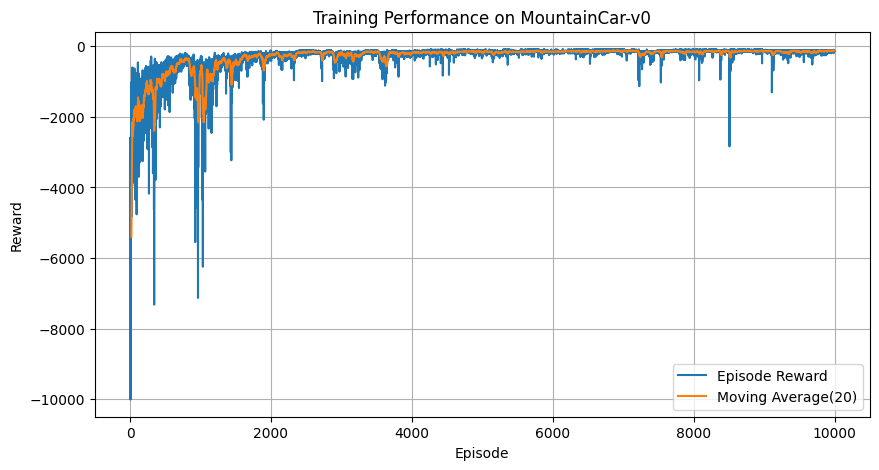

In [13]:

window = 20

if len(all_rewards) >= window:
    smoothed_rewards = [np.mean(all_rewards[i:i+window]) for i in range(len(all_rewards)-window+1)]
else:
    smoothed_rewards = all_rewards  

plt.figure(figsize=(10,5))
plt.plot(all_rewards, label="Episode Reward")
plt.plot(range(window-1, len(all_rewards)), smoothed_rewards, label=f"Moving Average({window})")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.title("Training Performance on MountainCar-v0")
plt.legend()
plt.grid(True)
plt.show()

In [14]:
def agent_actor_critic(observation):
    obs = tf.constant(observation, dtype=tf.float32)
    obs = tf.expand_dims(obs, 0)
    action_logits, _ = model(obs)
    action = np.argmax(action_logits[0].numpy())
    return {"Action": action}

print(average_episodic_return(env_cartpole, agent_actor_critic))

animate_agent(env_cartpole, agent_actor_critic)

{'AverageEpisodicReturn': -118.0, 'StandardDeviation': 15.786069808536892}
